# Electricity price data parsing showcase

In [1]:
import requests
import xmltodict

example_date = '20240525'
zone = '2'
url = f'https://www.atsenergo.ru/market/stats.xml?period=0&date1={example_date}&date2={example_date}&zone={zone}&type=graph'
response = requests.get(url, verify = False) #verify = False --> self-signed cert
content = response.content
result = xmltodict.parse(content)
result

C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\urllib3\connectionpool.py:1103: InsecureRequestWarning: Unverified HTTPS request is being made to host 'www.atsenergo.ru'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


{'view': {'@date1': '20240525',
  '@date2': '20240525',
  '@period': '0',
  'columns': {'name': [{'@type': 'varchar2', '#text': 'DAT'},
    {'@type': 'number', '#text': 'PRICE_ZONE_CODE'},
    {'@type': 'number', '#text': 'CONSUMER_VOLUME'},
    {'@type': 'number', '#text': 'CONSUMER_PRICE'},
    {'@type': 'number', '#text': 'CONSUMER_RD_VOLUME'},
    {'@type': 'number', '#text': 'CONSUMER_SPOT_VOLUME'},
    {'@type': 'number', '#text': 'CONSUMER_PROVIDE_RD'},
    {'@type': 'number', '#text': 'CONSUMER_MAX_PRICE'},
    {'@type': 'number', '#text': 'CONSUMER_MIN_PRICE'},
    {'@type': 'number', '#text': 'SUPPLIER_VOLUME'},
    {'@type': 'number', '#text': 'SUPPLIER_PRICE'},
    {'@type': 'number', '#text': 'SUPPLIER_RD_VOLUME'},
    {'@type': 'number', '#text': 'SUPPLIER_SPOT_VOLUME'},
    {'@type': 'number', '#text': 'SUPPLIER_PROVIDE_RD'},
    {'@type': 'number', '#text': 'SUPPLIER_MAX_PRICE'},
    {'@type': 'number', '#text': 'SUPPLIER_MIN_PRICE'},
    {'@type': 'number', '#text': 'H

In [13]:
from operator import itemgetter

columns = list(map(itemgetter('#text'), result['view']['columns']['name']))
columns

['DAT',
 'PRICE_ZONE_CODE',
 'CONSUMER_VOLUME',
 'CONSUMER_PRICE',
 'CONSUMER_RD_VOLUME',
 'CONSUMER_SPOT_VOLUME',
 'CONSUMER_PROVIDE_RD',
 'CONSUMER_MAX_PRICE',
 'CONSUMER_MIN_PRICE',
 'SUPPLIER_VOLUME',
 'SUPPLIER_PRICE',
 'SUPPLIER_RD_VOLUME',
 'SUPPLIER_SPOT_VOLUME',
 'SUPPLIER_PROVIDE_RD',
 'SUPPLIER_MAX_PRICE',
 'SUPPLIER_MIN_PRICE',
 'HOUR']

In [64]:
rows = list(map(itemgetter('col'), result['view']['row']))
rows

[['25.05.2024',
  '2',
  '22203.125',
  '980.20',
  '1668.294',
  '20280.835',
  '88.748',
  '1272.48',
  '820.00',
  '23182.158',
  '932.06',
  '1668.294',
  '20862.595',
  '87.531',
  '6356.46',
  '820.48',
  '0'],
 ['25.05.2024',
  '2',
  '22199.316',
  '922.71',
  '1753.041',
  '20259.678',
  '160.861',
  '1198.10',
  '780.00',
  '23119.021',
  '879.66',
  '1753.041',
  '20714.249',
  '87.069',
  '6356.46',
  '780.06',
  '1'],
 ['25.05.2024',
  '2',
  '22400.072',
  '979.89',
  '4475.091',
  '17727.977',
  '146.849',
  '1225.10',
  '825.00',
  '23293.364',
  '937.06',
  '4475.091',
  '18456.912',
  '377.439',
  '6356.46',
  '825.21',
  '2'],
 ['25.05.2024',
  '2',
  '22986.104',
  '975.54',
  '4508.715',
  '18273.426',
  '136.163',
  '1244.92',
  '825.35',
  '23949.869',
  '924.85',
  '4508.715',
  '19080.313',
  '377.959',
  '6356.46',
  '825.35',
  '3'],
 ['25.05.2024',
  '2',
  '23689.140',
  '991.68',
  '3768.499',
  '19712.048',
  '104.692',
  '1501.81',
  '825.38',
  '24714.6

In [65]:
len(rows)

24

In [66]:
print(len(columns))
print(len(rows[0]))

17
17


# Parsing data for Russian day-ahead electricity market (РСВ, Рынок "на сутки вперед")

In [84]:
class ElectricityHourPrice:
    def __init__(self, 
                 date, 
                 price_zone_code, 
                 consumer_volume, 
                 consumer_price, 
                 consumer_rd_volume,
                 consumer_spot_volume,
                 consumer_provide_rd,
                 consumer_max_price,
                 consumer_min_price,
                 supplier_volume,
                 supplier_price,
                 supplier_rd_volume,
                 supplier_spot_volume,
                 supplier_provide_rd,
                 supplier_max_price,
                 supplier_min_price,
                 hour):
        self.date = date
        self.price_zone_code = price_zone_code
        self.consumer_volume = consumer_volume
        self.consumer_price = consumer_price
        self.consumer_rd_volume = consumer_rd_volume
        self.consumer_spot_volume = consumer_spot_volume
        self.consumer_provide_rd = consumer_provide_rd
        self.consumer_max_price = consumer_max_price
        self.consumer_min_price = consumer_min_price
        self.supplier_volume = supplier_volume
        self.supplier_price = supplier_price
        self.supplier_rd_volume = supplier_rd_volume
        self.supplier_spot_volume = supplier_spot_volume
        self.supplier_provide_rd = supplier_provide_rd
        self.supplier_max_price = supplier_max_price
        self.supplier_min_price = supplier_min_price
        self.hour = hour

In [90]:
import requests
import xmltodict

def get_prices_by_date(date, zone = '2'):
    f_date = date.strftime('%Y%m%d')
    url = f'https://www.atsenergo.ru/market/stats.xml?period=0&date1={f_date}&date2={f_date}&zone={zone}&type=graph'
    response = requests.get(url, verify = False) #verify = False --> self-signed cert
    content = response.content
    result = xmltodict.parse(content)
    rows = list(map(itemgetter('col'), result['view']['row']))
    return rows

In [114]:
import datetime

start_date = datetime.datetime(2019, 5, 27)
end_date = datetime.datetime(2024, 5, 27)

print(f'Start date: {start_date.strftime("%Y-%m-%d")}')
print(f'End date: {end_date.strftime("%Y-%m-%d")}')
print(f'Time period: {str(end_date - start_date)}')

Start date: 2019-05-27
End date: 2024-05-27
Time period: 1827 days, 0:00:00


In [123]:
import warnings
warnings.filterwarnings("ignore")

electricity_hour_prices = []
cur_date = start_date
print(f'Starting getting prices for {start_date.strftime("%Y-%m-%d")}')
while cur_date <= end_date:
    if (cur_date.day % 7 == 0):
        print(f'Getting prices for {cur_date.strftime("%Y-%m-%d")}')
    try:
        price_rows = get_prices_by_date(cur_date)
        for price_row in price_rows:
            electricity_hour_prices.append(ElectricityHourPrice(*price_row))
    except:
        print(f"Can't get the price data for {cur_date.strftime("%Y-%m-%d")}")
    finally:
        cur_date += datetime.timedelta(days = 1)
print(f'Finished getting prices for {end_date.strftime("%Y-%m-%d")}')

Starting getting prices for 2019-05-27
Getting prices for 2019-05-28
Getting prices for 2019-06-07
Getting prices for 2019-06-14
Getting prices for 2019-06-21
Getting prices for 2019-06-28
Getting prices for 2019-07-07
Getting prices for 2019-07-14
Getting prices for 2019-07-21
Getting prices for 2019-07-28
Getting prices for 2019-08-07
Getting prices for 2019-08-14
Getting prices for 2019-08-21
Getting prices for 2019-08-28
Getting prices for 2019-09-07
Getting prices for 2019-09-14
Getting prices for 2019-09-21
Getting prices for 2019-09-28
Getting prices for 2019-10-07
Getting prices for 2019-10-14
Getting prices for 2019-10-21
Getting prices for 2019-10-28
Getting prices for 2019-11-07
Getting prices for 2019-11-14
Getting prices for 2019-11-21
Getting prices for 2019-11-28
Getting prices for 2019-12-07
Getting prices for 2019-12-14
Getting prices for 2019-12-21
Getting prices for 2019-12-28
Getting prices for 2020-01-07
Getting prices for 2020-01-14
Getting prices for 2020-01-21
G

# Saving dataset

In [124]:
import pandas as pd

df = pd.DataFrame([vars(price_row) for price_row in electricity_hour_prices])
df.to_csv('electricity_price_hourly.csv', index = False)

In [125]:
df

,date,price_zone_code,consumer_volume,consumer_price,consumer_rd_volume,consumer_spot_volume,consumer_provide_rd,consumer_max_price,consumer_min_price,supplier_volume,supplier_price,supplier_rd_volume,supplier_spot_volume,supplier_provide_rd,supplier_max_price,supplier_min_price,hour
0,27.05.2019,2,19685.097,977.14,1346.269,17842.336,20.716,1239.55,792,20241.847,949.9,1346.269,18324.413,155.535,4417.75,788.62,0
1,27.05.2019,2,19726.38,963.62,1415.475,17842.523,46.652,1093.66,824.35,20211.02,942.2,1415.475,18221.361,152.516,4417.75,820.86,1
2,27.05.2019,2,20239.883,973.13,3697.367,16051.952,12.074,1123.16,870.4,20672.191,952.14,3697.367,16719.691,465.667,4417.75,866.65,2
3,27.05.2019,2,20995.16,968.37,3732.538,16775.092,3.755,1117.11,879.52,21433.658,944.93,3732.538,17461.745,481.425,4417.75,875.56,3
4,27.05.2019,2,21609.945,990.7,3110.962,18014.445,5.12,1138.77,899.34,22048.683,966,3110.962,18598.055,384.134,4417.75,895.32,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
43867,27.05.2024,2,23399.518,1296.07,1668.294,21483.007,67.317,1970.20,1047.55,24333.823,1227.36,1668.294,21993.238,75.359,6356.46,1047.55,19
43868,27.05.2024,2,22893.477,1097.29,1668.294,21003.767,93.444,1781.70,758.90,23927.360,1010.99,1668.294,21586.775,75.359,6356.46,758.90,20
43869,27.05.2024,2,22646.207,1002.35,1668.294,20761.271,108.404,1686.50,758.93,23716.348,936.12,1668.294,21375.763,75.359,6356.46,758.93,21
43870,27.05.2024,2,22406.550,956.75,1668.294,20519.151,116.703,1488.00,758.95,23448.293,900.28,1668.294,21107.708,75.359,6356.46,758.95,22


In [136]:
print(f'Dataset contains data for {int(len(df) / 24)} days')

Dataset contains data for 1828 days


In [131]:
df.describe()

,date,price_zone_code,consumer_volume,consumer_price,consumer_rd_volume,consumer_spot_volume,consumer_provide_rd,consumer_max_price,consumer_min_price,supplier_volume,supplier_price,supplier_rd_volume,supplier_spot_volume,supplier_provide_rd,supplier_max_price,supplier_min_price,hour
count,43872,43872,43872,43872,43872,43872,43872,43872,43872,43872,43872,43872,43872,43872,43872,43872,43872
unique,1828,1,43800,34473,488,43775,29803,34007,22607,43805,34432,488,43763,19969,3137,23258,24
top,27.05.2019,2,26630.001,922.01,2771.395,19039.284,0.000,980.00,0.00,26185.000,932.01,2771.395,19382.312,124.22,5966.73,0.00,0
freq,24,43872,2,6,341,2,20,230,917,2,6,341,2,78,2976,797,1828


In [133]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 43872 entries, 0 to 43871
Data columns (total 17 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   date                  43872 non-null  object
 1   price_zone_code       43872 non-null  object
 2   consumer_volume       43872 non-null  object
 3   consumer_price        43872 non-null  object
 4   consumer_rd_volume    43872 non-null  object
 5   consumer_spot_volume  43872 non-null  object
 6   consumer_provide_rd   43872 non-null  object
 7   consumer_max_price    43872 non-null  object
 8   consumer_min_price    43872 non-null  object
 9   supplier_volume       43872 non-null  object
 10  supplier_price        43872 non-null  object
 11  supplier_rd_volume    43872 non-null  object
 12  supplier_spot_volume  43872 non-null  object
 13  supplier_provide_rd   43872 non-null  object
 14  supplier_max_price    43872 non-null  object
 15  supplier_min_price    43872 non-null

# Formatting dataset

## Changing types of columns

In [176]:
df.columns

Index(['date', 'price_zone_code', 'consumer_volume', 'consumer_price',
       'consumer_rd_volume', 'consumer_spot_volume', 'consumer_provide_rd',
       'consumer_max_price', 'consumer_min_price', 'supplier_volume',
       'supplier_price', 'supplier_rd_volume', 'supplier_spot_volume',
       'supplier_provide_rd', 'supplier_max_price', 'supplier_min_price',
       'hour'],
      dtype='object')

In [177]:
df_form = df.copy()

In [178]:
df.columns[2:-1]

Index(['consumer_volume', 'consumer_price', 'consumer_rd_volume',
       'consumer_spot_volume', 'consumer_provide_rd', 'consumer_max_price',
       'consumer_min_price', 'supplier_volume', 'supplier_price',
       'supplier_rd_volume', 'supplier_spot_volume', 'supplier_provide_rd',
       'supplier_max_price', 'supplier_min_price'],
      dtype='object')

In [179]:
df_form[df.columns[1:-1]] = df_form[df.columns[1:-1]].astype(float)
df_form['hour'] = df_form['hour'].astype(int)
df_form['price_zone_code'] = df_form['price_zone_code'].astype(int)
df_form.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 43872 entries, 0 to 43871
Data columns (total 17 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   date                  43872 non-null  object 
 1   price_zone_code       43872 non-null  int32  
 2   consumer_volume       43872 non-null  float64
 3   consumer_price        43872 non-null  float64
 4   consumer_rd_volume    43872 non-null  float64
 5   consumer_spot_volume  43872 non-null  float64
 6   consumer_provide_rd   43872 non-null  float64
 7   consumer_max_price    43872 non-null  float64
 8   consumer_min_price    43872 non-null  float64
 9   supplier_volume       43872 non-null  float64
 10  supplier_price        43872 non-null  float64
 11  supplier_rd_volume    43872 non-null  float64
 12  supplier_spot_volume  43872 non-null  float64
 13  supplier_provide_rd   43872 non-null  float64
 14  supplier_max_price    43872 non-null  float64
 15  supplier_min_price 

## Setting the datetime index

In [180]:
dates_from_table = df_form['date']
hours_from_table = df_form['hour']

In [181]:
from datetime import datetime

dates = [datetime.strptime(i, '%d.%m.%Y') for i in dates_from_table]
dates = [item[0].replace(hour = item[1]) for item in zip(dates, hours_from_table)]
dates[:30]

[datetime.datetime(2019, 5, 27, 0, 0),
 datetime.datetime(2019, 5, 27, 1, 0),
 datetime.datetime(2019, 5, 27, 2, 0),
 datetime.datetime(2019, 5, 27, 3, 0),
 datetime.datetime(2019, 5, 27, 4, 0),
 datetime.datetime(2019, 5, 27, 5, 0),
 datetime.datetime(2019, 5, 27, 6, 0),
 datetime.datetime(2019, 5, 27, 7, 0),
 datetime.datetime(2019, 5, 27, 8, 0),
 datetime.datetime(2019, 5, 27, 9, 0),
 datetime.datetime(2019, 5, 27, 10, 0),
 datetime.datetime(2019, 5, 27, 11, 0),
 datetime.datetime(2019, 5, 27, 12, 0),
 datetime.datetime(2019, 5, 27, 13, 0),
 datetime.datetime(2019, 5, 27, 14, 0),
 datetime.datetime(2019, 5, 27, 15, 0),
 datetime.datetime(2019, 5, 27, 16, 0),
 datetime.datetime(2019, 5, 27, 17, 0),
 datetime.datetime(2019, 5, 27, 18, 0),
 datetime.datetime(2019, 5, 27, 19, 0),
 datetime.datetime(2019, 5, 27, 20, 0),
 datetime.datetime(2019, 5, 27, 21, 0),
 datetime.datetime(2019, 5, 27, 22, 0),
 datetime.datetime(2019, 5, 27, 23, 0),
 datetime.datetime(2019, 5, 28, 0, 0),
 datetime.d

In [185]:
df_form.drop(columns = ['date', 'hour'], inplace = True)
df_form['date'] = dates
df_form['date'] = pd.to_datetime(df_form['date'], utc = True)
df_form = df_form.set_index('date')
df_form = df_form.asfreq('1H')
df_form.sort_index(inplace = True)
df_form

,price_zone_code,consumer_volume,consumer_price,consumer_rd_volume,consumer_spot_volume,consumer_provide_rd,consumer_max_price,consumer_min_price,supplier_volume,supplier_price,supplier_rd_volume,supplier_spot_volume,supplier_provide_rd,supplier_max_price,supplier_min_price
date,,,,,,,,,,,,,,,
2019-05-27 00:00:00+00:00,2,19685.097,977.14,1346.269,17842.336,20.716,1239.55,792.00,20241.847,949.90,1346.269,18324.413,155.535,4417.75,788.62
2019-05-27 01:00:00+00:00,2,19726.380,963.62,1415.475,17842.523,46.652,1093.66,824.35,20211.020,942.20,1415.475,18221.361,152.516,4417.75,820.86
2019-05-27 02:00:00+00:00,2,20239.883,973.13,3697.367,16051.952,12.074,1123.16,870.40,20672.191,952.14,3697.367,16719.691,465.667,4417.75,866.65
2019-05-27 03:00:00+00:00,2,20995.160,968.37,3732.538,16775.092,3.755,1117.11,879.52,21433.658,944.93,3732.538,17461.745,481.425,4417.75,875.56
2019-05-27 04:00:00+00:00,2,21609.945,990.70,3110.962,18014.445,5.120,1138.77,899.34,22048.683,966.00,3110.962,18598.055,384.134,4417.75,895.32
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-05-27 19:00:00+00:00,2,23399.518,1296.07,1668.294,21483.007,67.317,1970.20,1047.55,24333.823,1227.36,1668.294,21993.238,75.359,6356.46,1047.55
2024-05-27 20:00:00+00:00,2,22893.477,1097.29,1668.294,21003.767,93.444,1781.70,758.90,23927.360,1010.99,1668.294,21586.775,75.359,6356.46,758.90
2024-05-27 21:00:00+00:00,2,22646.207,1002.35,1668.294,20761.271,108.404,1686.50,758.93,23716.348,936.12,1668.294,21375.763,75.359,6356.46,758.93


### Verify the order of index

In [186]:
def verify_index(df):
    try:
        return (df.index == pd.date_range(start = df.index.min(), end = df.index.max(), freq = df.index.freq)).all()
    except:
        print("Error: can't verify temporary index")
        return False

verify_index(df_form)

True

## Saving to CSV

In [187]:
df_form.to_csv('electricity_price_hourly_formatted.csv', index = True)

# Dataset analysis

In [188]:
df = df_form.copy()

## Dataset lookup

In [189]:
def dataset_lookup(df):
    print('Dataset info:')
    print(df.info())
    print()
    print('Dataset description:')
    print(df.describe())
    print()
    print('Amount of duplicates:')
    duplicates_amount = df.duplicated().sum()
    print(duplicates_amount)
    if (duplicates_amount > 0):
        print('Duplicates:')
        print(df[df.duplicated(keep = False)])
    print()
    print('Amount of missing values:')
    print(df.isna().sum(axis = 0))
    print()
    print('Unique values in each column:')
    object_types_count = 0
    for column in df:
        if df[column].dtypes == 'object':
            object_types_count += 1
            print('-' * len(column))
            print(f'{column}: {df[column].unique()}')
    if object_types_count == 0:
        print('-' * 10)
        print('No object columns in this dataset.')

dataset_lookup(df)

Dataset info:
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 43872 entries, 2019-05-27 00:00:00+00:00 to 2024-05-27 23:00:00+00:00
Freq: H
Data columns (total 15 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   price_zone_code       43872 non-null  int32  
 1   consumer_volume       43872 non-null  float64
 2   consumer_price        43872 non-null  float64
 3   consumer_rd_volume    43872 non-null  float64
 4   consumer_spot_volume  43872 non-null  float64
 5   consumer_provide_rd   43872 non-null  float64
 6   consumer_max_price    43872 non-null  float64
 7   consumer_min_price    43872 non-null  float64
 8   supplier_volume       43872 non-null  float64
 9   supplier_price        43872 non-null  float64
 10  supplier_rd_volume    43872 non-null  float64
 11  supplier_spot_volume  43872 non-null  float64
 12  supplier_provide_rd   43872 non-null  float64
 13  supplier_max_price    43872 non-null  float64
 14  s

In [190]:
df.describe()

,price_zone_code,consumer_volume,consumer_price,consumer_rd_volume,consumer_spot_volume,consumer_provide_rd,consumer_max_price,consumer_min_price,supplier_volume,supplier_price,supplier_rd_volume,supplier_spot_volume,supplier_provide_rd,supplier_max_price,supplier_min_price
count,43872.0,43872.000000,43872.000000,43872.000000,43872.000000,43872.000000,43872.000000,43872.000000,43872.000000,43872.000000,43872.000000,43872.000000,43872.000000,43872.000000,43872.000000
mean,2.0,24211.114521,1044.620885,3663.979157,20019.487203,23.893816,1449.213132,718.248190,24973.238956,975.604264,3663.979157,20747.124959,363.095453,4979.341300,722.996230
std,0.0,3109.022687,255.756966,1858.698386,2590.859508,22.158082,309.589501,257.914575,3150.538393,257.658681,1858.698386,2498.980554,305.284683,1234.409079,249.690466
min,2.0,17526.585000,8.630000,1049.615000,13552.577000,0.000000,459.430000,0.000000,17867.347000,0.450000,1049.615000,14386.980000,11.839000,302.210000,0.000000
25%,2.0,21643.704000,879.950000,2166.228000,18050.149750,8.785750,1220.415000,641.087500,22399.867000,822.787500,2166.228000,18868.168750,152.168000,4655.060000,647.640000
50%,2.0,24103.036500,1002.190000,3338.126000,19813.142000,17.587500,1419.355000,733.905000,24793.907000,935.885000,3338.126000,20560.325500,263.941000,5004.370000,738.030000
75%,2.0,26620.404750,1229.737500,4569.899000,21945.433500,32.142250,1661.895000,846.642500,27380.783750,1152.600000,4569.899000,22587.196750,457.731000,5966.180000,845.522500
max,2.0,33387.071000,2276.610000,9899.658000,28930.396000,571.790000,5167.220000,1452.730000,34549.563000,2005.860000,9899.658000,29500.421000,2191.624000,6579.430000,1452.740000


In [191]:
df

,price_zone_code,consumer_volume,consumer_price,consumer_rd_volume,consumer_spot_volume,consumer_provide_rd,consumer_max_price,consumer_min_price,supplier_volume,supplier_price,supplier_rd_volume,supplier_spot_volume,supplier_provide_rd,supplier_max_price,supplier_min_price
date,,,,,,,,,,,,,,,
2019-05-27 00:00:00+00:00,2,19685.097,977.14,1346.269,17842.336,20.716,1239.55,792.00,20241.847,949.90,1346.269,18324.413,155.535,4417.75,788.62
2019-05-27 01:00:00+00:00,2,19726.380,963.62,1415.475,17842.523,46.652,1093.66,824.35,20211.020,942.20,1415.475,18221.361,152.516,4417.75,820.86
2019-05-27 02:00:00+00:00,2,20239.883,973.13,3697.367,16051.952,12.074,1123.16,870.40,20672.191,952.14,3697.367,16719.691,465.667,4417.75,866.65
2019-05-27 03:00:00+00:00,2,20995.160,968.37,3732.538,16775.092,3.755,1117.11,879.52,21433.658,944.93,3732.538,17461.745,481.425,4417.75,875.56
2019-05-27 04:00:00+00:00,2,21609.945,990.70,3110.962,18014.445,5.120,1138.77,899.34,22048.683,966.00,3110.962,18598.055,384.134,4417.75,895.32
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-05-27 19:00:00+00:00,2,23399.518,1296.07,1668.294,21483.007,67.317,1970.20,1047.55,24333.823,1227.36,1668.294,21993.238,75.359,6356.46,1047.55
2024-05-27 20:00:00+00:00,2,22893.477,1097.29,1668.294,21003.767,93.444,1781.70,758.90,23927.360,1010.99,1668.294,21586.775,75.359,6356.46,758.90
2024-05-27 21:00:00+00:00,2,22646.207,1002.35,1668.294,20761.271,108.404,1686.50,758.93,23716.348,936.12,1668.294,21375.763,75.359,6356.46,758.93


## Values visual analysis

### Consumer values plots

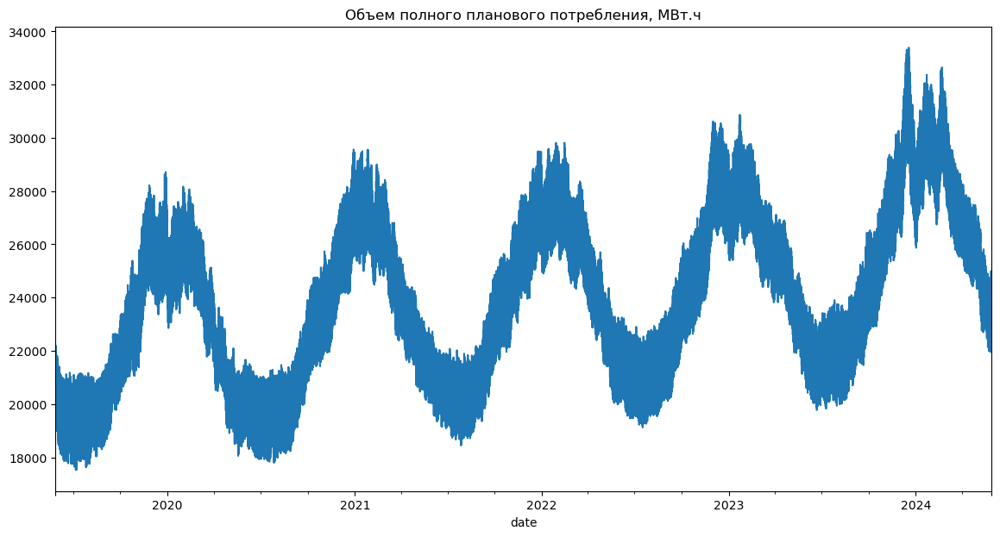

In [199]:
import matplotlib.pyplot as plt

plt.figure(figsize = (14, 7))
df['consumer_volume'].plot()
plt.title('Объем полного планового потребления, МВт.ч')
plt.show()

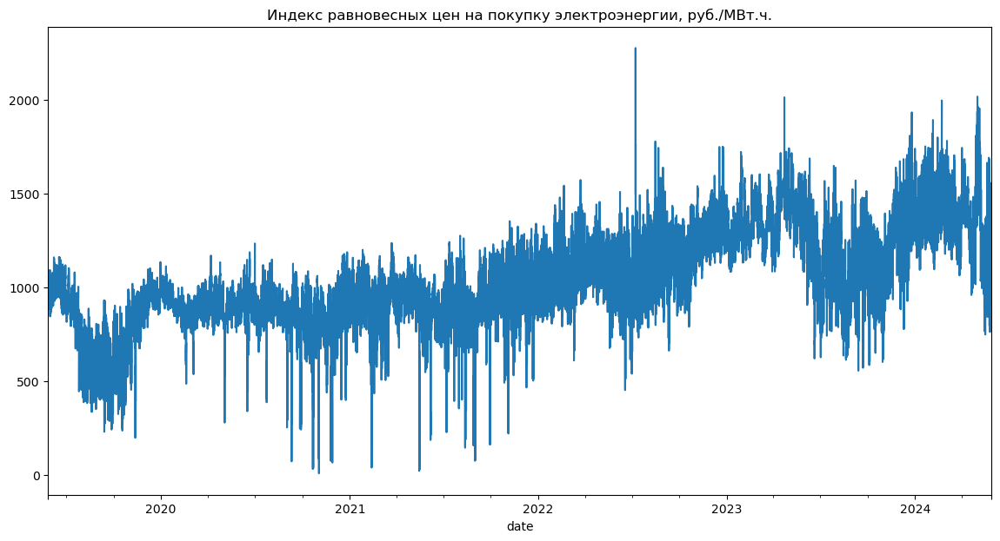

In [200]:
plt.figure(figsize = (14, 7))
df['consumer_price'].plot()
plt.title('Индекс равновесных цен на покупку электроэнергии, руб./МВт.ч.')
plt.show()

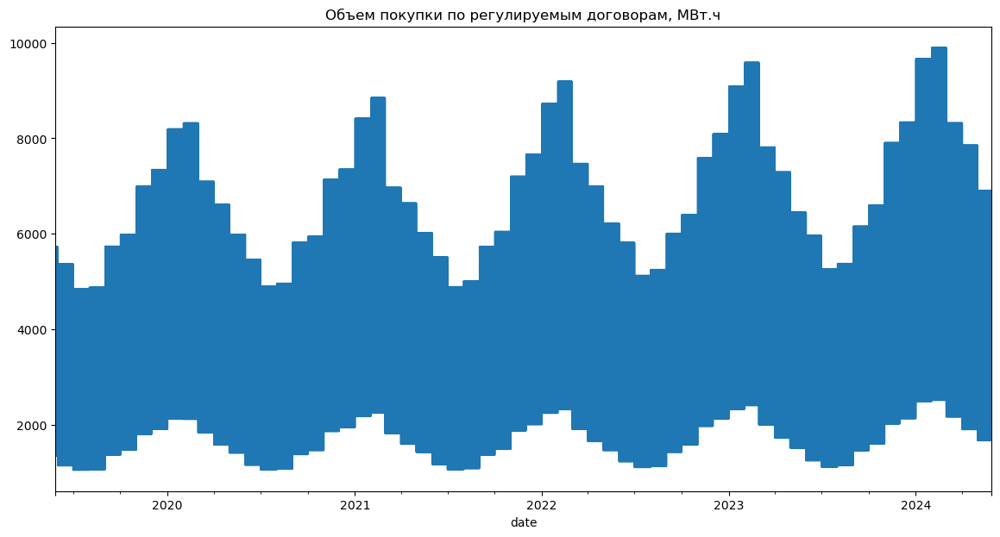

In [201]:
plt.figure(figsize = (14, 7))
df['consumer_rd_volume'].plot()
plt.title('Объем покупки по регулируемым договорам, МВт.ч')
plt.show()

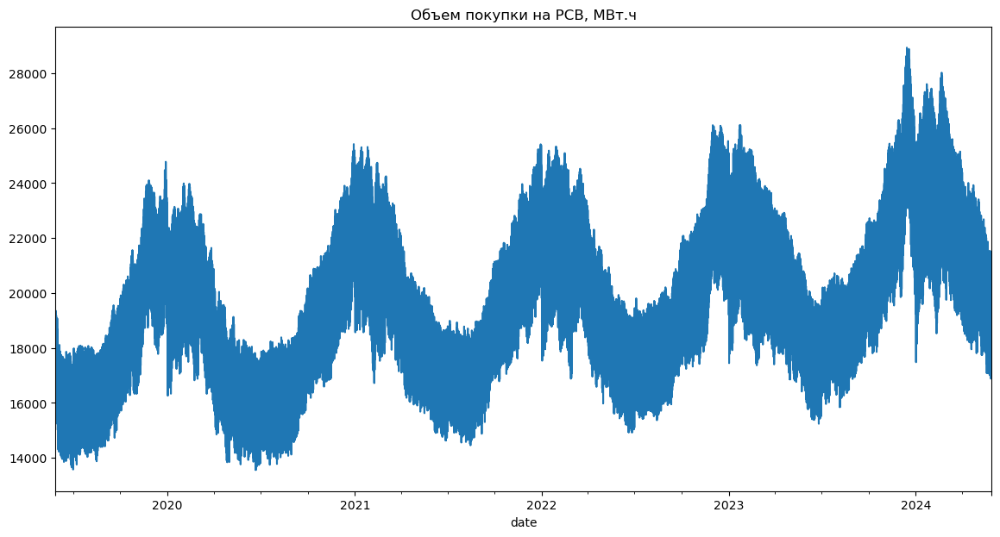

In [202]:
plt.figure(figsize = (14, 7))
df['consumer_spot_volume'].plot()
plt.title('Объем покупки на РСВ, МВт.ч')
plt.show()

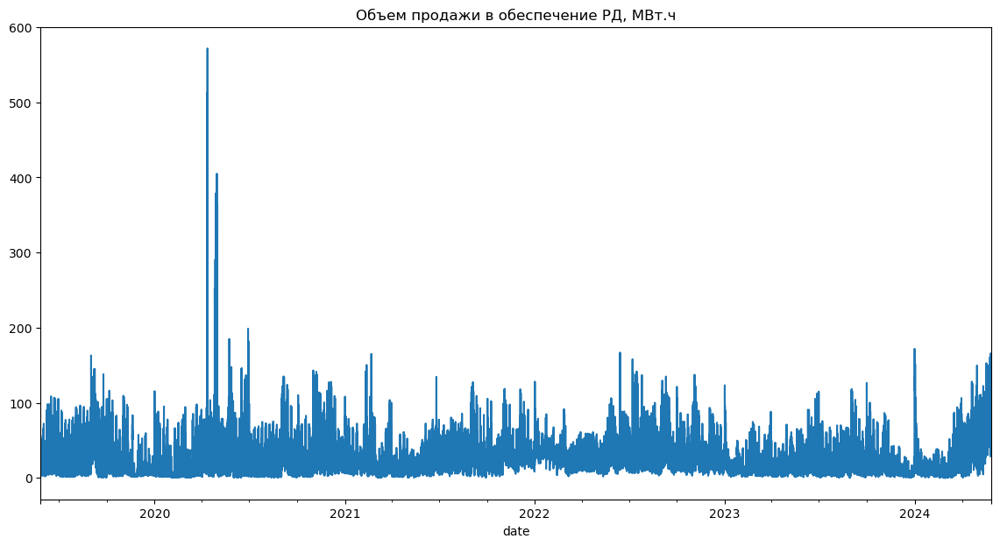

In [203]:
plt.figure(figsize = (14, 7))
df['consumer_provide_rd'].plot()
plt.title('Объем продажи в обеспечение РД, МВт.ч')
plt.show()

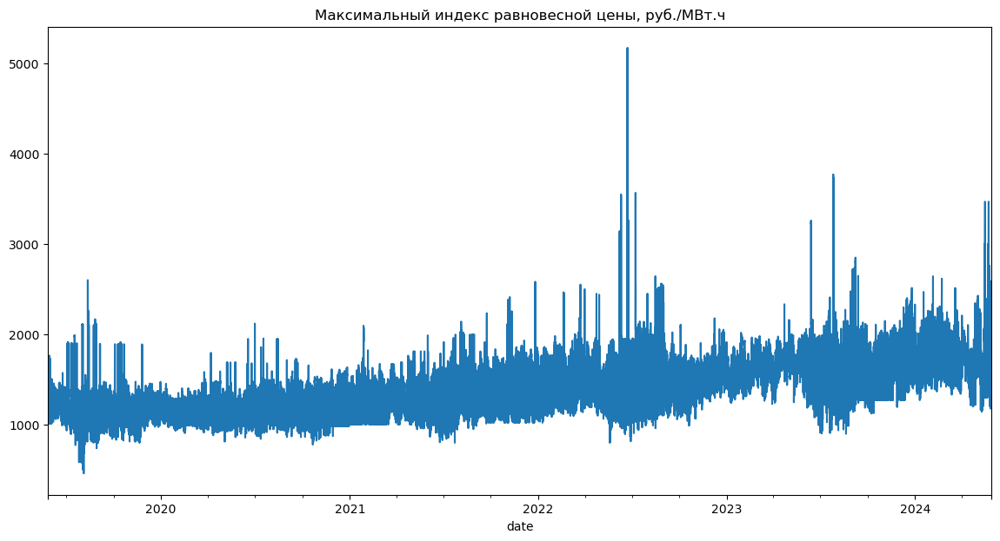

In [204]:
plt.figure(figsize = (14, 7))
df['consumer_max_price'].plot()
plt.title('Максимальный индекс равновесной цены, руб./МВт.ч')
plt.show()

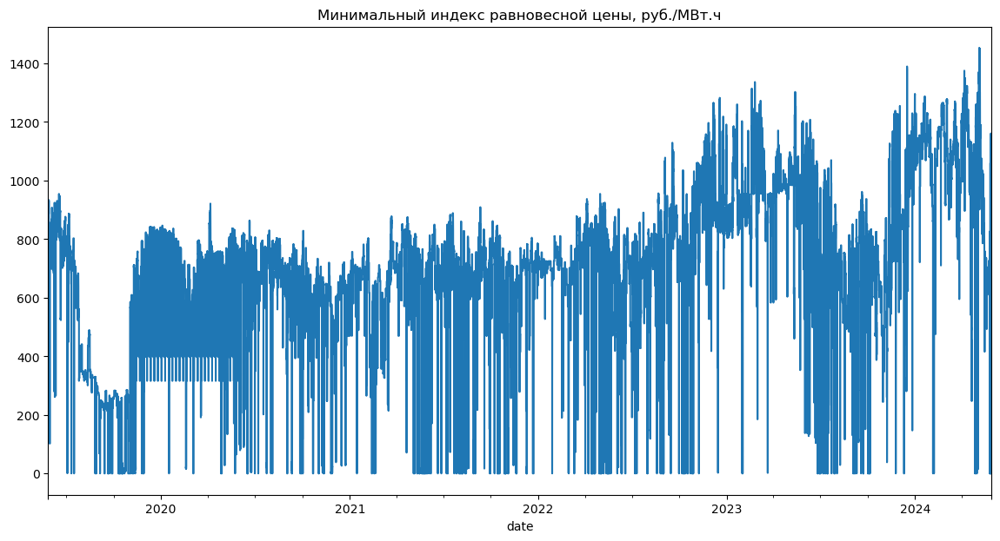

In [205]:
plt.figure(figsize = (14, 7))
df['consumer_min_price'].plot()
plt.title('Минимальный индекс равновесной цены, руб./МВт.ч')
plt.show()

### Supplier values plots

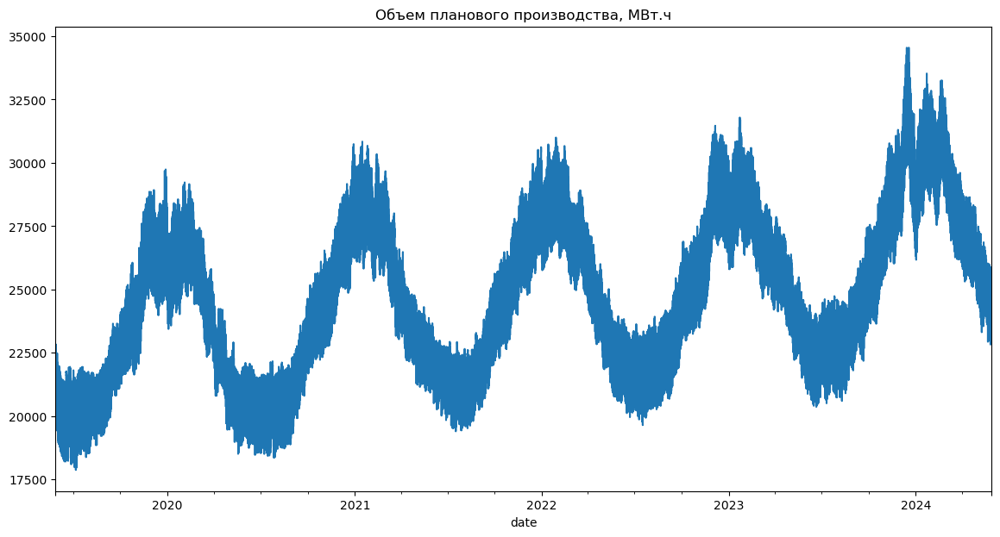

In [206]:
plt.figure(figsize = (14, 7))
df['supplier_volume'].plot()
plt.title('Объем планового производства, МВт.ч')
plt.show()

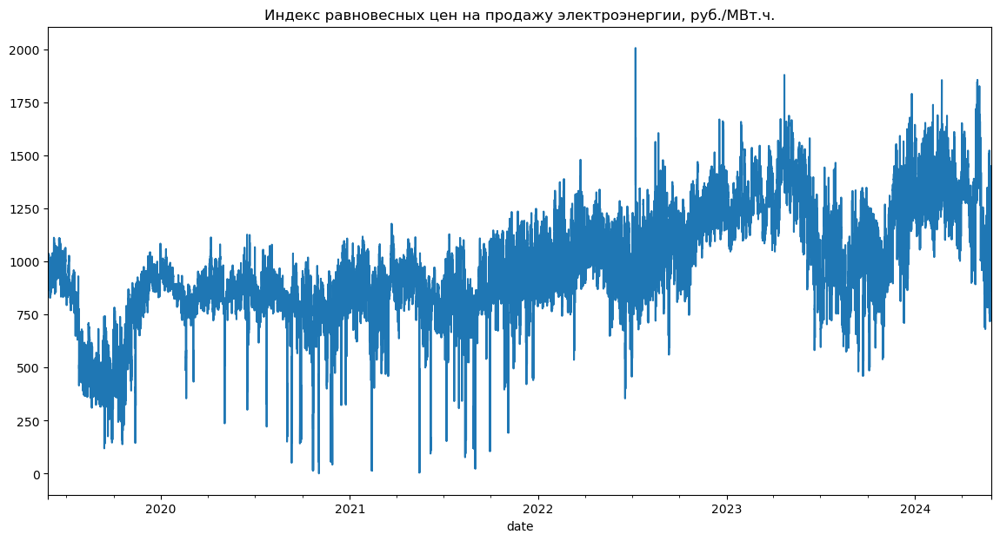

In [207]:
plt.figure(figsize = (14, 7))
df['supplier_price'].plot()
plt.title('Индекс равновесных цен на продажу электроэнергии, руб./МВт.ч.')
plt.show()

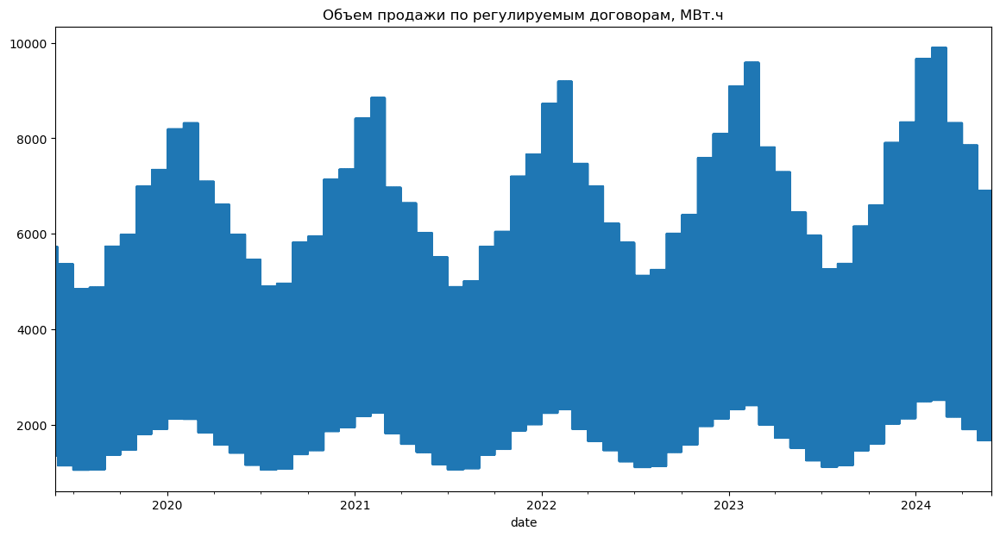

In [208]:
plt.figure(figsize = (14, 7))
df['supplier_rd_volume'].plot()
plt.title('Объем продажи по регулируемым договорам, МВт.ч')
plt.show()

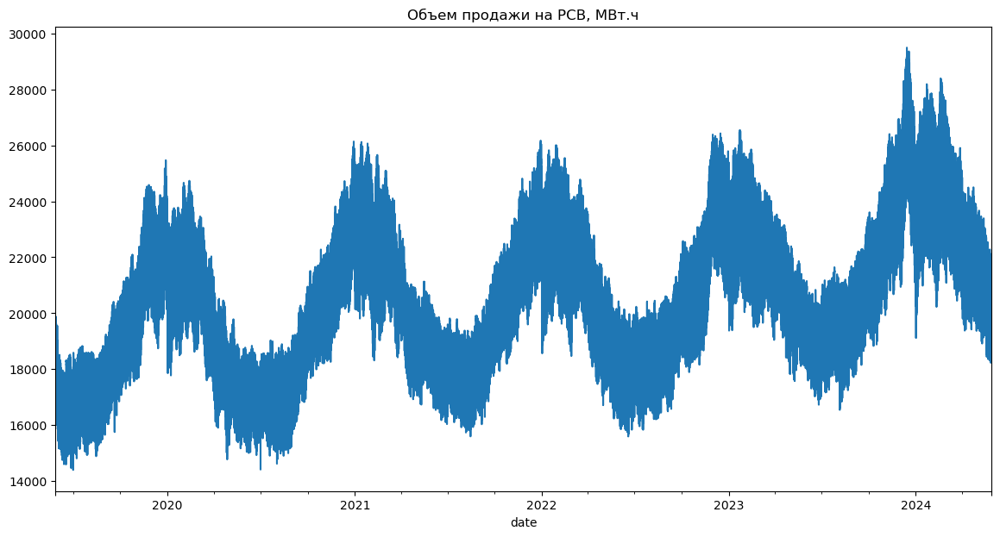

In [209]:
plt.figure(figsize = (14, 7))
df['supplier_spot_volume'].plot()
plt.title('Объем продажи на РСВ, МВт.ч')
plt.show()

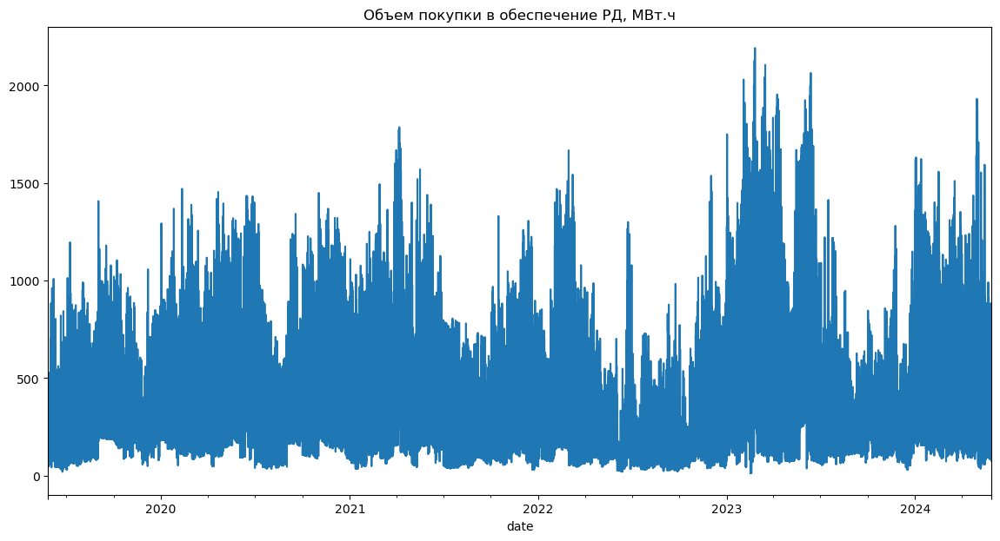

In [210]:
plt.figure(figsize = (14, 7))
df['supplier_provide_rd'].plot()
plt.title('Объем покупки в обеспечение РД, МВт.ч')
plt.show()

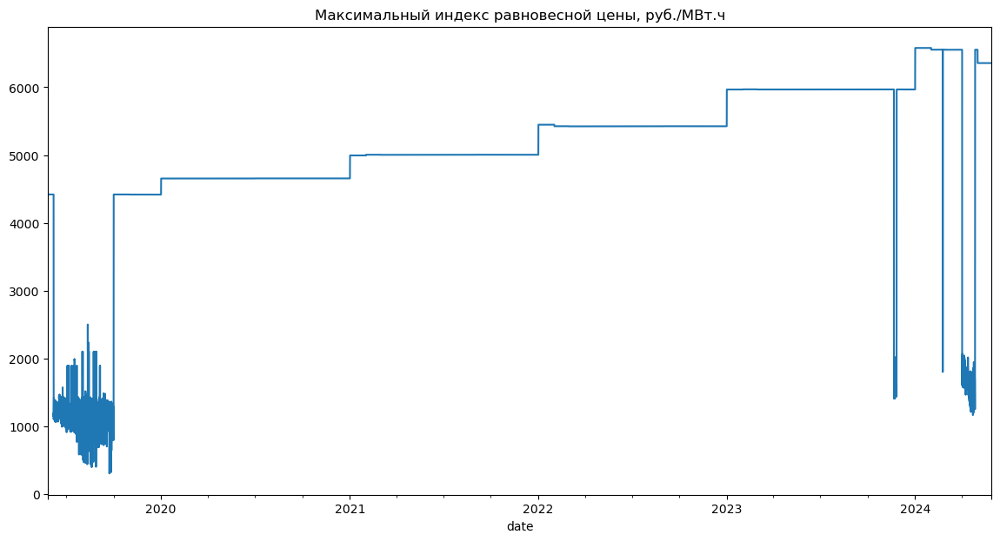

In [211]:
plt.figure(figsize = (14, 7))
df['supplier_max_price'].plot()
plt.title('Максимальный индекс равновесной цены, руб./МВт.ч')
plt.show()

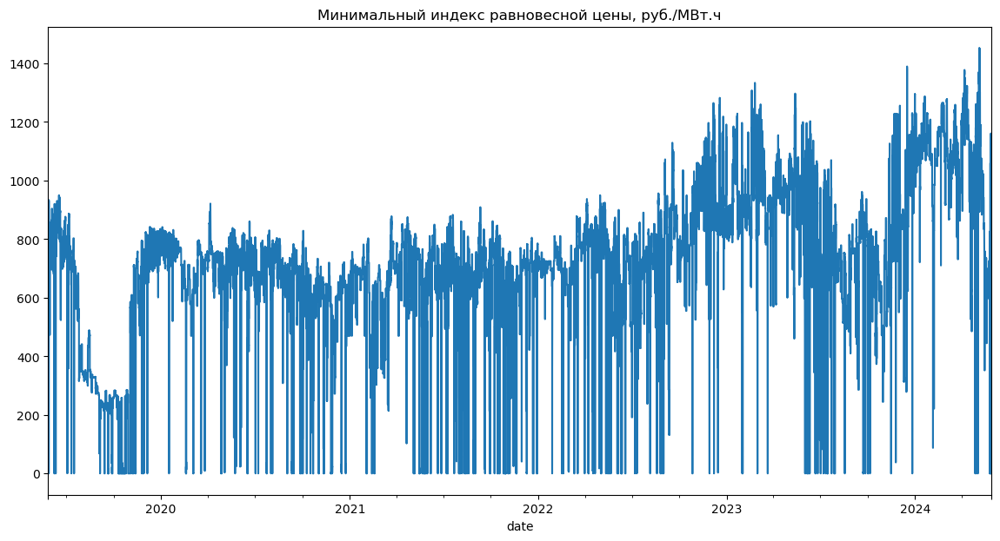

In [212]:
plt.figure(figsize = (14, 7))
df['supplier_min_price'].plot()
plt.title('Минимальный индекс равновесной цены, руб./МВт.ч')
plt.show()

### Histograms

<Figure size 1400x700 with 0 Axes>

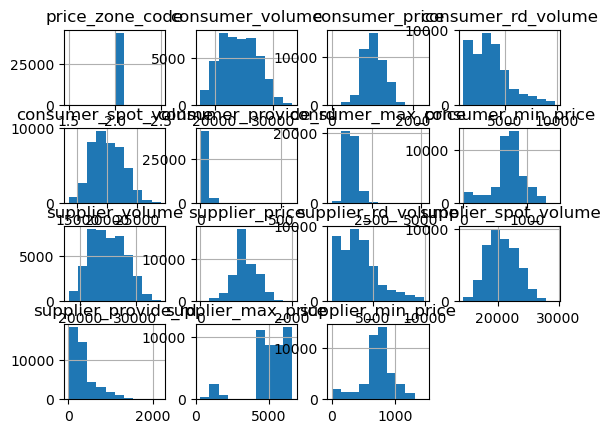

In [214]:
def plot_dataset_histograms(df):
    plt.figure(figsize = (14, 7))
    df.hist()
    plt.show()

plot_dataset_histograms(df)

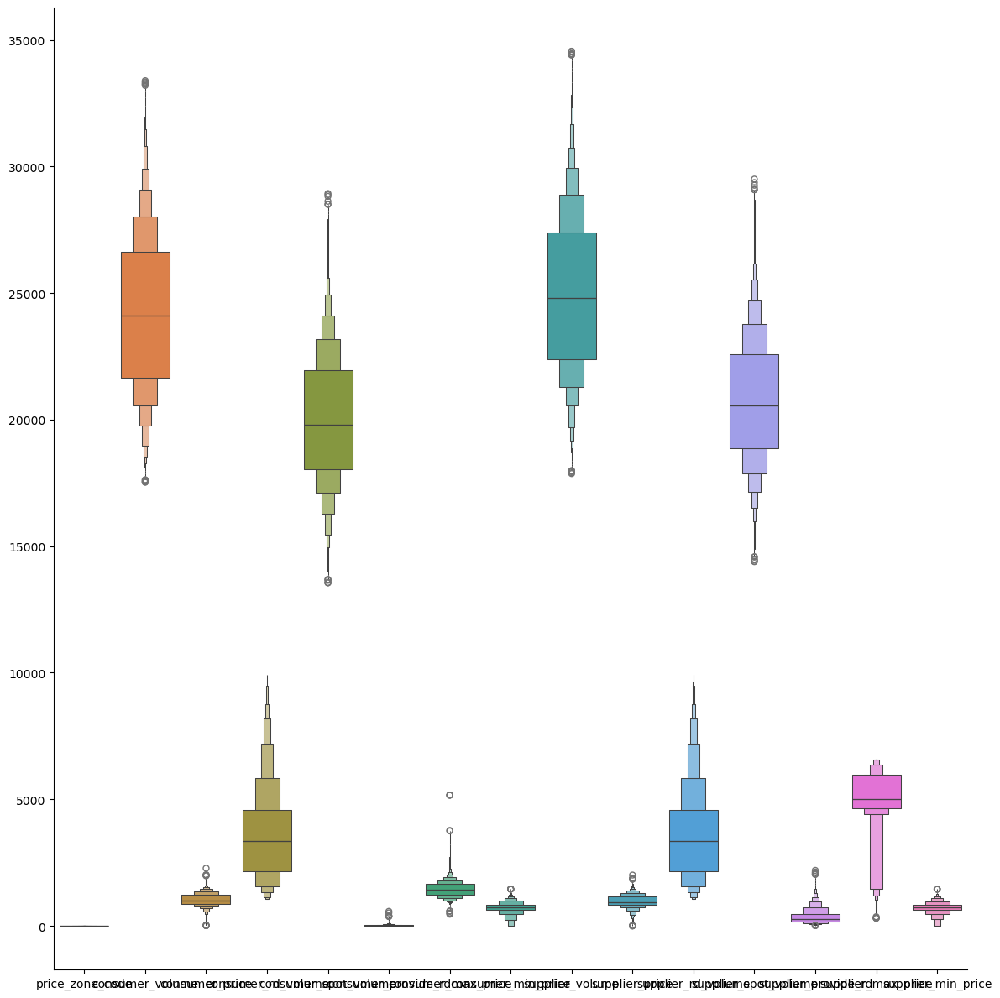

In [219]:
def show_cat_plot(df):
    sb.catplot(df, kind = 'boxen', height = 12)
    plt.show()

show_cat_plot(df)

### Pair plot

<Figure size 2500x2500 with 0 Axes>

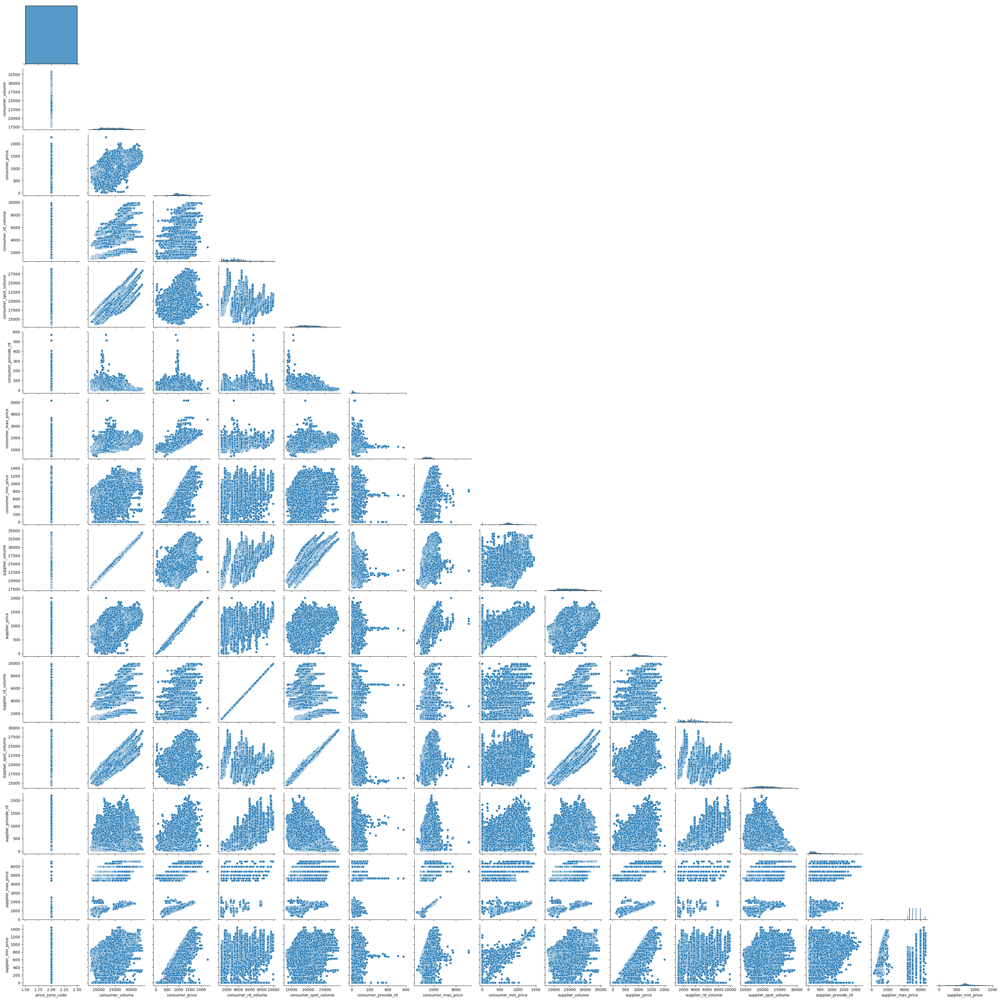

In [223]:
def show_pair_plot(df, figure_size = (15, 15), target_name = None):
    plt.figure(figsize = figure_size)
    df_without_object_columns = df.select_dtypes(exclude = ['object'])
    if target_name != None:
        sb.pairplot(df_without_object_columns, corner = True, palette = 'tab10', hue = target_name)
    else:
        sb.pairplot(df_without_object_columns, corner = True)
    plt.show()
    
show_pair_plot(df, figure_size = (25, 25))

### Correlation map

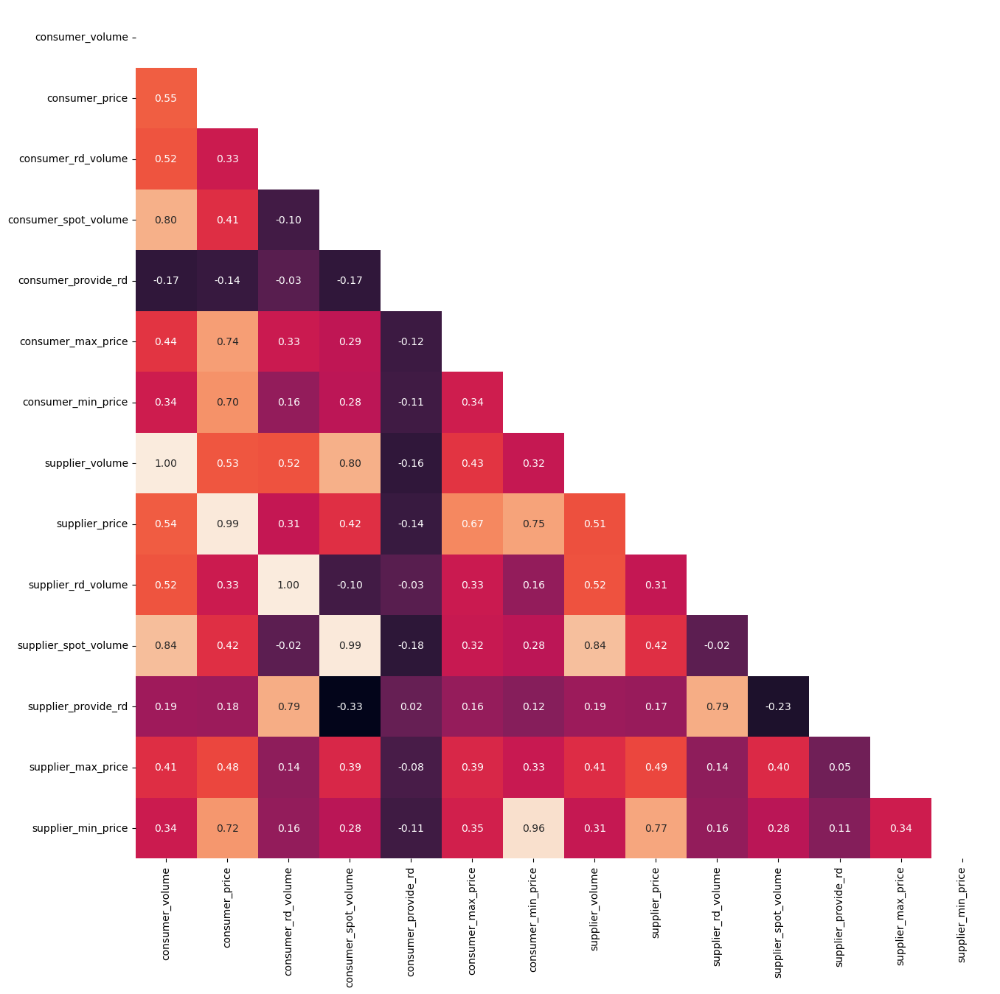

In [225]:
import numpy as np

def show_correlation_map(df, figure_size = (15, 15)):
    plt.figure(figsize = figure_size)
    corr_matrix = df.select_dtypes(exclude = ['object']).corr()
    lower = corr_matrix.where(np.tril(np.ones(corr_matrix.shape), k = -1).astype(np.bool_))
    sb.heatmap(
        lower,
        annot = True,
        fmt = '.2f',
        cbar = False)
    plt.show()

show_correlation_map(df.drop(columns = 'price_zone_code'))

### Autocorretalion

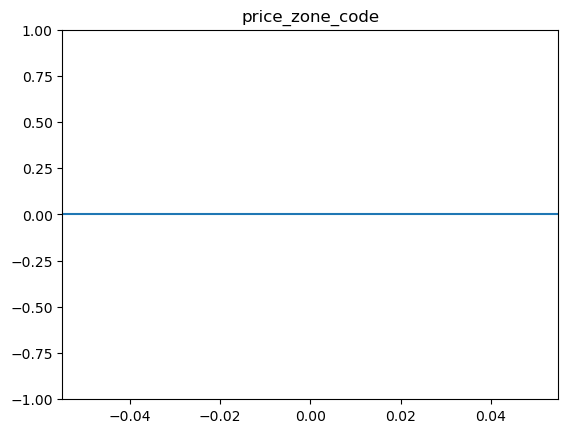

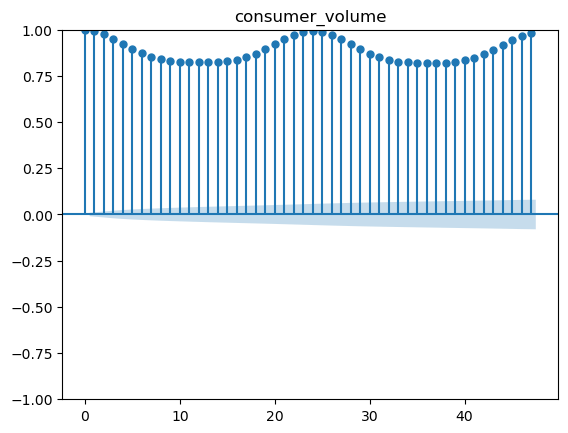

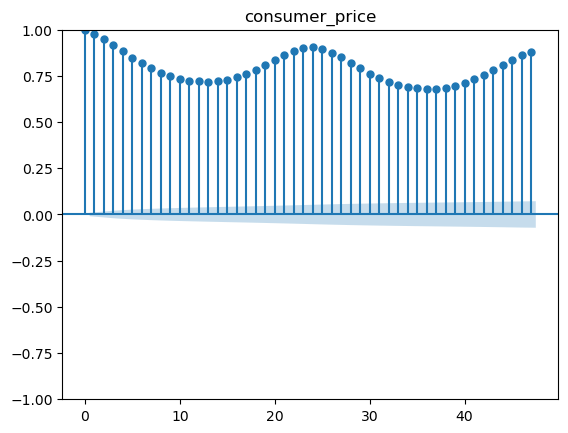

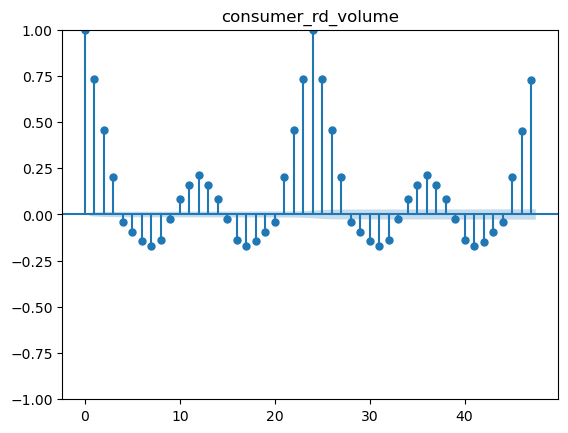

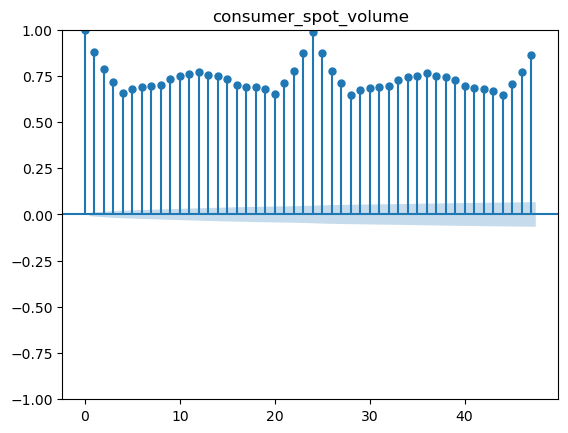

...

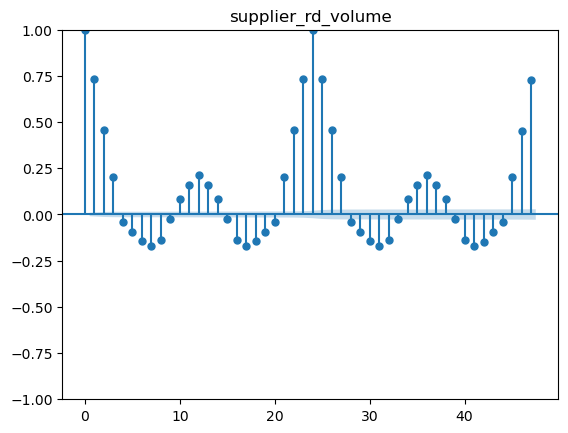

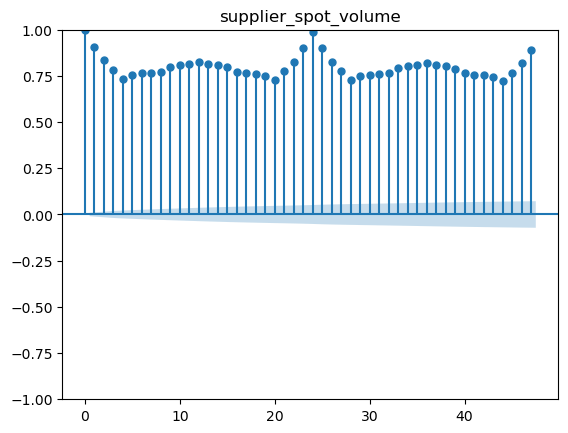

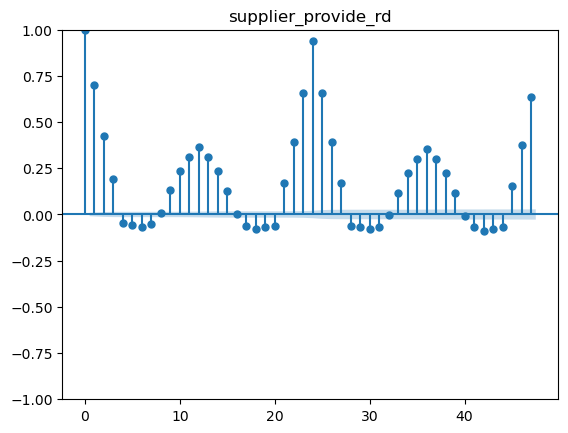

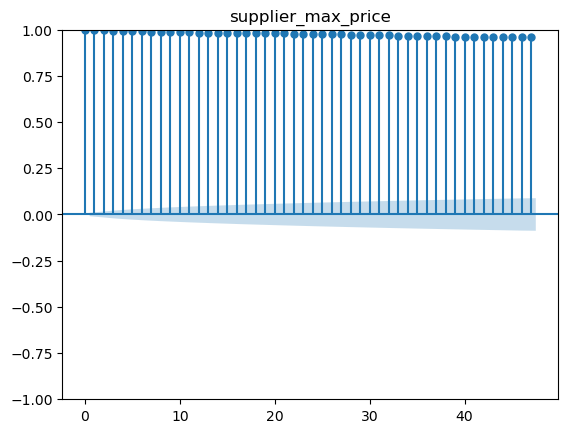

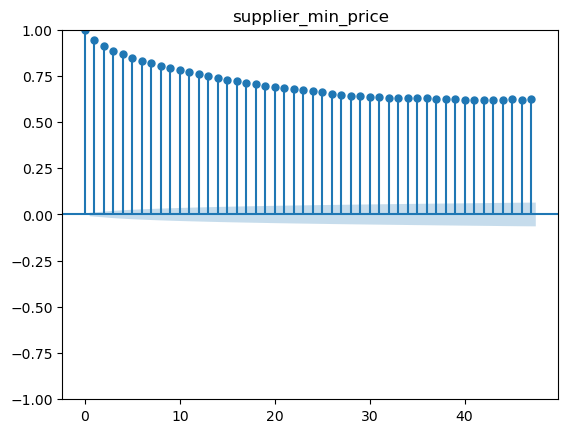

In [227]:
from statsmodels.graphics.tsaplots import plot_acf

def make_acf_plots(df):
    for column in df:
        if df[column].dtypes == 'object':
            continue
        plot_acf(
            df[column].to_numpy(),
            title = column,
            missing = 'drop')
        plt.show()

make_acf_plots(df)

### Partial autocorrelation

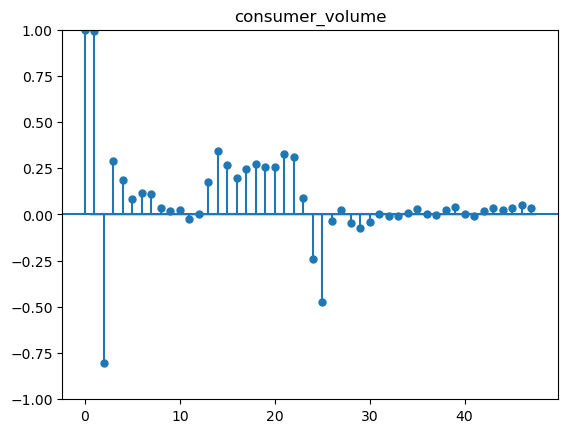

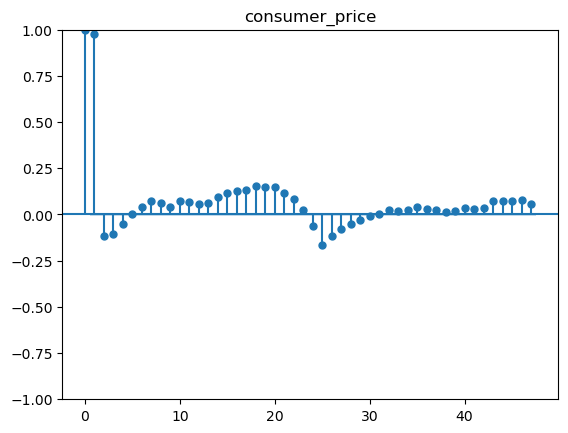

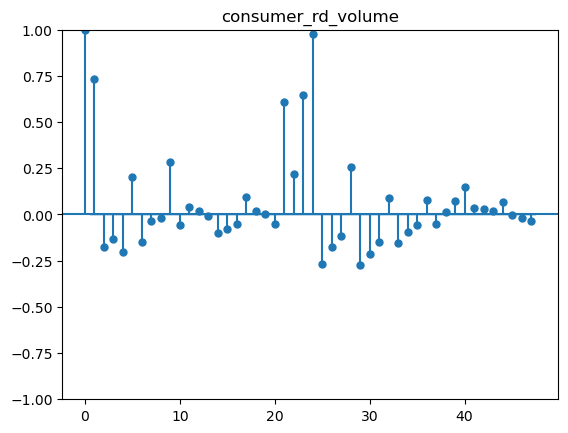

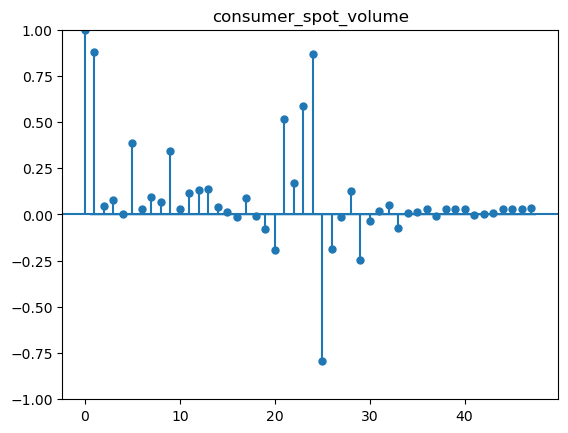

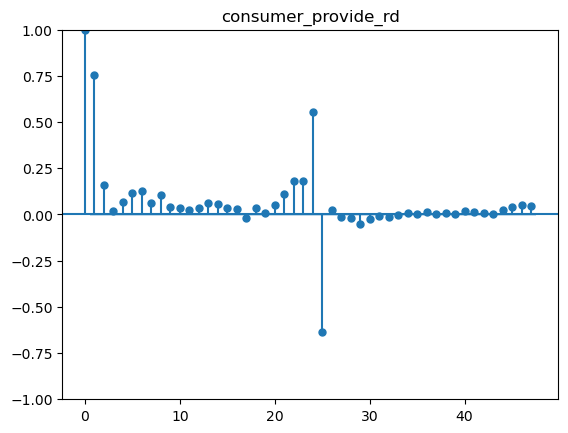

...

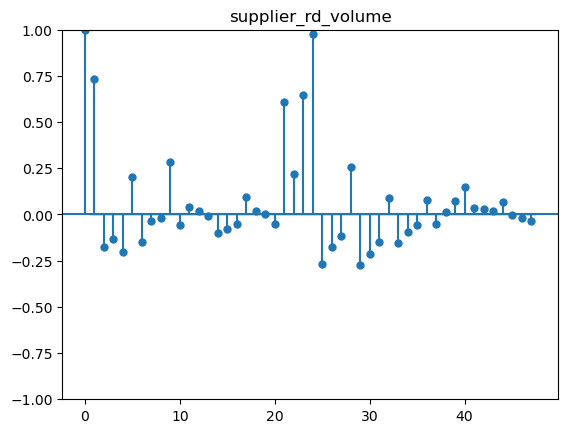

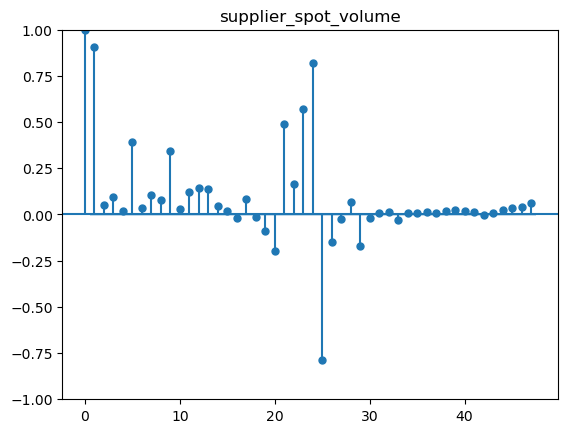

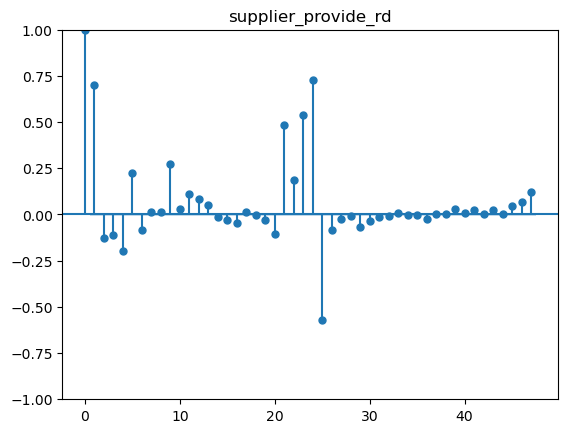

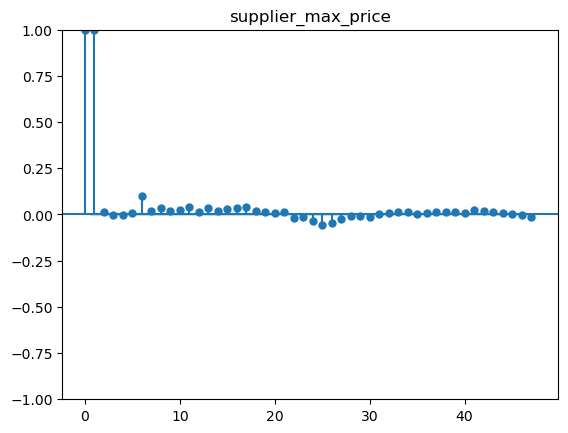

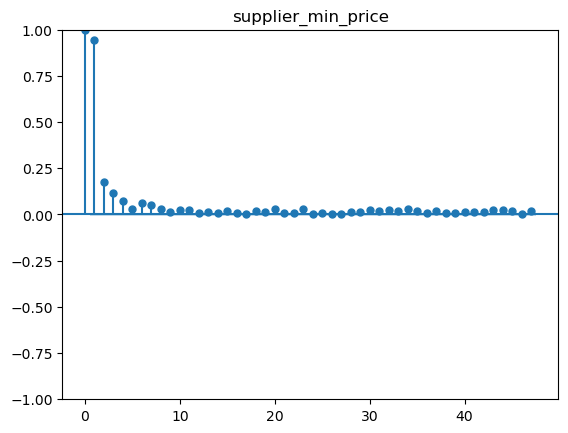

In [229]:
from statsmodels.graphics.tsaplots import plot_pacf

def make_pacf_plots(df):
    for column in df:
        if df[column].dtypes == 'object':
            continue
        plot_pacf(
            df[column].to_numpy(),
            title = column)
        plt.show()     

make_pacf_plots(df.drop(columns = 'price_zone_code'))

### Seasonal decomposition

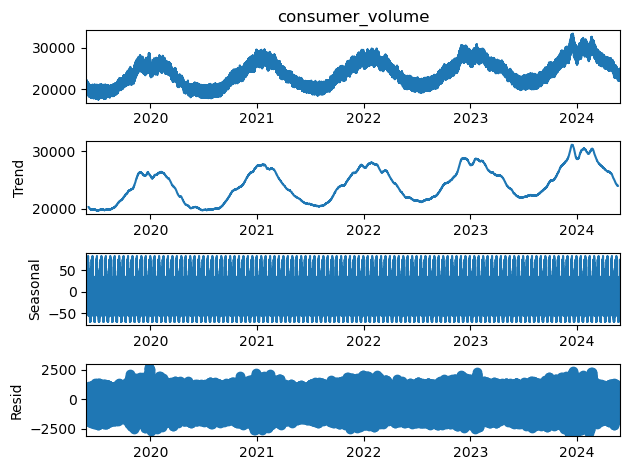

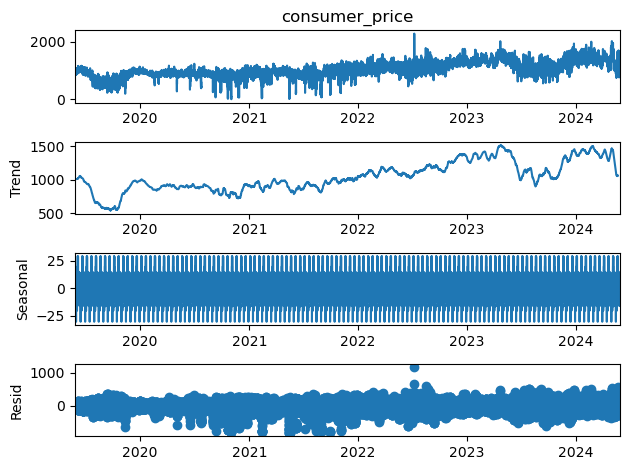

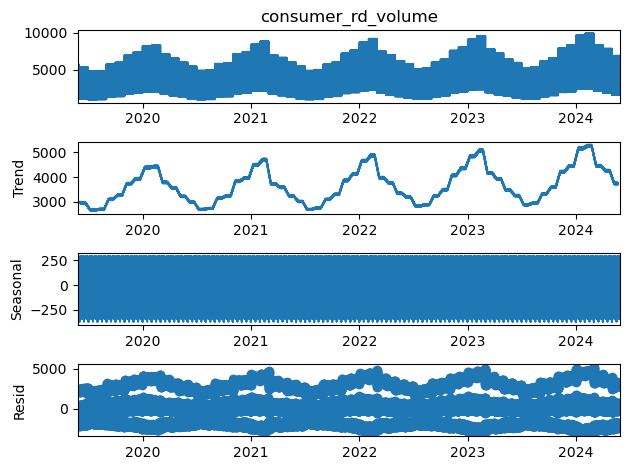

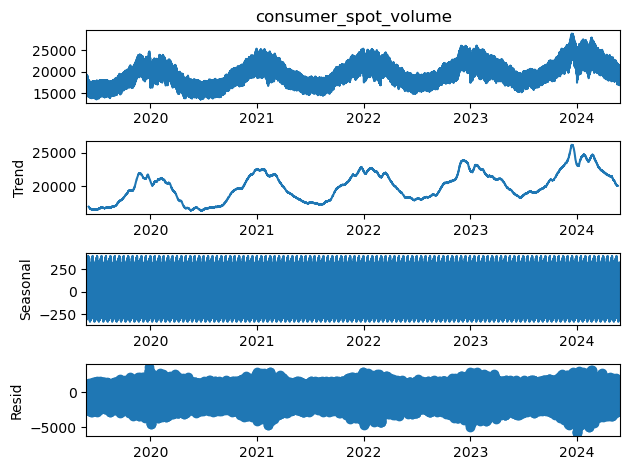

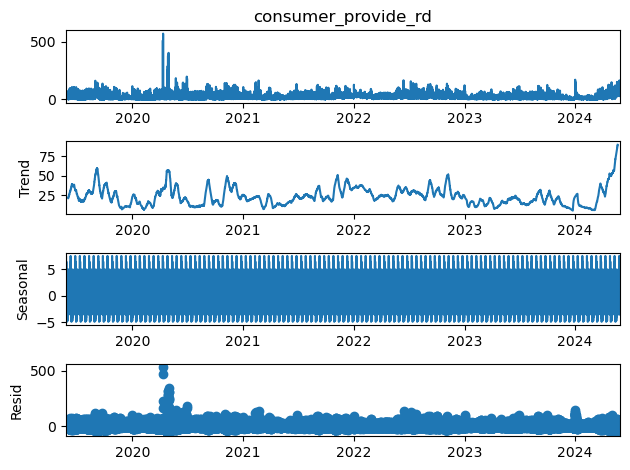

...

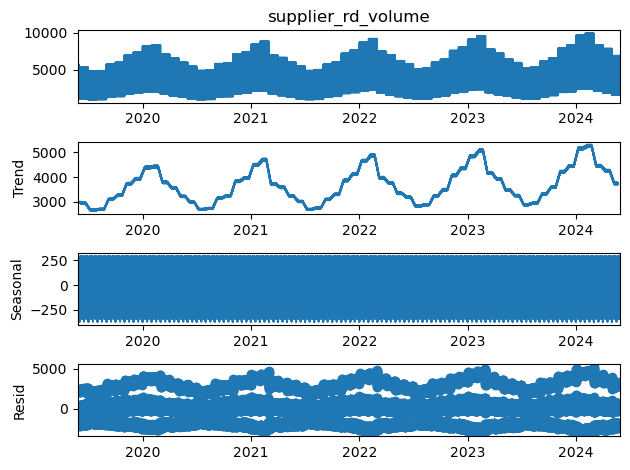

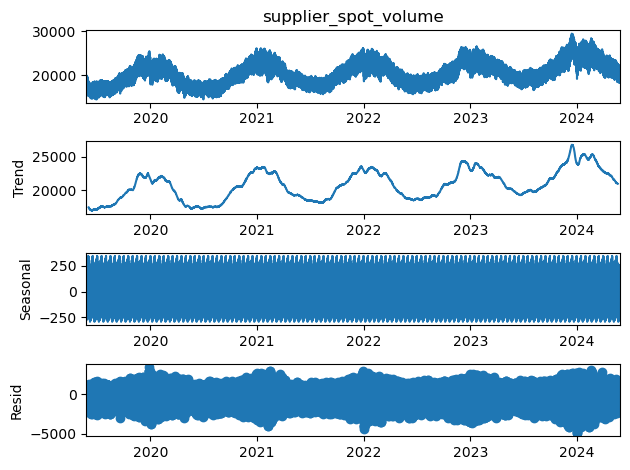

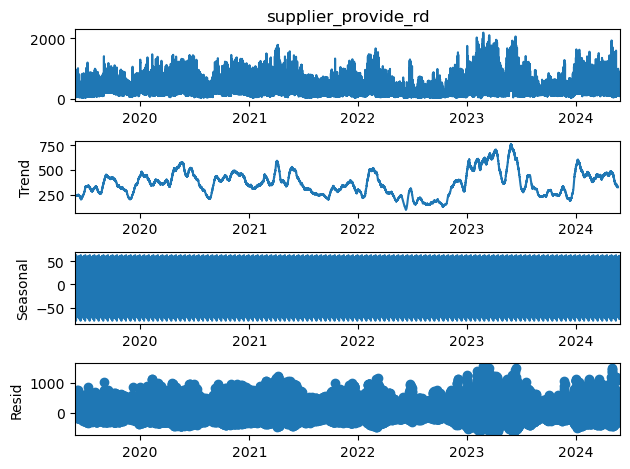

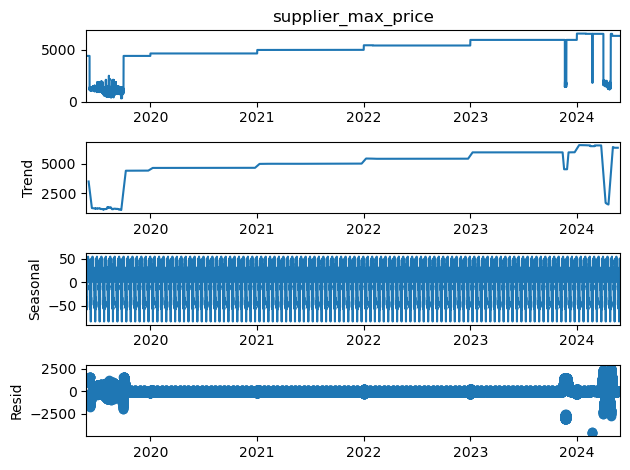

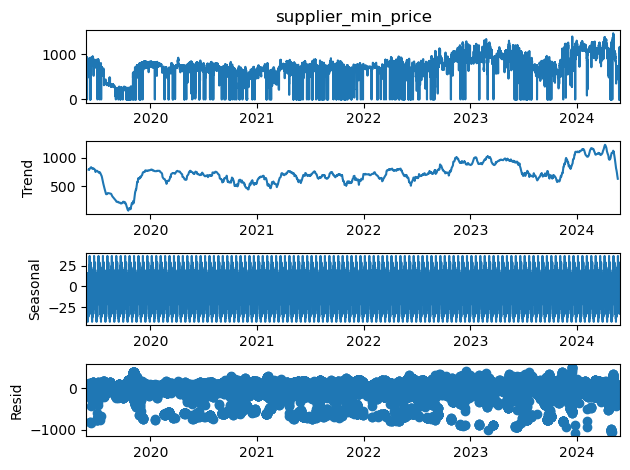

In [231]:
from statsmodels.tsa.seasonal import seasonal_decompose

def make_seasonal_decomposition_plots(df):
    for column in df:
        if df[column].dtypes == 'object':
            continue
        seasonal_decompose(df[column], period = 365, model ='additive').plot()
        # seasonal_decompose(df[column], period = 365, model ='multiplicative').plot()
        plt.show()
        
make_seasonal_decomposition_plots(df.drop(columns = 'price_zone_code'))

# Forecasting

## Let's drop all features except the target ones

In [233]:
df = df[['consumer_price', 'supplier_price']]
df

,consumer_price,supplier_price
date,,
2019-05-27 00:00:00+00:00,977.14,949.90
2019-05-27 01:00:00+00:00,963.62,942.20
2019-05-27 02:00:00+00:00,973.13,952.14
2019-05-27 03:00:00+00:00,968.37,944.93
2019-05-27 04:00:00+00:00,990.70,966.00
...,...,...
2024-05-27 19:00:00+00:00,1296.07,1227.36
2024-05-27 20:00:00+00:00,1097.29,1010.99
2024-05-27 21:00:00+00:00,1002.35,936.12


In [235]:
df_sup = df.copy()
df_sup.drop(columns = 'consumer_price', inplace = True)
df_con = df.copy()
df_con.drop(columns = 'supplier_price', inplace = True)

In [237]:
df_con

,consumer_price
date,
2019-05-27 00:00:00+00:00,977.14
2019-05-27 01:00:00+00:00,963.62
2019-05-27 02:00:00+00:00,973.13
2019-05-27 03:00:00+00:00,968.37
2019-05-27 04:00:00+00:00,990.70
...,...
2024-05-27 19:00:00+00:00,1296.07
2024-05-27 20:00:00+00:00,1097.29
2024-05-27 21:00:00+00:00,1002.35


In [238]:
df_sup

,supplier_price
date,
2019-05-27 00:00:00+00:00,949.90
2019-05-27 01:00:00+00:00,942.20
2019-05-27 02:00:00+00:00,952.14
2019-05-27 03:00:00+00:00,944.93
2019-05-27 04:00:00+00:00,966.00
...,...
2024-05-27 19:00:00+00:00,1227.36
2024-05-27 20:00:00+00:00,1010.99
2024-05-27 21:00:00+00:00,936.12


## Time features engineering

In [240]:
def add_time_features(df):
    df['year'] = df.index.year
    df['quarter'] = df.index.quarter
    df['month'] = df.index.month
    df['week_of_year'] = pd.Index(df.index.isocalendar().week)
    df['week_of_year'] = df['week_of_year'].astype(int)
    df['day'] = df.index.day
    df['day_of_year'] = df.index.dayofyear
    df['day_of_week'] = df.index.dayofweek
    df['hour'] = df.index.hour
    
add_time_features(df_con)
add_time_features(df_sup)

In [241]:
df_con

,consumer_price,year,quarter,month,week_of_year,day,day_of_year,day_of_week,hour
date,,,,,,,,,
2019-05-27 00:00:00+00:00,977.14,2019,2,5,22,27,147,0,0
2019-05-27 01:00:00+00:00,963.62,2019,2,5,22,27,147,0,1
2019-05-27 02:00:00+00:00,973.13,2019,2,5,22,27,147,0,2
2019-05-27 03:00:00+00:00,968.37,2019,2,5,22,27,147,0,3
2019-05-27 04:00:00+00:00,990.70,2019,2,5,22,27,147,0,4
...,...,...,...,...,...,...,...,...,...
2024-05-27 19:00:00+00:00,1296.07,2024,2,5,22,27,148,0,19
2024-05-27 20:00:00+00:00,1097.29,2024,2,5,22,27,148,0,20
2024-05-27 21:00:00+00:00,1002.35,2024,2,5,22,27,148,0,21


In [242]:
df_sup

,supplier_price,year,quarter,month,week_of_year,day,day_of_year,day_of_week,hour
date,,,,,,,,,
2019-05-27 00:00:00+00:00,949.90,2019,2,5,22,27,147,0,0
2019-05-27 01:00:00+00:00,942.20,2019,2,5,22,27,147,0,1
2019-05-27 02:00:00+00:00,952.14,2019,2,5,22,27,147,0,2
2019-05-27 03:00:00+00:00,944.93,2019,2,5,22,27,147,0,3
2019-05-27 04:00:00+00:00,966.00,2019,2,5,22,27,147,0,4
...,...,...,...,...,...,...,...,...,...
2024-05-27 19:00:00+00:00,1227.36,2024,2,5,22,27,148,0,19
2024-05-27 20:00:00+00:00,1010.99,2024,2,5,22,27,148,0,20
2024-05-27 21:00:00+00:00,936.12,2024,2,5,22,27,148,0,21


## Showcase of time features

### Consumer price

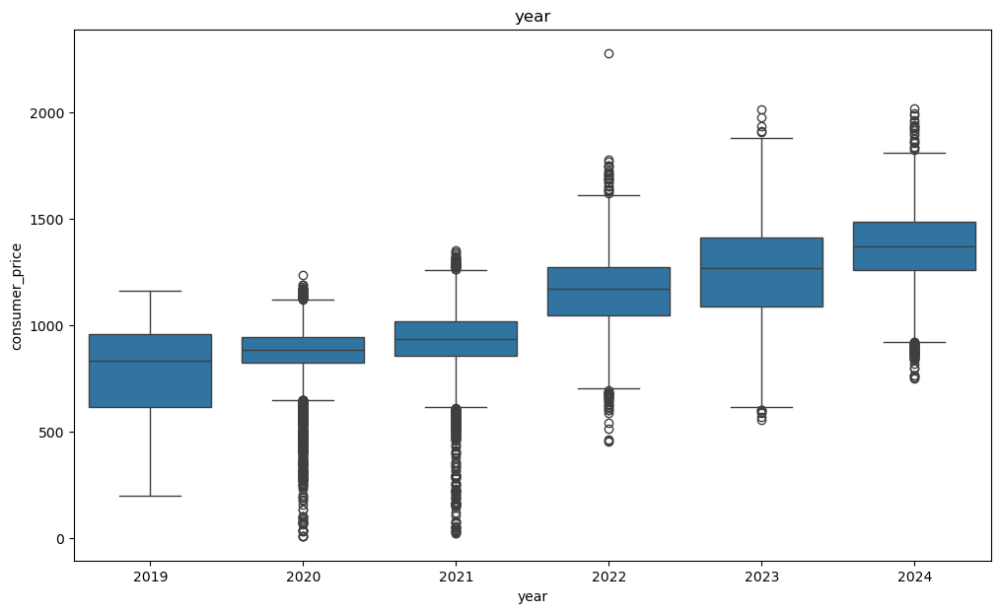

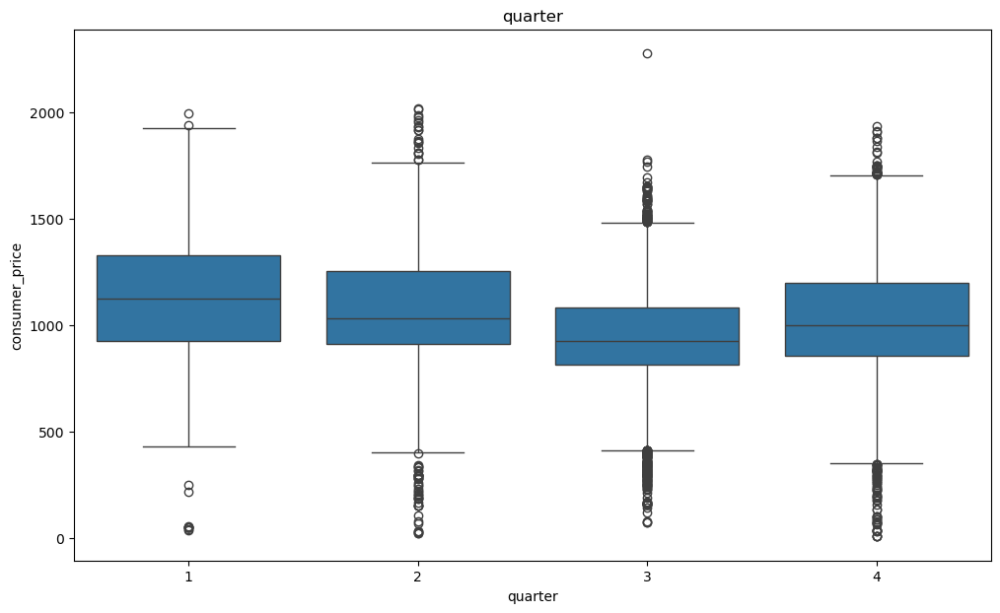

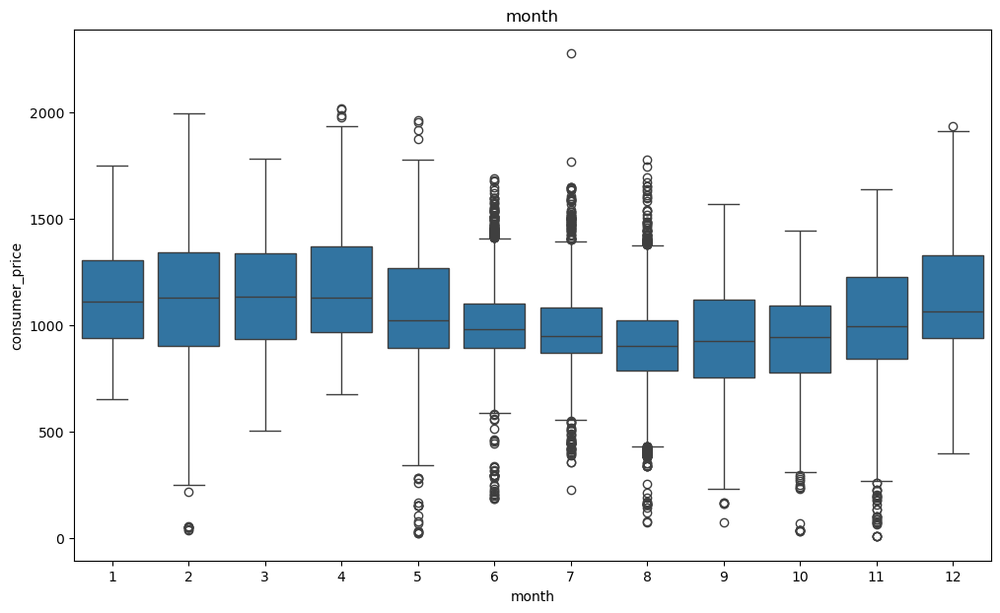

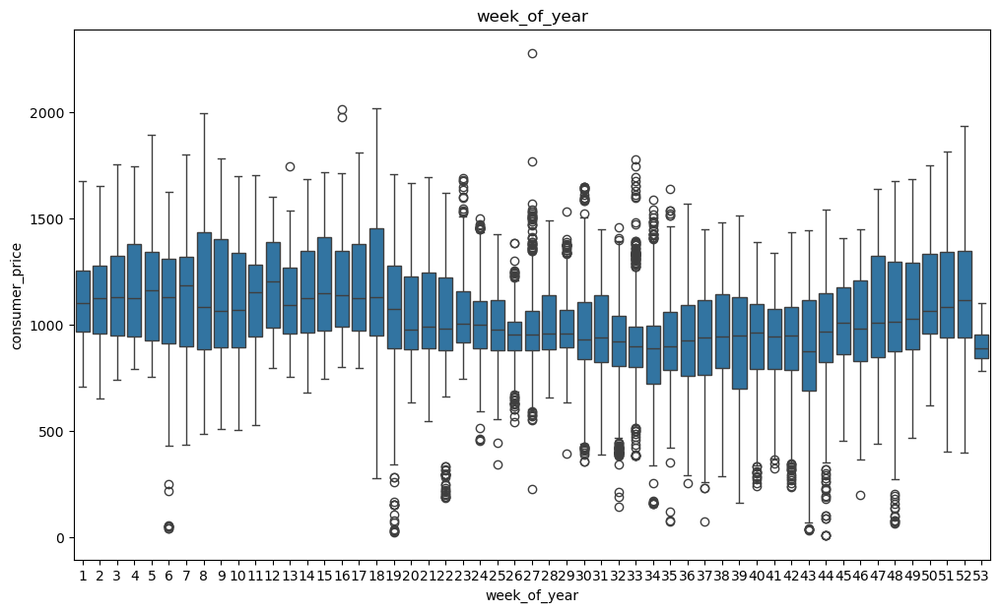

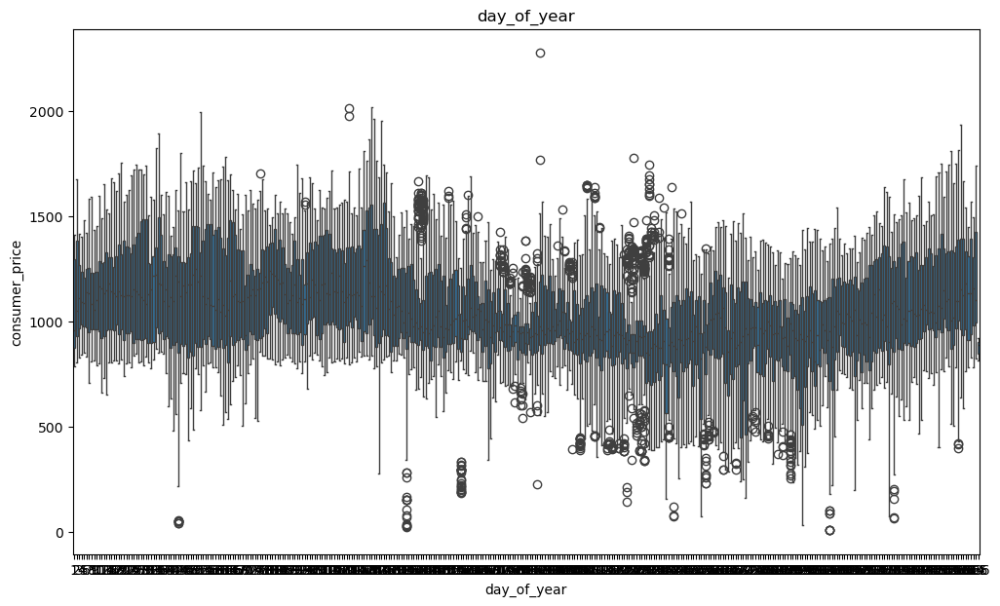

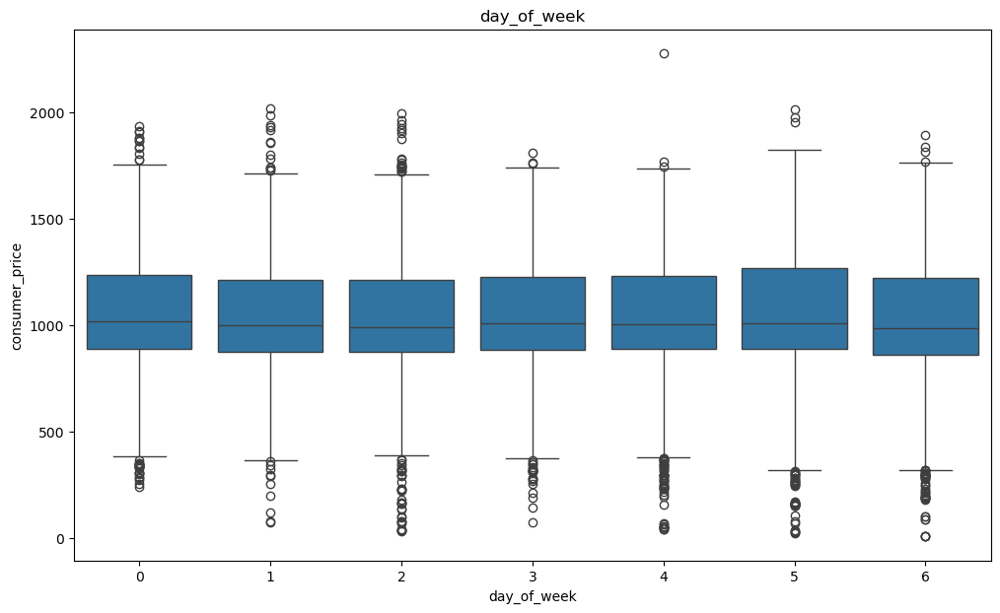

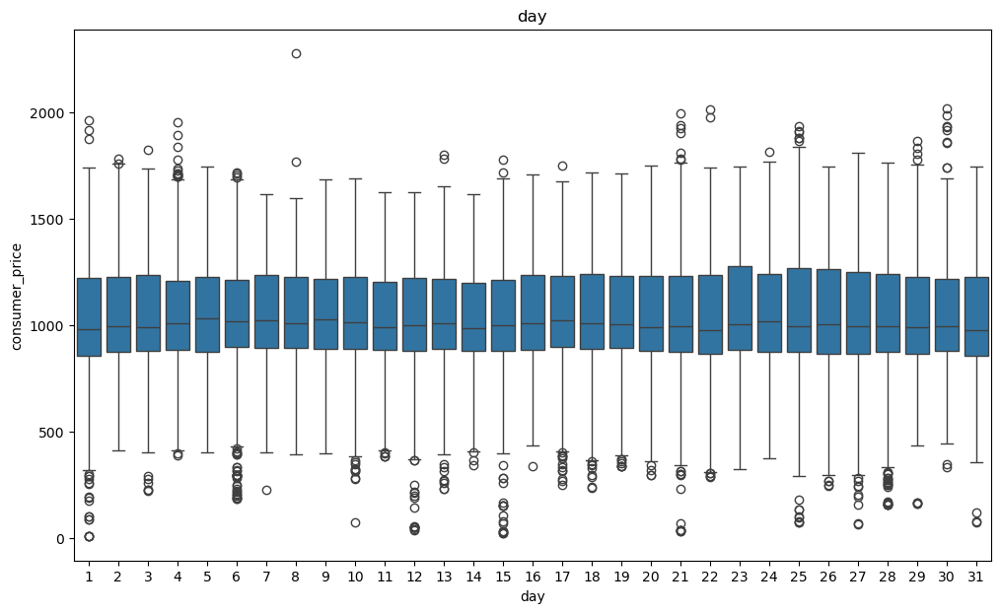

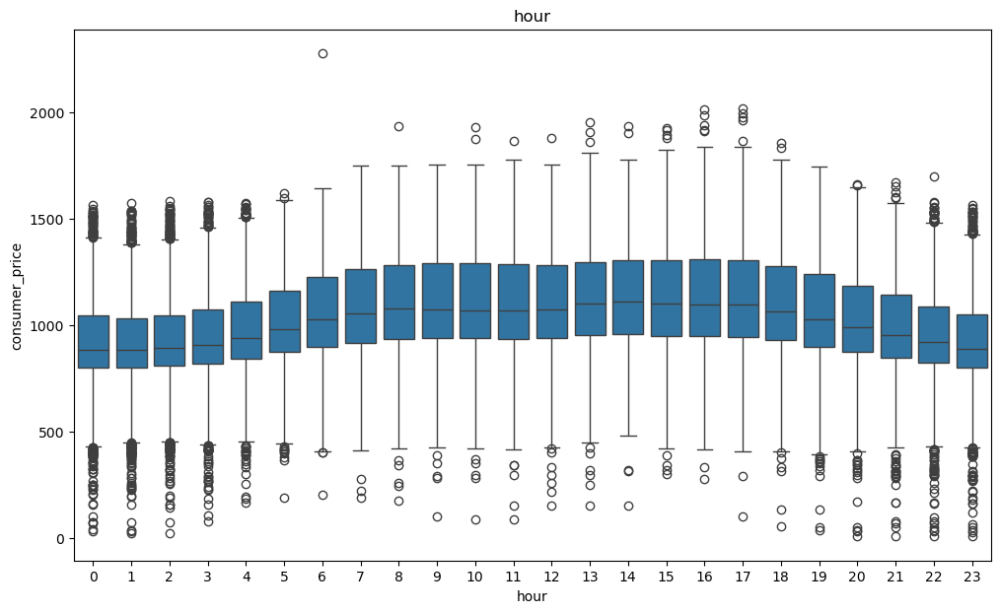

In [243]:
time_features = ['year', 'quarter', 'month', 'week_of_year', 'day_of_year', 'day_of_week', 'day', 'hour']
for feature in time_features:
    plt.figure(figsize = (12, 7))
    plt.title(feature)
    sb.boxplot(x = feature, y = 'consumer_price', data = df_con)
    plt.show()

### Supplier price

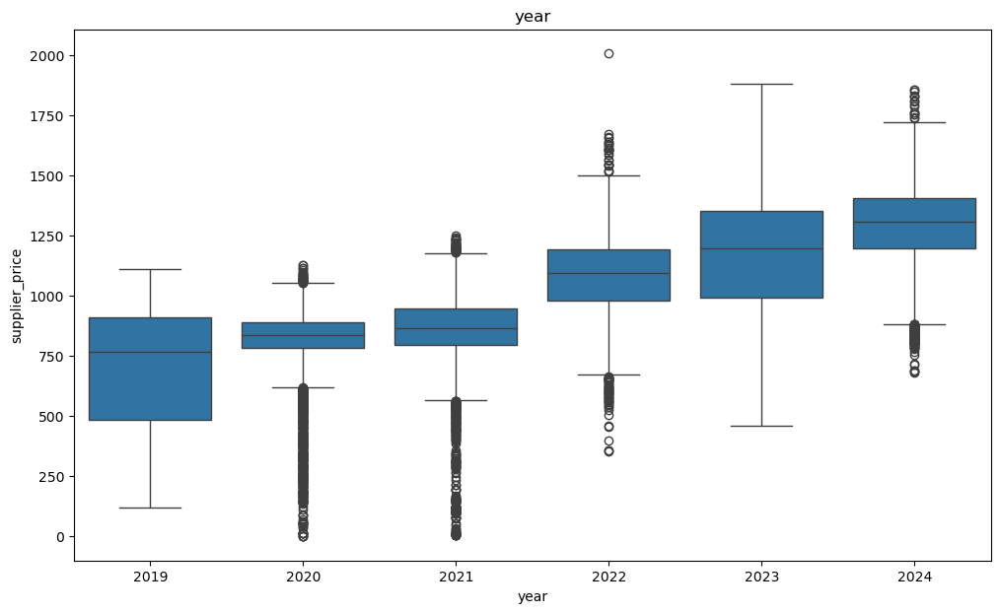

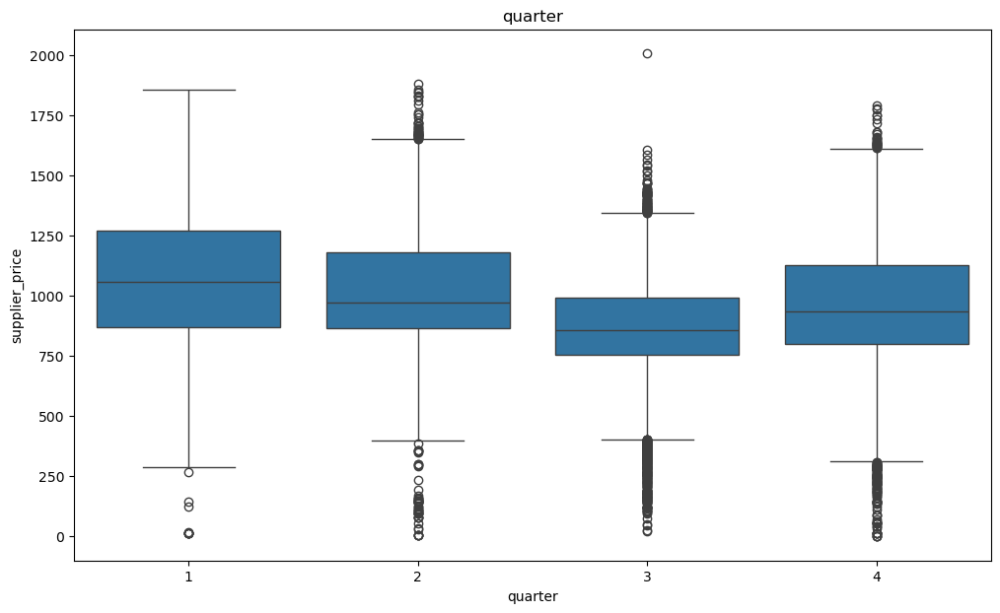

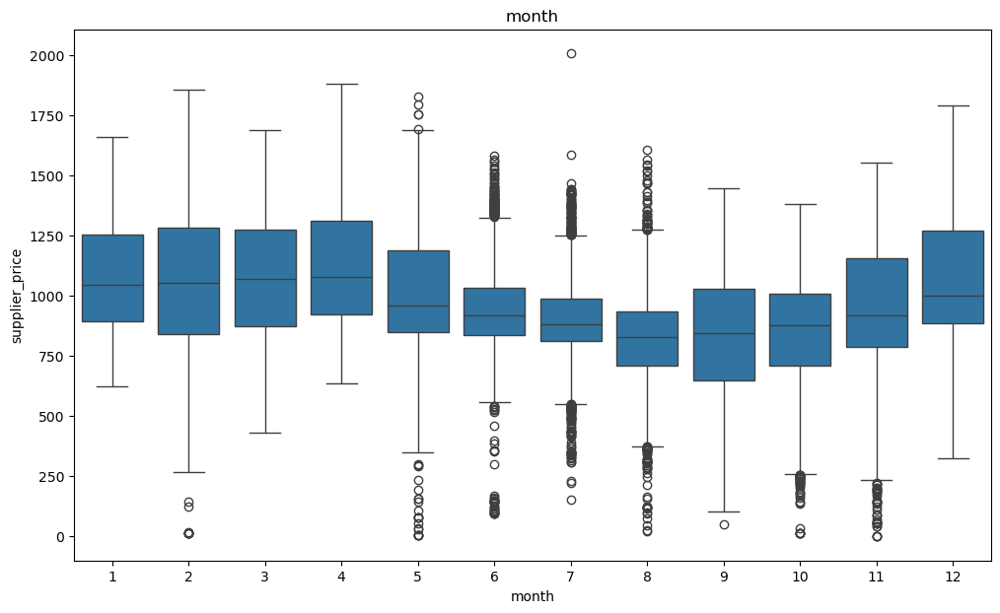

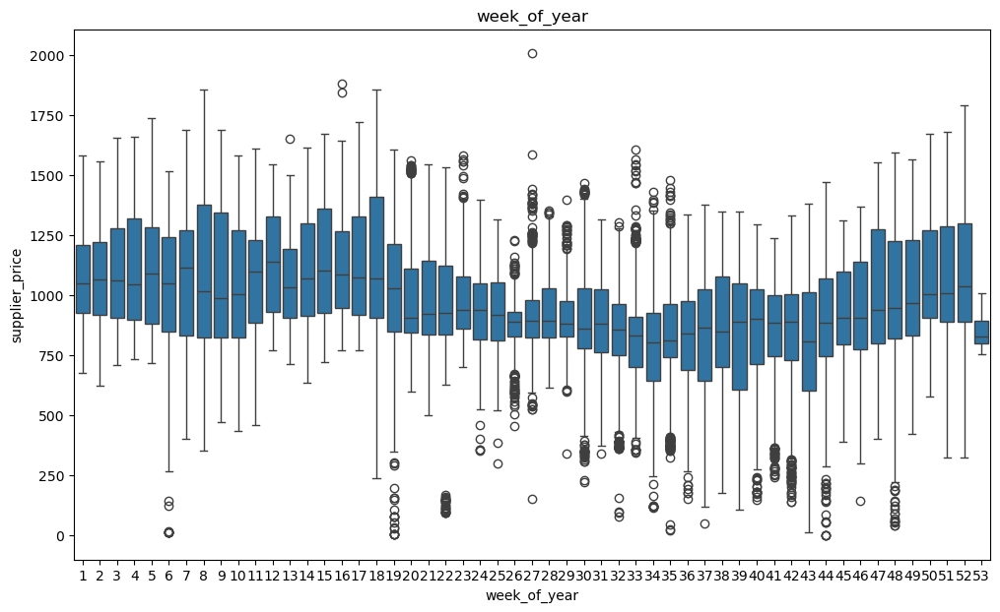

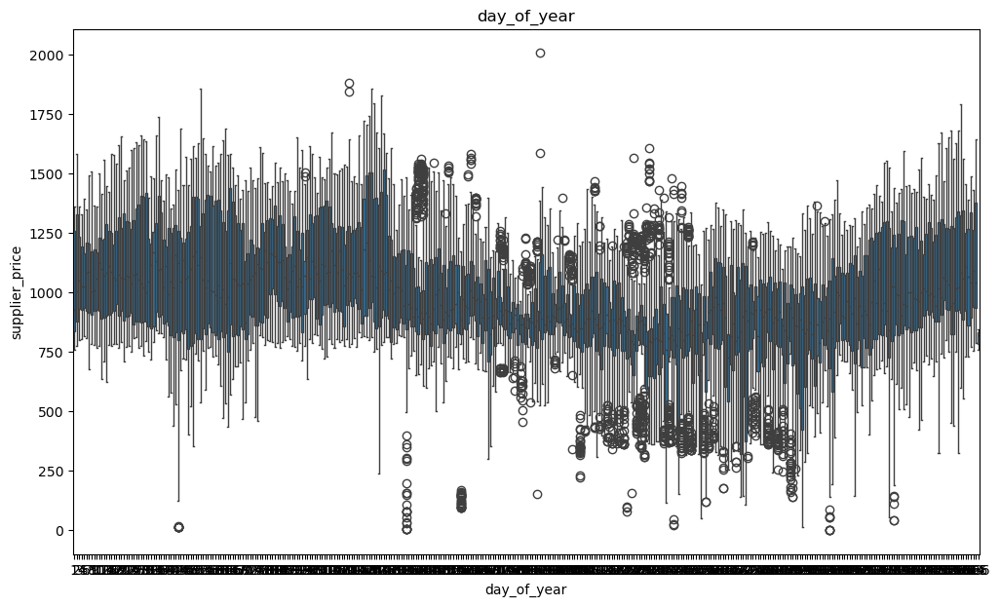

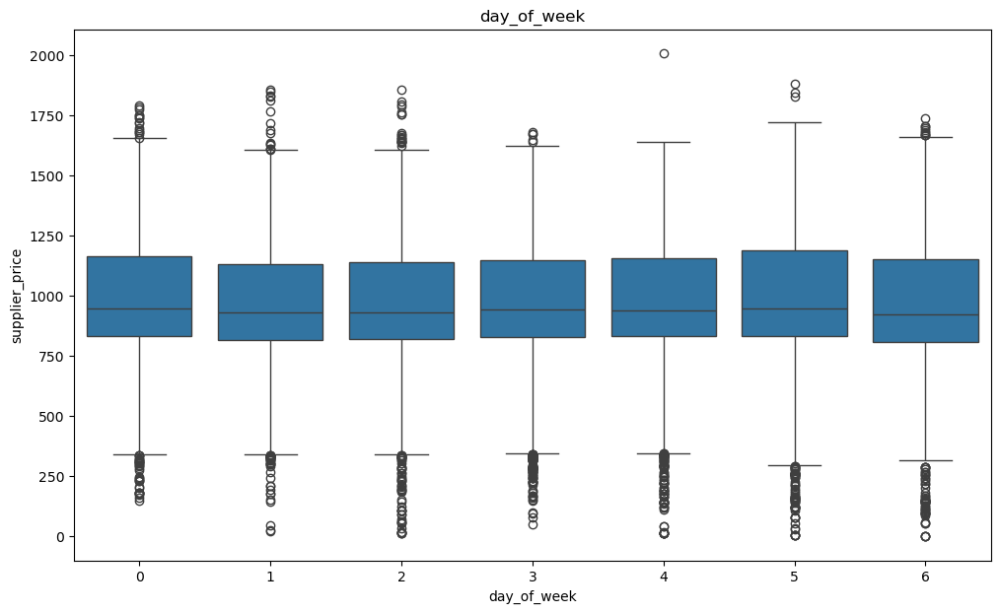

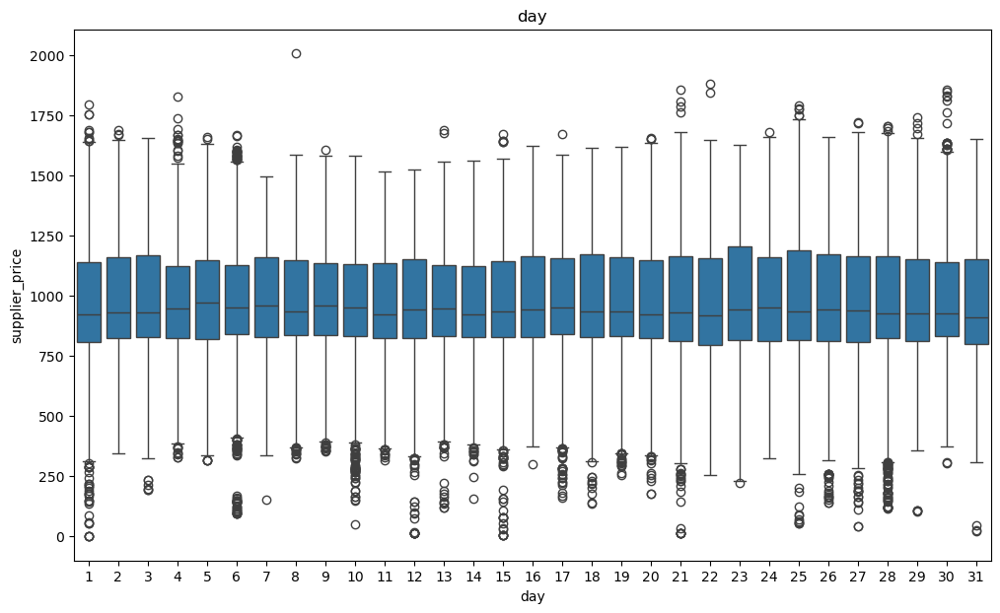

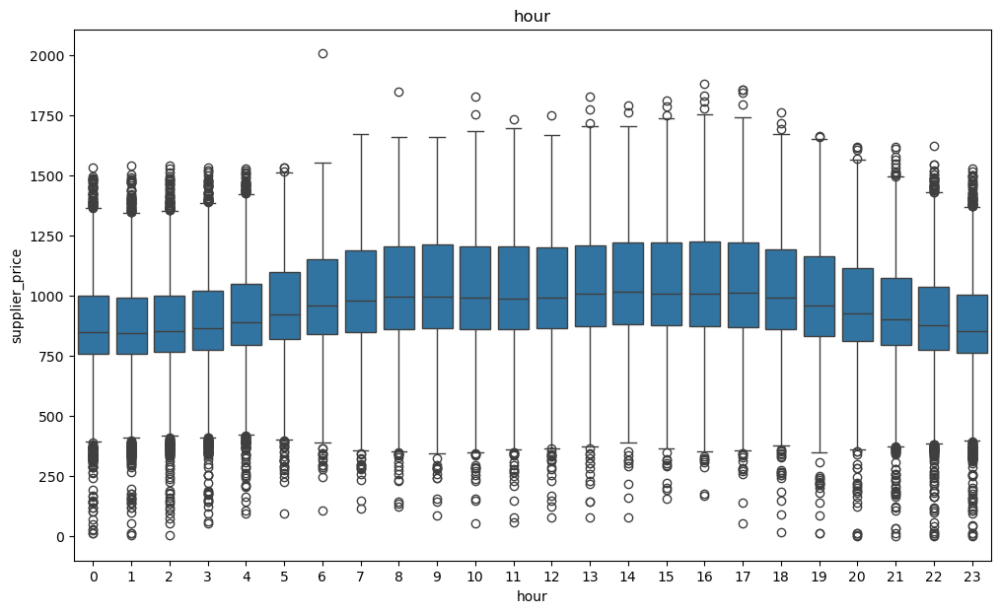

In [244]:
for feature in time_features:
    plt.figure(figsize = (12, 7))
    plt.title(feature)
    sb.boxplot(x = feature, y = 'supplier_price', data = df_sup)
    plt.show()

## Saving temporal datasets

In [245]:
df_sup.to_csv('electricity_price_hourly_supplier.csv', index = True)
df_con.to_csv('electricity_price_hourly_consumer.csv', index = True)

## CV for time series data

### Prepared datasets lookup

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sb
import numpy as np

df_sup = pd.read_csv('electricity_price_hourly_supplier.csv', index_col = 'date')
df_con = pd.read_csv('electricity_price_hourly_consumer.csv', index_col = 'date')

In [2]:
df_sup

,supplier_price,year,quarter,month,week_of_year,day,day_of_year,day_of_week,hour
date,,,,,,,,,
2019-05-27 00:00:00+00:00,949.90,2019,2,5,22,27,147,0,0
2019-05-27 01:00:00+00:00,942.20,2019,2,5,22,27,147,0,1
2019-05-27 02:00:00+00:00,952.14,2019,2,5,22,27,147,0,2
2019-05-27 03:00:00+00:00,944.93,2019,2,5,22,27,147,0,3
2019-05-27 04:00:00+00:00,966.00,2019,2,5,22,27,147,0,4
...,...,...,...,...,...,...,...,...,...
2024-05-27 19:00:00+00:00,1227.36,2024,2,5,22,27,148,0,19
2024-05-27 20:00:00+00:00,1010.99,2024,2,5,22,27,148,0,20
2024-05-27 21:00:00+00:00,936.12,2024,2,5,22,27,148,0,21


#### Price plot

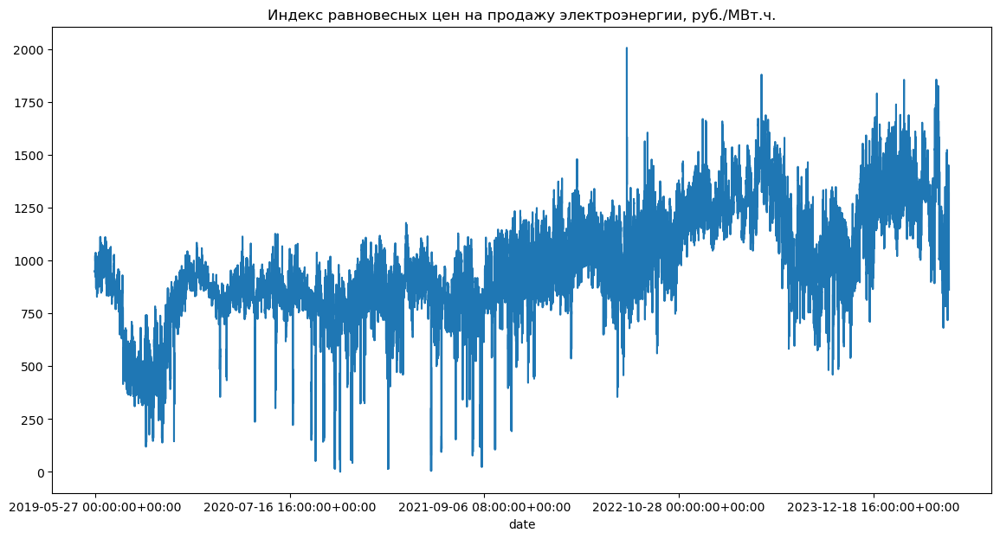

In [17]:
plt.figure(figsize = (14, 7))
df_sup['supplier_price'].plot()
plt.title('Индекс равновесных цен на продажу электроэнергии, руб./МВт.ч.')
plt.show()

#### Price distribution

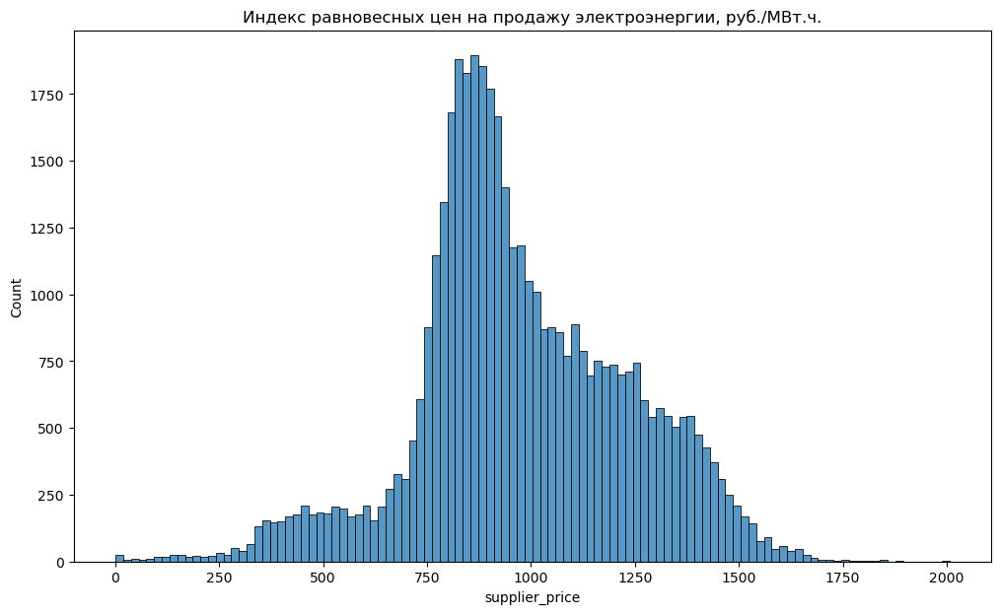

In [7]:
plt.figure(figsize = (12, 7))
plt.title('Индекс равновесных цен на продажу электроэнергии, руб./МВт.ч.')
sb.histplot(df_sup['supplier_price'])
plt.show()

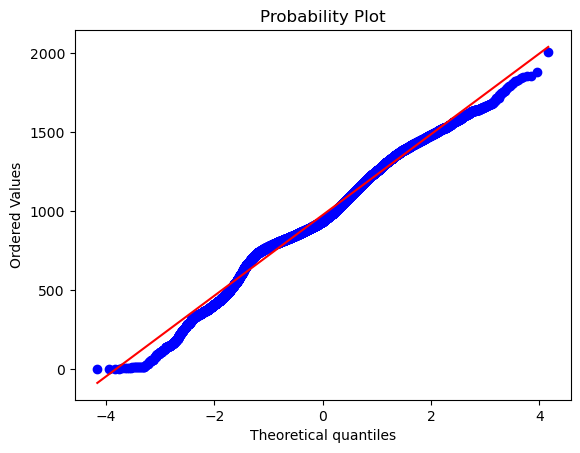

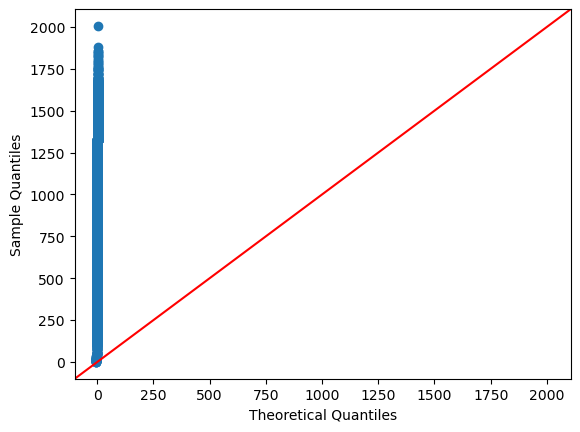

D'Agostino & Pearson:  NOT Normal
132.41352354071472

Jarque-Bera:           NOT Normal
169.63672190328668

Kolmogorov-Smirnov:    NOT Normal
0.061964345409667804

Lilliefors:            NOT Normal
0.061964345409667804

Shapiro-Wilk:          NOT Normal
0.9839980006217957

Anderson–Darling:      NOT Normal
299.56824790379324



In [7]:
show_probability_plot(df_sup['supplier_price'])
show_quantile_quantile_plot(df_sup['supplier_price'])
run_tests_for_normality(df_sup['supplier_price'])

#### Price outliers check

In [10]:
from scipy import stats
import numpy as np

def remove_outliers(df, column):
    q_low = df[column].quantile(0.01)
    q_high = df[column].quantile(0.99)
    return df[(df[column] < q_high) & (df[column] > q_low)]

def remove_outliers_z_score(df, column):
    result = df.copy()
    result['z_score'] = stats.zscore(df[column])
    result = result.loc[result['z_score'].abs() <= 3]
    return result

In [12]:
df1 = remove_outliers(df_sup, 'supplier_price')
df2 = remove_outliers_z_score(df_sup, 'supplier_price')

print(f'Outliers count (1st and 99th quantiles): {len(df_sup) - len(df1)} ({(len(df_sup) - len(df1)) * 100.0 / len(df_sup)}%)')
print(f'Outliers count (Z-score): {len(df_sup) - len(df2)} ({(len(df_sup) - len(df2)) * 100.0 / len(df_sup)}%)')

Outliers count (1st and 99th quantiles): 878 (2.00127644055434%)
Outliers count (Z-score): 190 (0.43307804522246535%)


In [23]:
df_sup[(df_sup['supplier_price'] < 10)]

,supplier_price,year,quarter,month,week_of_year,day,day_of_year,day_of_week,hour
date,,,,,,,,,
2020-11-01 20:00:00+00:00,0.45,2020,4,11,44,1,306,6,20
2020-11-01 21:00:00+00:00,0.99,2020,4,11,44,1,306,6,21
2020-11-01 22:00:00+00:00,0.46,2020,4,11,44,1,306,6,22
2020-11-01 23:00:00+00:00,0.46,2020,4,11,44,1,306,6,23
2021-05-15 01:00:00+00:00,6.00,2021,2,5,19,15,135,5,1
2021-05-15 02:00:00+00:00,4.51,2021,2,5,19,15,135,5,2
2021-05-15 20:00:00+00:00,4.43,2021,2,5,19,15,135,5,20
2021-05-15 22:00:00+00:00,4.56,2021,2,5,19,15,135,5,22
2021-05-15 23:00:00+00:00,6.90,2021,2,5,19,15,135,5,23


#### What is the difference between consumer and supplier prices?

In [10]:
sup_prices = df_sup['supplier_price']
con_prices = df_con['consumer_price']
result = con_prices - sup_prices
result

date
2019-05-27 00:00:00+00:00    27.24
2019-05-27 01:00:00+00:00    21.42
2019-05-27 02:00:00+00:00    20.99
2019-05-27 03:00:00+00:00    23.44
2019-05-27 04:00:00+00:00    24.70
                             ...  
2024-05-27 19:00:00+00:00    68.71
2024-05-27 20:00:00+00:00    86.30
2024-05-27 21:00:00+00:00    66.23
2024-05-27 22:00:00+00:00    56.47
2024-05-27 23:00:00+00:00    49.31
Length: 43872, dtype: float64

In [11]:
result.describe()

count    43872.000000
mean        69.016620
std         34.340587
min        -10.920000
25%         44.380000
50%         60.080000
75%         85.030000
max        316.420000
dtype: float64

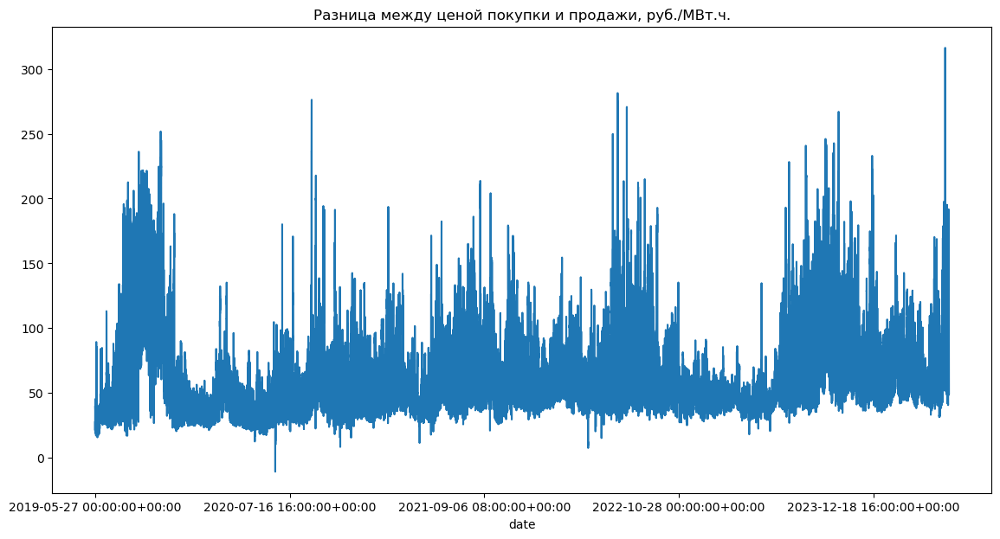

In [29]:
plt.figure(figsize = (14, 7))
result.plot()
plt.title('Разница между ценой покупки и продажи, руб./МВт.ч.')
plt.show()

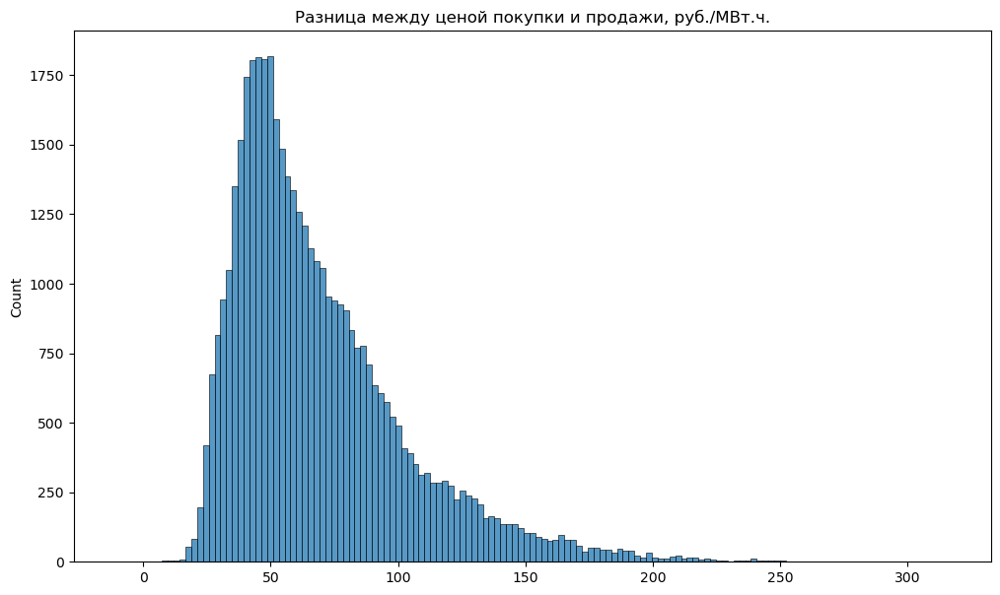

In [30]:
plt.figure(figsize = (12, 7))
plt.title('Разница между ценой покупки и продажи, руб./МВт.ч.')
sb.histplot(result)
plt.show()

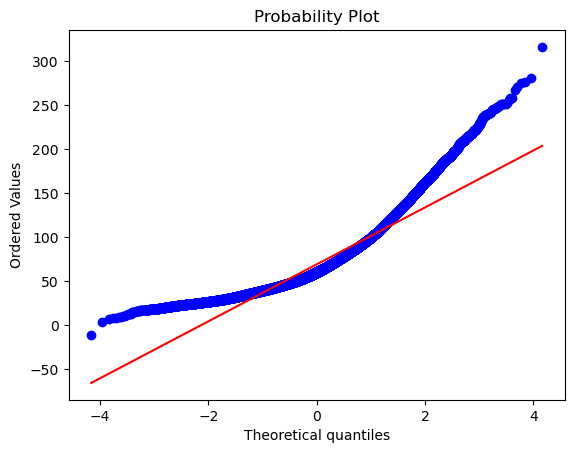

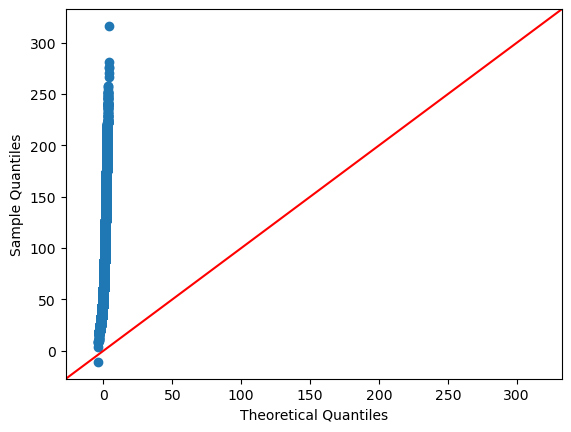

D'Agostino & Pearson:  NOT Normal
11270.28306369284

Jarque-Bera:           NOT Normal
27207.632642061715

Kolmogorov-Smirnov:    NOT Normal
0.10703842360700944

Lilliefors:            NOT Normal
0.10703842360700944

Shapiro-Wilk:          NOT Normal
0.8900027275085449

Anderson–Darling:      NOT Normal
1240.7804617619186



C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\scipy\stats\_morestats.py:1816: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


In [12]:
show_probability_plot(result)
show_quantile_quantile_plot(result)
run_tests_for_normality(result)

### Prediction of supplier price values

#### Train & test split

In [28]:
df_sup

,supplier_price,year,quarter,month,week_of_year,day,day_of_year,day_of_week,hour
date,,,,,,,,,
2019-05-27 00:00:00+00:00,949.90,2019,2,5,22,27,147,0,0
2019-05-27 01:00:00+00:00,942.20,2019,2,5,22,27,147,0,1
2019-05-27 02:00:00+00:00,952.14,2019,2,5,22,27,147,0,2
2019-05-27 03:00:00+00:00,944.93,2019,2,5,22,27,147,0,3
2019-05-27 04:00:00+00:00,966.00,2019,2,5,22,27,147,0,4
...,...,...,...,...,...,...,...,...,...
2024-05-27 19:00:00+00:00,1227.36,2024,2,5,22,27,148,0,19
2024-05-27 20:00:00+00:00,1010.99,2024,2,5,22,27,148,0,20
2024-05-27 21:00:00+00:00,936.12,2024,2,5,22,27,148,0,21


In [14]:
rows_count = len(df_sup)
proportion = 0.80
train_count = int(rows_count * proportion)
test_count = rows_count - train_count
df_train = df_sup[:train_count].copy()
df_test = df_sup[train_count:train_count + test_count].copy()
print(f'Train: {len(df_train)}')
print(f'Test: {len(df_test)}')

Train: 35097
Test: 8775


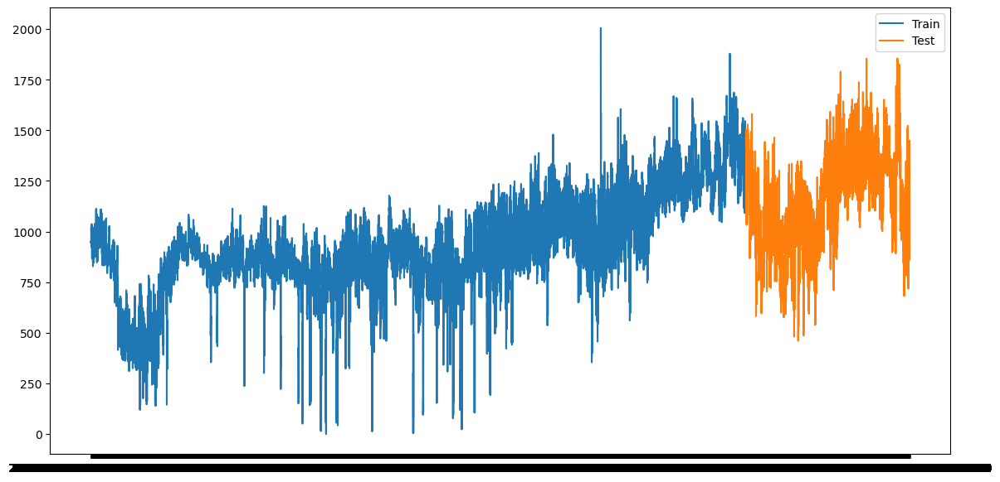

In [37]:
plt.figure(figsize = (14, 7))
plt.plot(df_train['supplier_price'])
plt.plot(df_test['supplier_price'])
plt.legend(['Train', 'Test'])
plt.show()

#### Prediction

In [2]:
from sklearn.model_selection import TimeSeriesSplit
import numpy as np
from sklearn.metrics import r2_score as r2, mean_squared_error as mse
from sklearn.metrics import mean_absolute_error as mae, mean_absolute_percentage_error as mape

def rmse(y_true, y_pred):
    return np.sqrt(mse(y_test, y_pred))

def smape(y_true, y_pred):
    absolute_diff = np.abs(y_true - y_pred)
    sum_absolute = np.abs(y_true) + np.abs(y_pred)
    mask = sum_absolute != 0
    score = np.mean(200 * (absolute_diff[mask] / sum_absolute[mask]))
    return score

In [3]:
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sb

def scale_train_and_test(train, test, columns_to_scale):
    if train.shape[-1] != test.shape[-1]:
        raise Exception('Train and test dataframes are incompatible')
    scaler = StandardScaler()
    train_scaled_columns = scaler.fit_transform(train[columns_to_scale])
    test_scaled_columns = scaler.transform(test[columns_to_scale])
    columns = list(train.columns)
    for column in columns_to_scale:
        columns.remove(column)
    train_scaled = pd.DataFrame(
        train.drop(columns = columns_to_scale),
        index = train.index,
        columns = columns)
    for i, column in enumerate(columns_to_scale):
        train_scaled[column] = train_scaled_columns.T[i]
    test_scaled = pd.DataFrame(
        test.drop(columns = columns_to_scale),
        index = test.index,
        columns = columns)
    for i, column in enumerate(columns_to_scale):
        test_scaled[column] = test_scaled_columns.T[i]
    return train_scaled, test_scaled, scaler

def show_regression_chart(y, prediction, sort = True):
    t = pd.DataFrame({'prediction': prediction, 'y': y})
    if sort:
        t.sort_values(by = ['y'], inplace = True)
    plt.figure(figsize = (10, 6))
    plt.plot(t['y'].tolist(), label = 'expected')
    plt.plot(t['prediction'].tolist(), label = 'prediction')
    plt.ylabel('output')
    plt.legend()
    plt.xticks(rotation = 45)
    plt.show()
    
def show_error_histogram(y_true, y_pred):
    plt.title('Error histogram')
    sb.histplot(y_true - y_pred)
    plt.show()

In [4]:
from scipy import stats as st
import statsmodels.api as sm

def run_tests_for_normality(data, alpha = 0.05):
    statistic, p_value = st.normaltest(data)
    if p_value > alpha:
        result = 'Normal'
    else:
        result = 'NOT Normal'
    print(f"D'Agostino & Pearson: {result:>11s}")
    print(statistic)
    print()
    
    statistic, pvalue = st.jarque_bera(data)
    if pvalue > alpha:
        result = 'Normal'
    else:
        result = 'NOT Normal'
    print(f'Jarque-Bera: {result:>20s}')
    print(statistic)
    print()

    ksstat, pvalue = sm.stats.diagnostic.kstest_normal(data)
    if pvalue > alpha:
        result = 'Normal'
    else:
        result = 'NOT Normal'
    print(f'Kolmogorov-Smirnov: {result:>13s}')
    print(ksstat)
    print()

    ksstat, pvalue = sm.stats.diagnostic.lilliefors(data)
    if pvalue > alpha:
        result = 'Normal'
    else:
        result = 'NOT Normal'
    print(f'Lilliefors: {result:>21s}')
    print(ksstat)
    print()

    statistic, pvalue = st.shapiro(data)
    if pvalue > alpha:
        result = 'Normal'
    else:
        result = 'NOT Normal'
    print(f'Shapiro-Wilk: {result:>19s}')
    print(statistic)
    print()

    result = st.anderson(data)
    idx = np.where(result.significance_level == alpha * 100)
    if result.statistic < result.critical_values[idx]:
        verdict = 'Normal'
    else:
        verdict = 'NOT Normal'
    print(f'Anderson–Darling: {verdict:>15s}')
    print(result.statistic)
    print()
    
def show_probability_plot(data):
    st.probplot(data, dist = 'norm', plot = plt)
    plt.show()
    
def show_quantile_quantile_plot(data):
    sm.qqplot(data, line = '45')
    plt.show()

In [5]:
from sklearn.dummy import DummyRegressor
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import BayesianRidge
from sklearn.linear_model import PassiveAggressiveRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.ensemble import BaggingRegressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.ensemble import HistGradientBoostingRegressor
from xgboost import XGBRegressor
from catboost import CatBoostRegressor

In [12]:
models = []
models.append(('Dummy', DummyRegressor(strategy = 'constant')))
models.append(('LR', LinearRegression(fit_intercept = False)))
models.append(('Bayes', BayesianRidge()))
models.append(('PAR', PassiveAggressiveRegressor(max_iter = 100, random_state = 42, tol = 1e-3)))
models.append(('KNN', KNeighborsRegressor(n_neighbors = 20, n_jobs = -1)))
models.append(('CART', DecisionTreeRegressor(random_state = 42)))
models.append(('RF', RandomForestRegressor(n_jobs = -1, random_state = 42)))
models.append(('XT', ExtraTreesRegressor(n_jobs = -1, random_state = 42)))
models.append(('BAG', BaggingRegressor(n_jobs = -1, random_state = 42)))
models.append(('ADA', AdaBoostRegressor(random_state = 42)))
models.append(('HGBoost', HistGradientBoostingRegressor(random_state = 42)))
models.append(('XGBoost', XGBRegressor(tree_method = 'gpu_hist', verbosity = 0, random_state = 42)))
models.append(('CatBoost', CatBoostRegressor(
    random_seed = 42,
    loss_function = 'RMSE',
    eval_metric = 'MAE',
    od_type = 'Iter',
    od_wait = 20,
    task_type = 'GPU',
    logging_level = 'Silent')))

results = {
    'r2' : [],
    'mse' : [],
    'rmse' : [],
    'mae' : [],
    'mape' : [],
    'smape' : []
}

----------------
Dummy model...
Fold #1...
Fold #2...
Fold #3...
Fold #4...
Fold #5...
Fold #6...
Fold #7...
Fold #8...
Fold #9...
Fold #10...


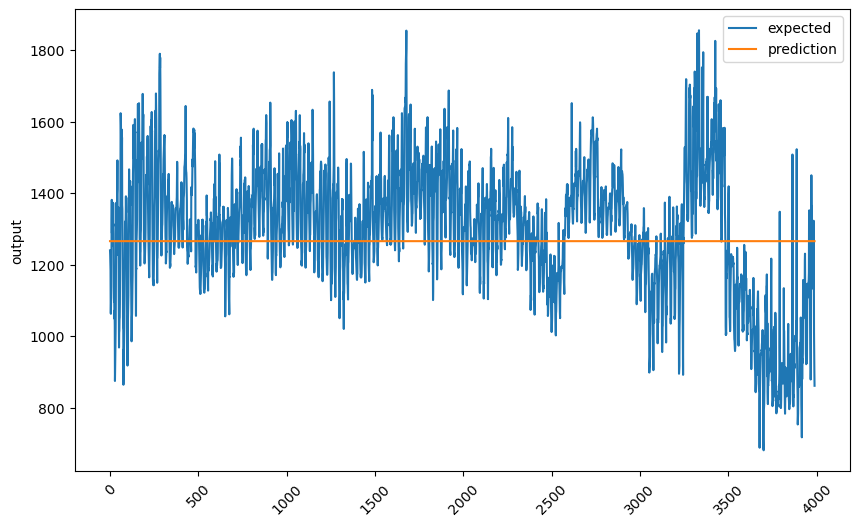

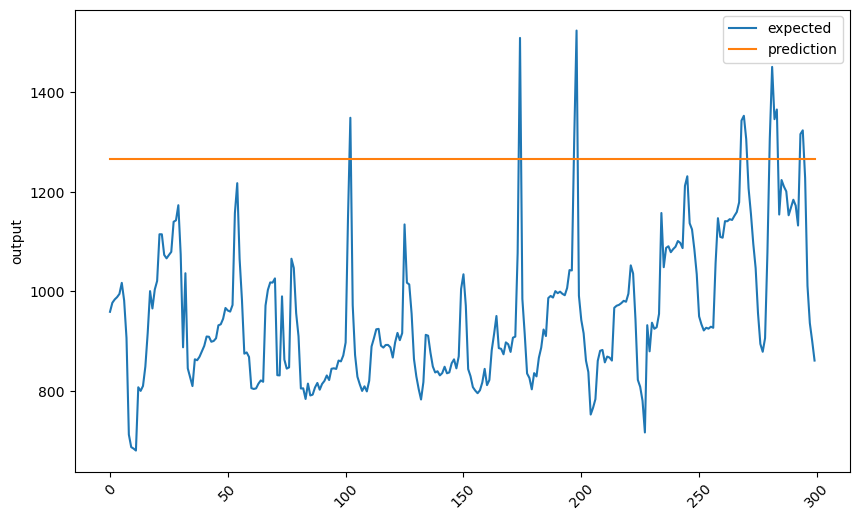

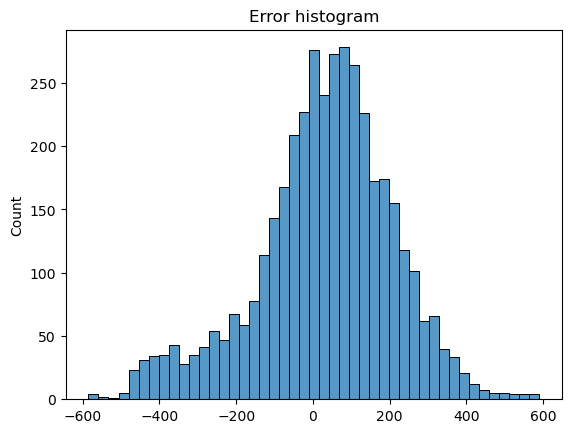

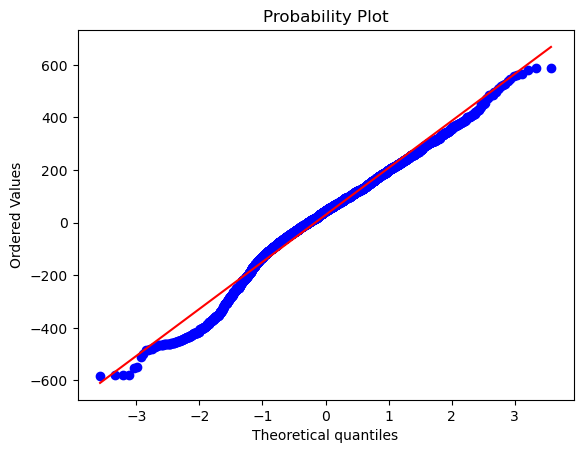

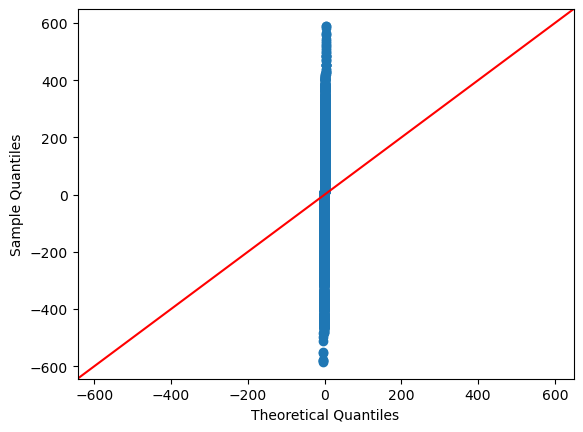

----------
Statistical test for normality of residuals:
----------

D'Agostino & Pearson:  NOT Normal
154.10422573371358

Jarque-Bera:           NOT Normal
178.8932490894559

Kolmogorov-Smirnov:    NOT Normal
0.05401860602165742

Lilliefors:            NOT Normal
0.05401860602165742

Shapiro-Wilk:          NOT Normal
0.9814963340759277

Anderson–Darling:      NOT Normal
22.4632843862546

Done!

----------------
LR model...
Fold #1...
Fold #2...
Fold #3...
Fold #4...
Fold #5...
Fold #6...
Fold #7...
Fold #8...
Fold #9...
Fold #10...


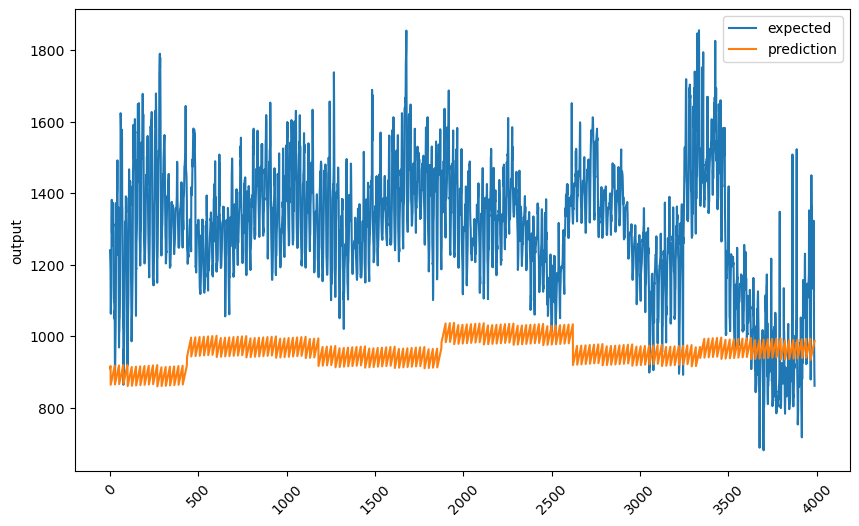

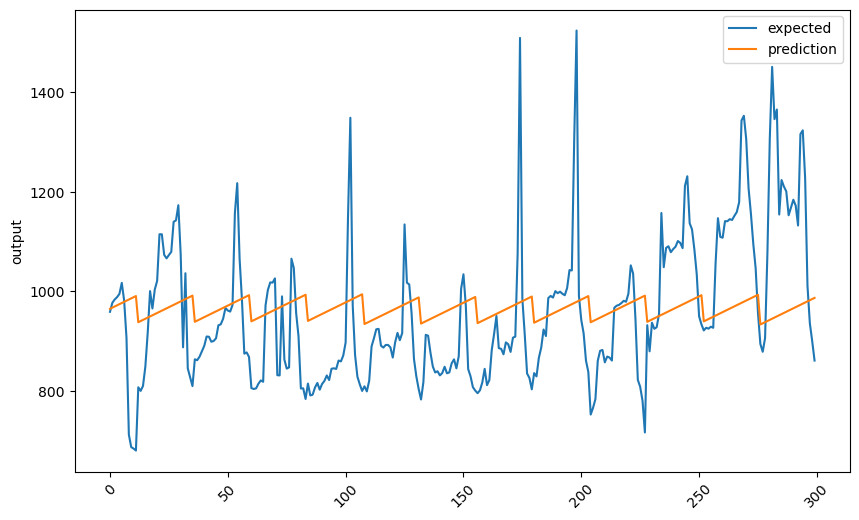

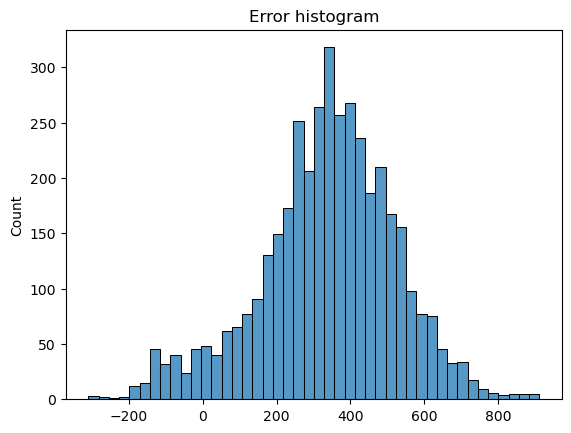

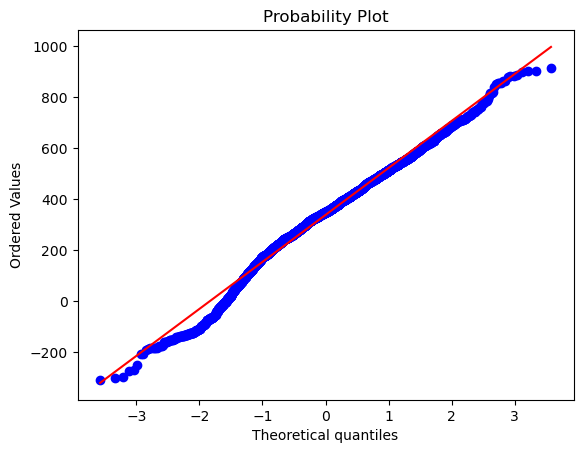

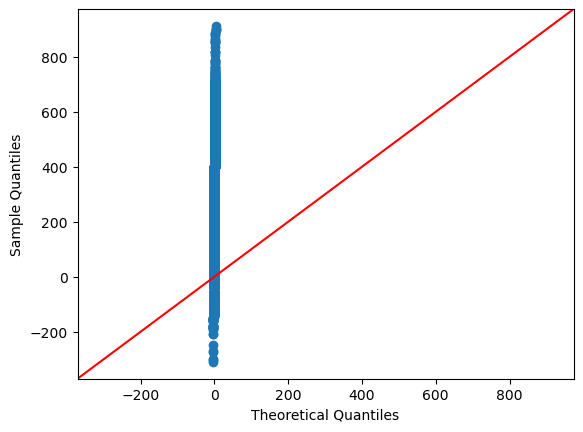

----------
Statistical test for normality of residuals:
----------

D'Agostino & Pearson:  NOT Normal
107.80228729961142

Jarque-Bera:           NOT Normal
120.7878446078438

Kolmogorov-Smirnov:    NOT Normal
0.04707958796074457

Lilliefors:            NOT Normal
0.04707958796074457

Shapiro-Wilk:          NOT Normal
0.9869328141212463

Anderson–Darling:      NOT Normal
15.764645654291144

Done!

----------------
Bayes model...
Fold #1...
Fold #2...
Fold #3...
Fold #4...
Fold #5...
Fold #6...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expec

Fold #7...
Fold #8...
Fold #9...
Fold #10...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expec

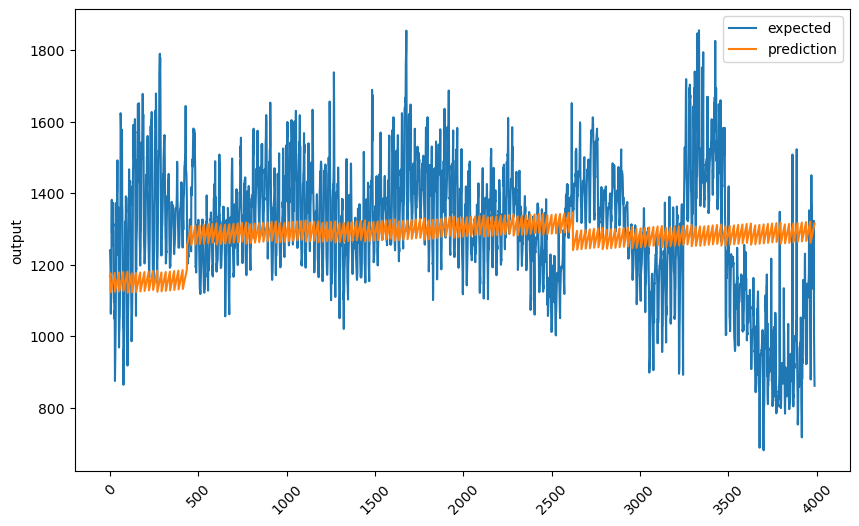

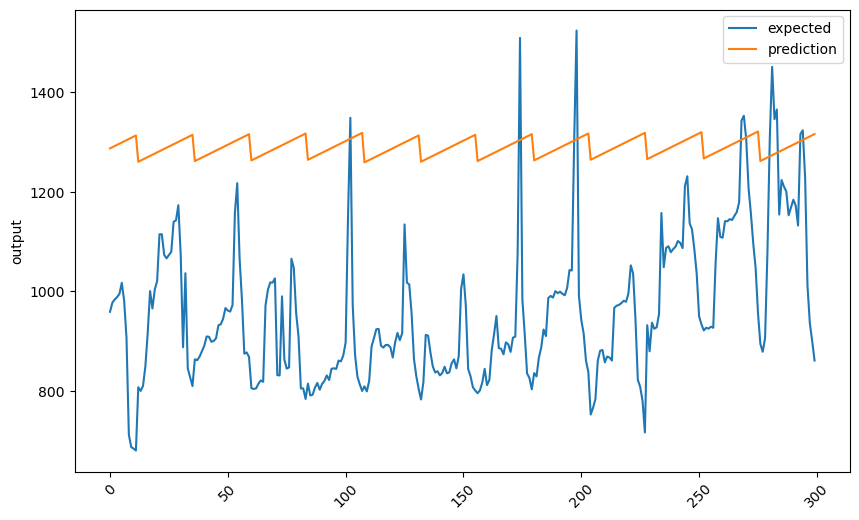

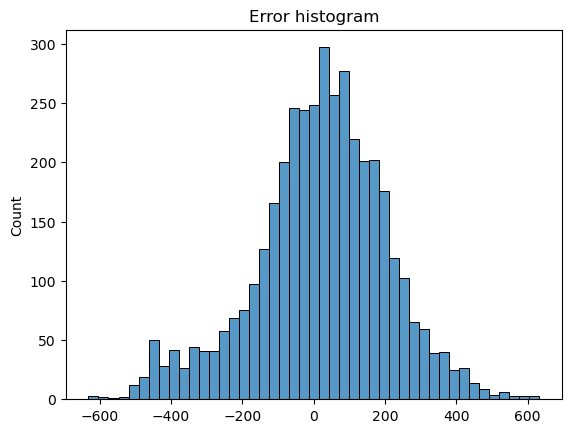

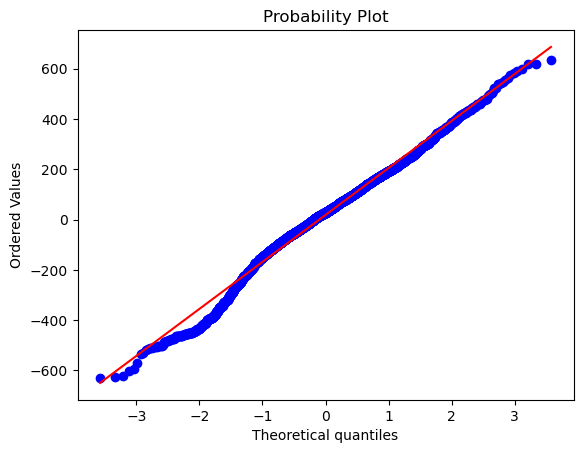

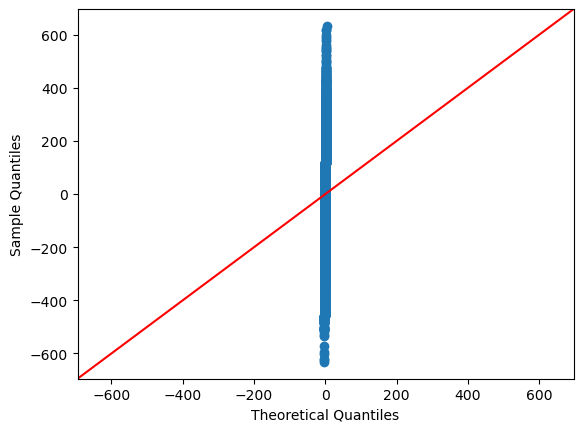

----------
Statistical test for normality of residuals:
----------

D'Agostino & Pearson:  NOT Normal
93.16650292919131

Jarque-Bera:           NOT Normal
107.76225164278874

Kolmogorov-Smirnov:    NOT Normal
0.045821622275513785

Lilliefors:            NOT Normal
0.045821622275513785

Shapiro-Wilk:          NOT Normal
0.9877302050590515

Anderson–Darling:      NOT Normal
15.189441200219335

Done!

----------------
PAR model...
Fold #1...
Fold #2...
Fold #3...
Fold #4...
Fold #5...
Fold #6...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expec

Fold #7...
Fold #8...
Fold #9...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expec

Fold #10...


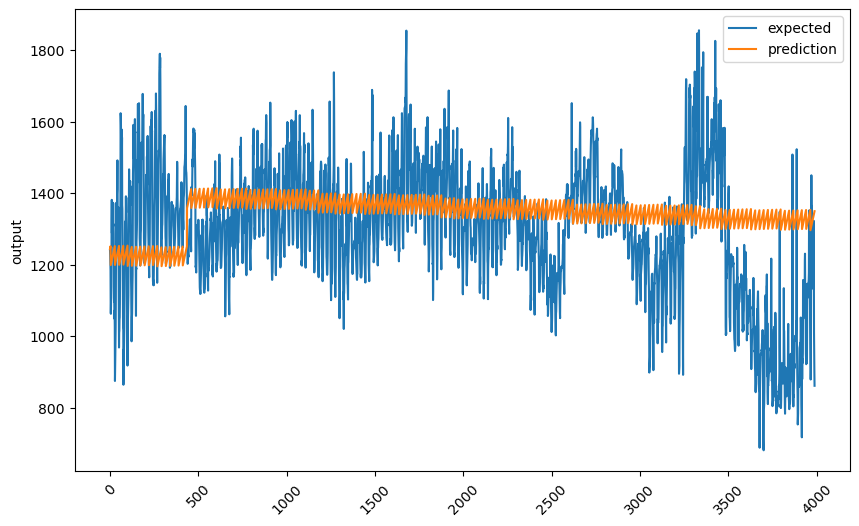

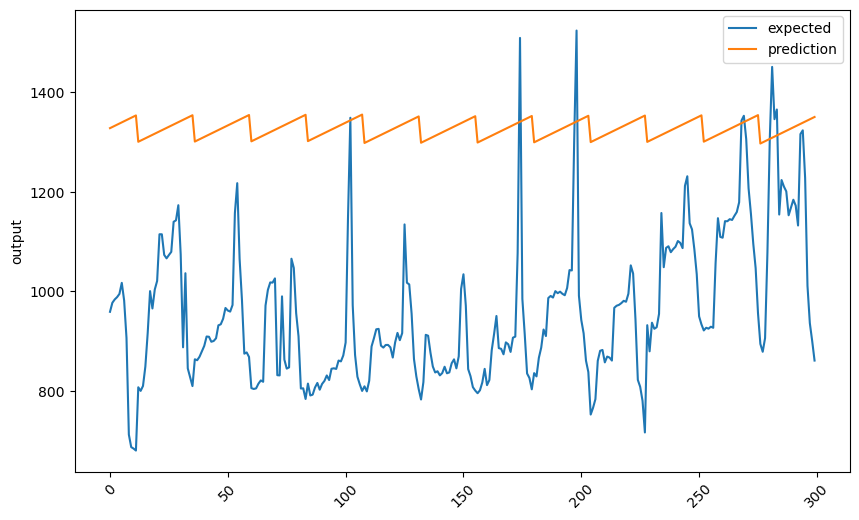

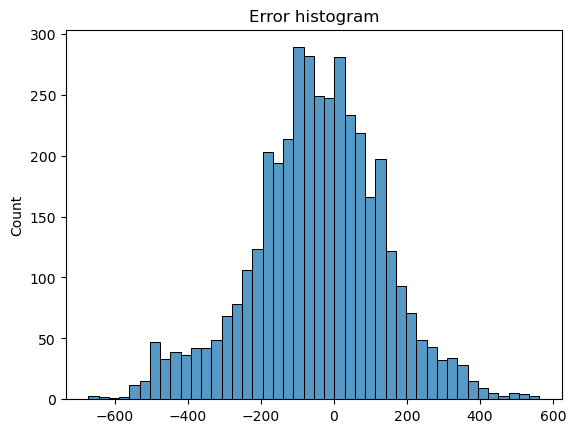

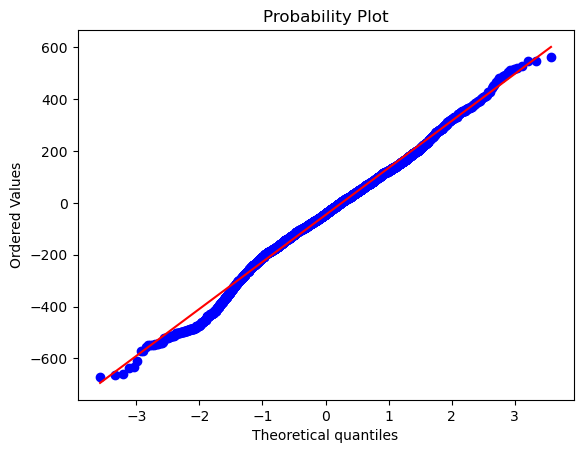

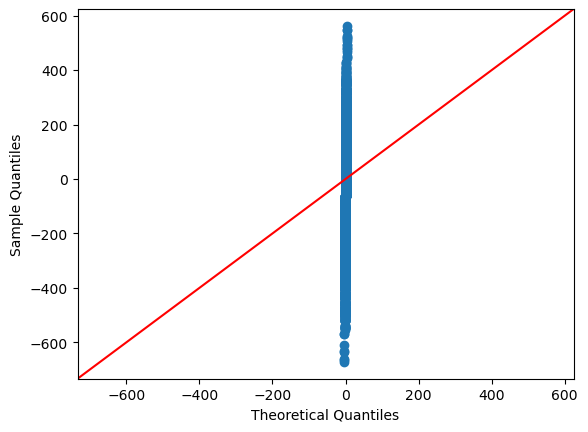

----------
Statistical test for normality of residuals:
----------

D'Agostino & Pearson:  NOT Normal
46.304337715075306

Jarque-Bera:           NOT Normal
54.308654198061205

Kolmogorov-Smirnov:    NOT Normal
0.03483334370982144

Lilliefors:            NOT Normal
0.03483334370982144

Shapiro-Wilk:          NOT Normal
0.9925862550735474

Anderson–Darling:      NOT Normal
8.766714073824005

Done!

----------------
KNN model...
Fold #1...
Fold #2...
Fold #3...
Fold #4...
Fold #5...
Fold #6...
Fold #7...
Fold #8...
Fold #9...
Fold #10...


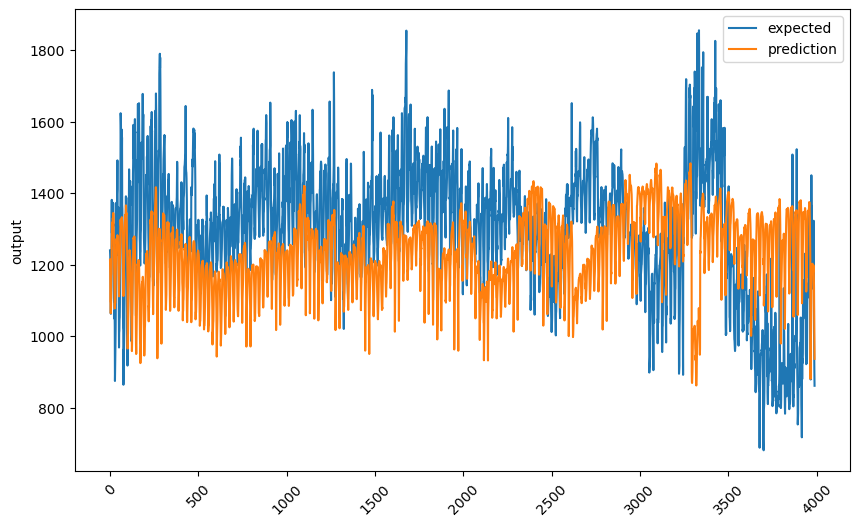

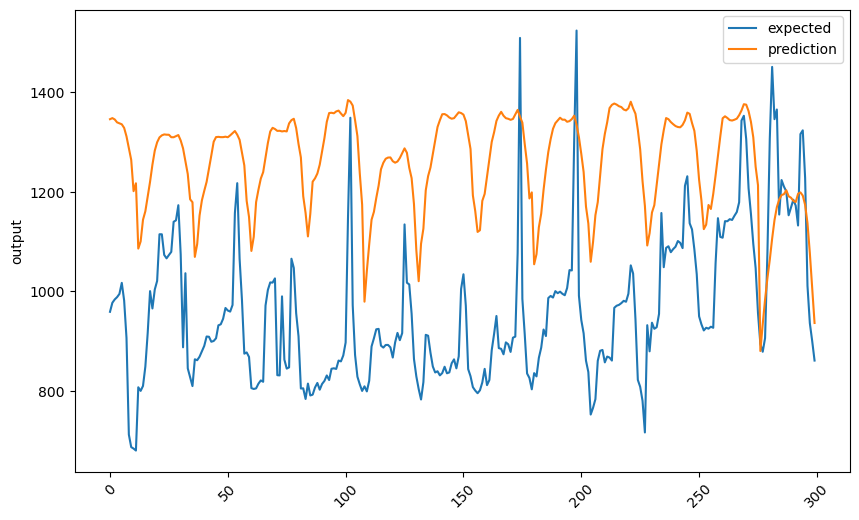

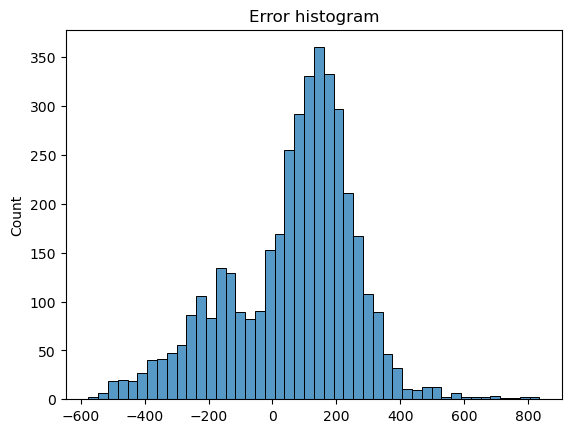

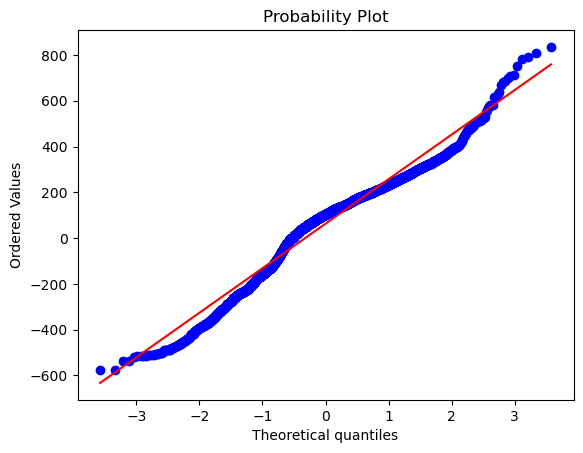

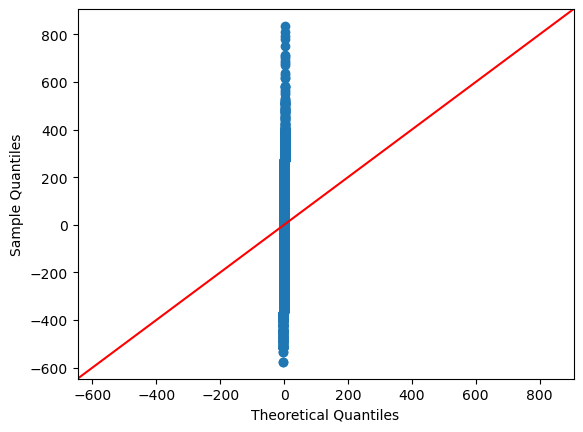

----------
Statistical test for normality of residuals:
----------

D'Agostino & Pearson:  NOT Normal
186.75558174735883

Jarque-Bera:           NOT Normal
215.4510665948102

Kolmogorov-Smirnov:    NOT Normal
0.10019461928620171

Lilliefors:            NOT Normal
0.10019461928620171

Shapiro-Wilk:          NOT Normal
0.9628726840019226

Anderson–Darling:      NOT Normal
62.126709356101856

Done!

----------------
CART model...
Fold #1...
Fold #2...
Fold #3...
Fold #4...
Fold #5...
Fold #6...
Fold #7...
Fold #8...
Fold #9...
Fold #10...


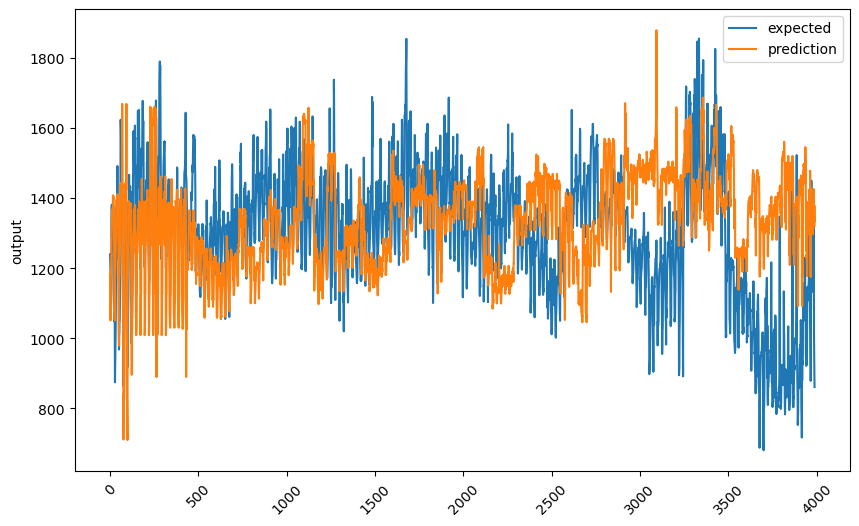

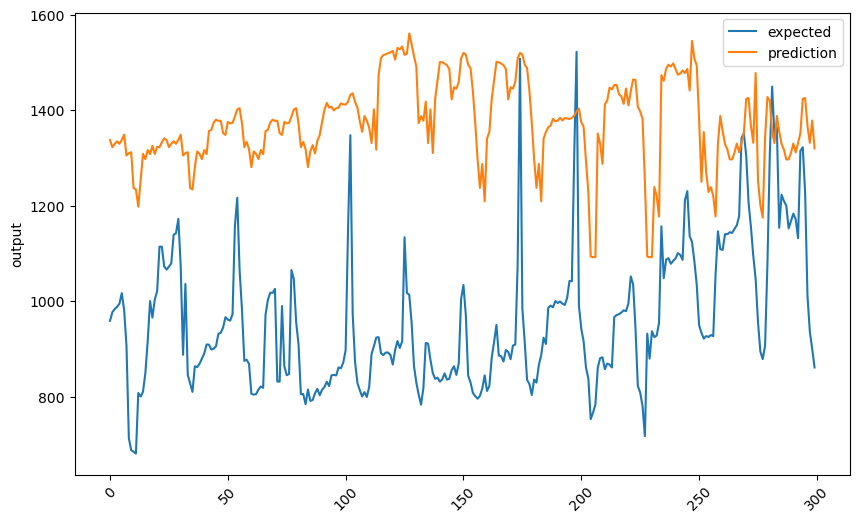

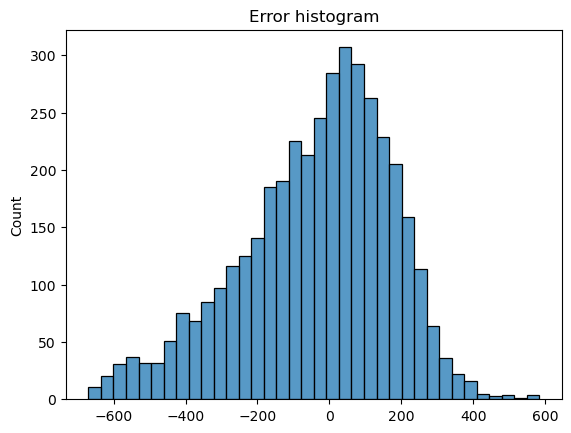

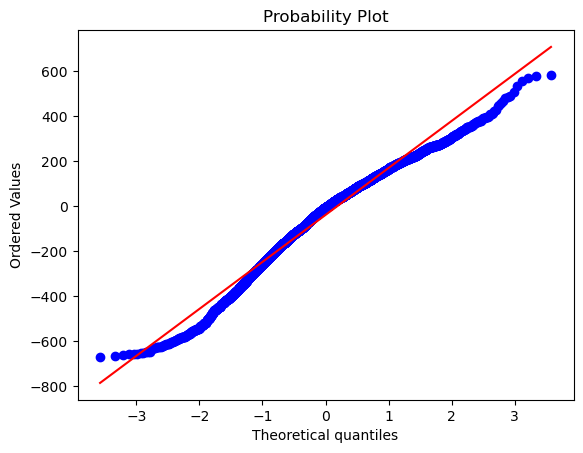

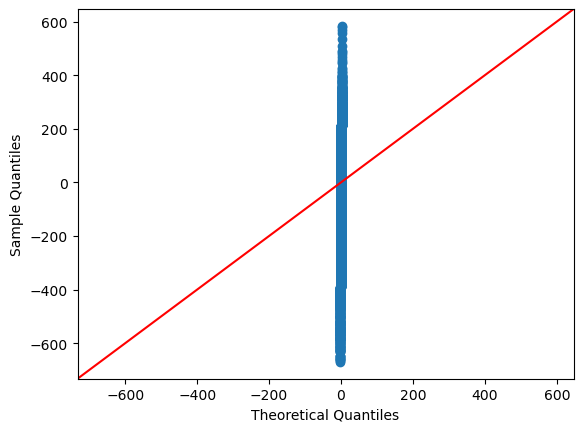

----------
Statistical test for normality of residuals:
----------

D'Agostino & Pearson:  NOT Normal
165.16898563755248

Jarque-Bera:           NOT Normal
185.83765531689085

Kolmogorov-Smirnov:    NOT Normal
0.06283589527065075

Lilliefors:            NOT Normal
0.06283589527065075

Shapiro-Wilk:          NOT Normal
0.9774827361106873

Anderson–Darling:      NOT Normal
27.867775936003

Done!

----------------
RF model...
Fold #1...


C:\Users\dexp\AppData\Local\Temp\ipykernel_14980\521141329.py:34: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #2...


C:\Users\dexp\AppData\Local\Temp\ipykernel_14980\521141329.py:34: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #3...


C:\Users\dexp\AppData\Local\Temp\ipykernel_14980\521141329.py:34: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #4...


C:\Users\dexp\AppData\Local\Temp\ipykernel_14980\521141329.py:34: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #5...


C:\Users\dexp\AppData\Local\Temp\ipykernel_14980\521141329.py:34: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #6...


C:\Users\dexp\AppData\Local\Temp\ipykernel_14980\521141329.py:34: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #7...


C:\Users\dexp\AppData\Local\Temp\ipykernel_14980\521141329.py:34: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #8...


C:\Users\dexp\AppData\Local\Temp\ipykernel_14980\521141329.py:34: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #9...


C:\Users\dexp\AppData\Local\Temp\ipykernel_14980\521141329.py:34: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #10...


C:\Users\dexp\AppData\Local\Temp\ipykernel_14980\521141329.py:34: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


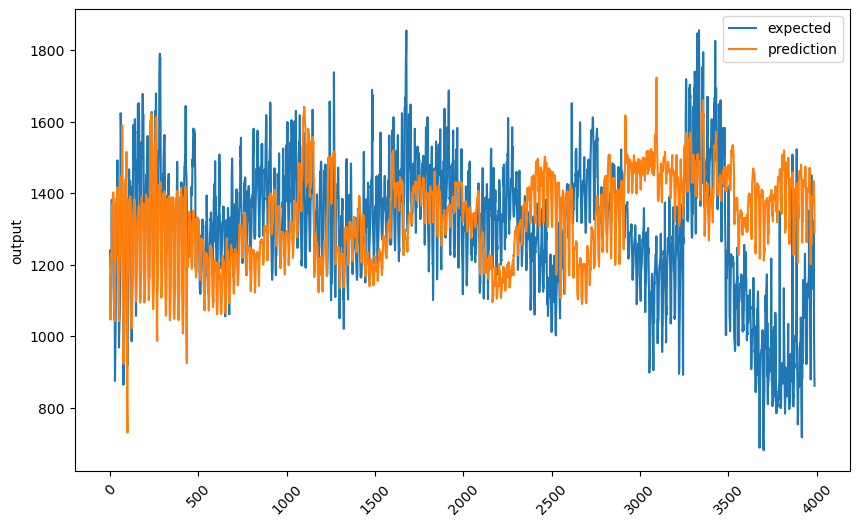

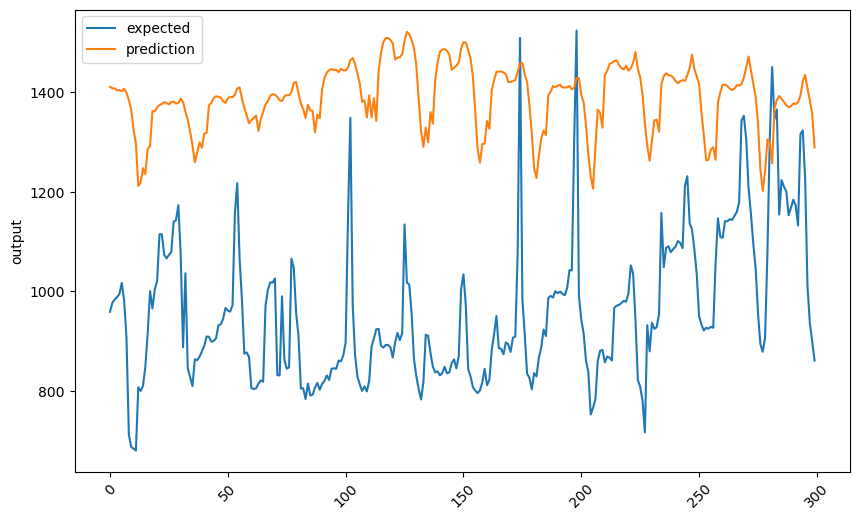

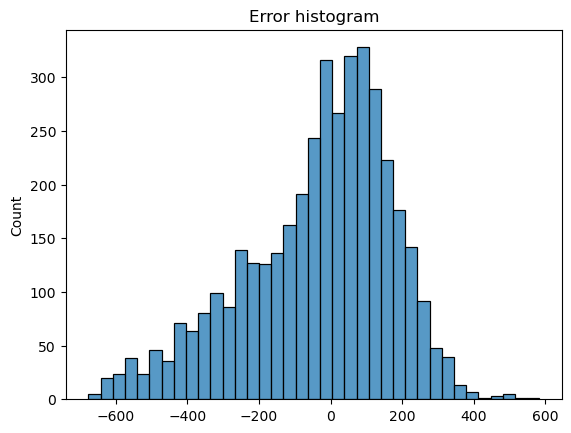

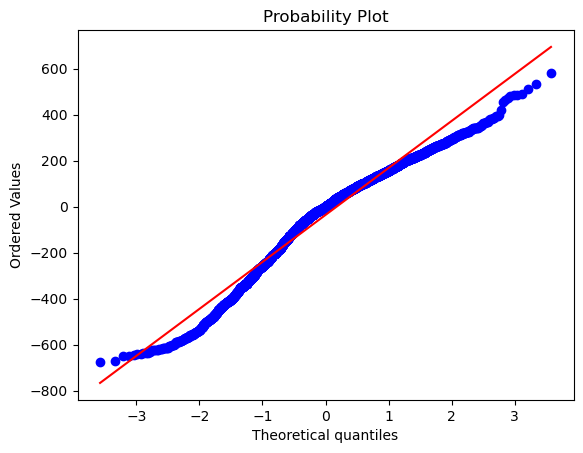

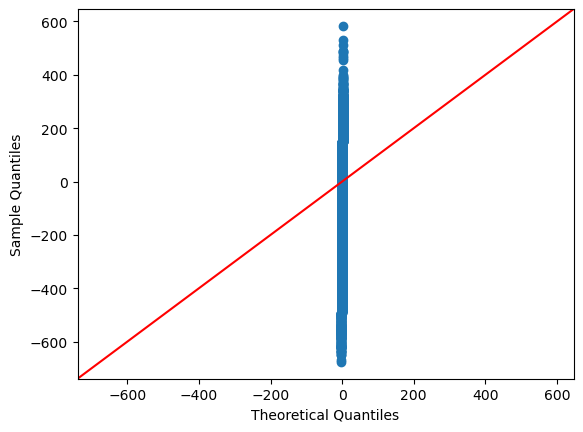

----------
Statistical test for normality of residuals:
----------

D'Agostino & Pearson:  NOT Normal
234.01883266923727

Jarque-Bera:           NOT Normal
276.54901774079894

Kolmogorov-Smirnov:    NOT Normal
0.08499383537892802

Lilliefors:            NOT Normal
0.08499383537892802

Shapiro-Wilk:          NOT Normal
0.9656712412834167

Anderson–Darling:      NOT Normal
46.581110926545534

Done!

----------------
XT model...
Fold #1...


C:\Users\dexp\AppData\Local\Temp\ipykernel_14980\521141329.py:34: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #2...


C:\Users\dexp\AppData\Local\Temp\ipykernel_14980\521141329.py:34: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #3...


C:\Users\dexp\AppData\Local\Temp\ipykernel_14980\521141329.py:34: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #4...


C:\Users\dexp\AppData\Local\Temp\ipykernel_14980\521141329.py:34: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #5...


C:\Users\dexp\AppData\Local\Temp\ipykernel_14980\521141329.py:34: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #6...


C:\Users\dexp\AppData\Local\Temp\ipykernel_14980\521141329.py:34: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #7...


C:\Users\dexp\AppData\Local\Temp\ipykernel_14980\521141329.py:34: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #8...


C:\Users\dexp\AppData\Local\Temp\ipykernel_14980\521141329.py:34: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #9...


C:\Users\dexp\AppData\Local\Temp\ipykernel_14980\521141329.py:34: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


Fold #10...


C:\Users\dexp\AppData\Local\Temp\ipykernel_14980\521141329.py:34: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_train, y_train)


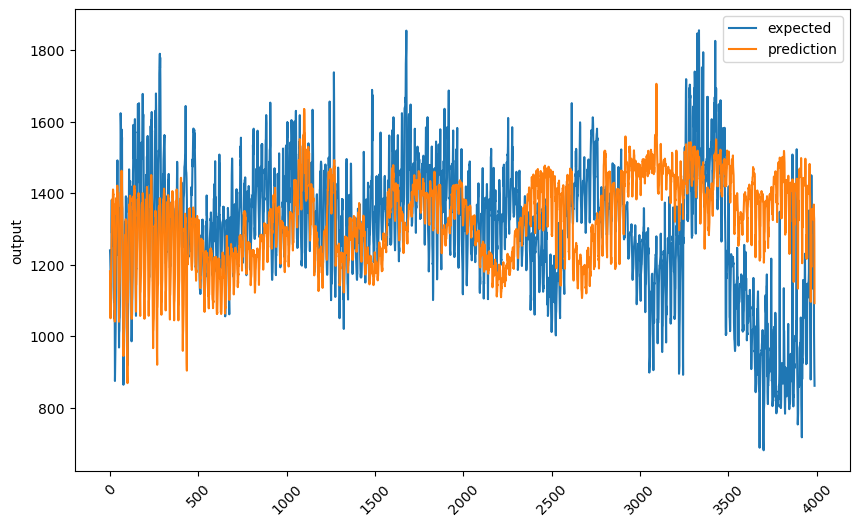

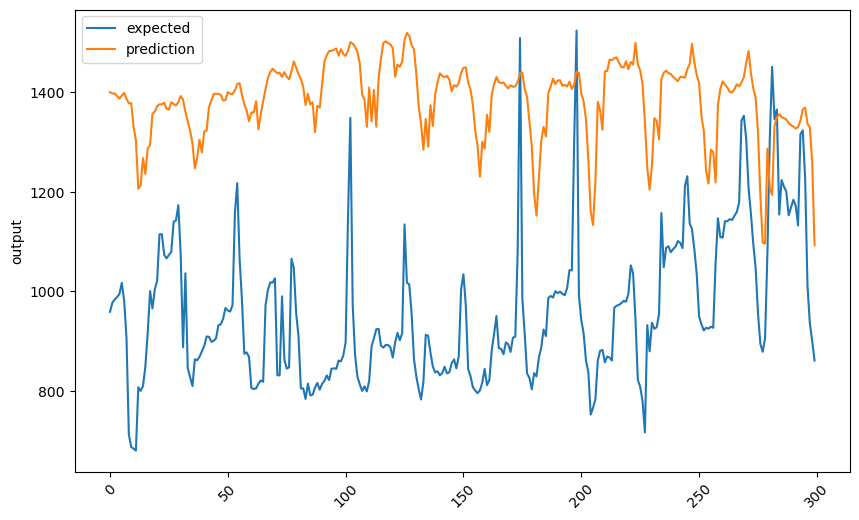

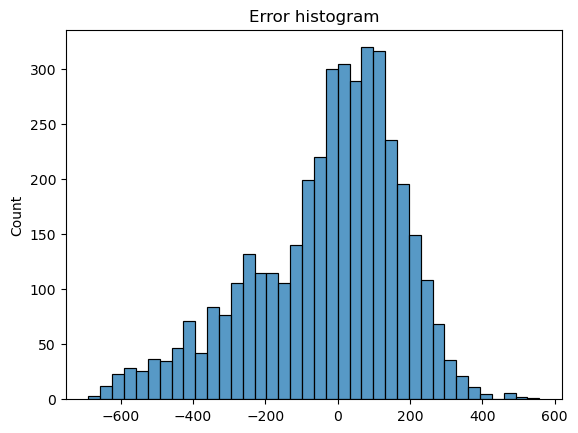

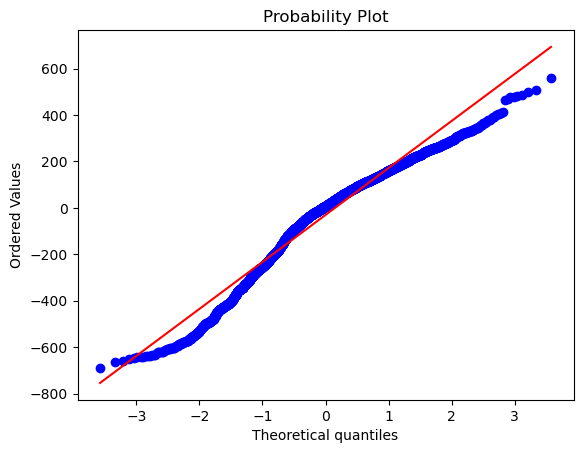

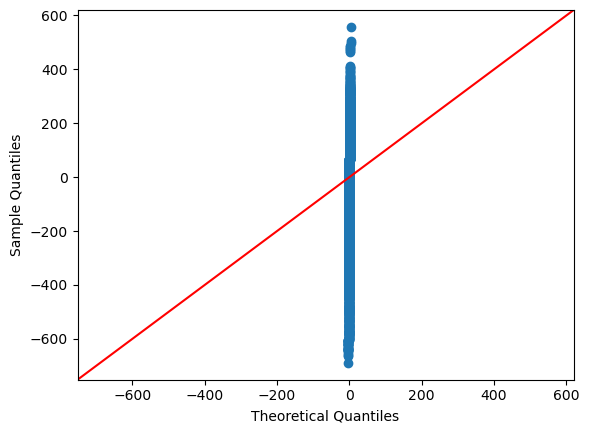

----------
Statistical test for normality of residuals:
----------

D'Agostino & Pearson:  NOT Normal
272.3066054610756

Jarque-Bera:           NOT Normal
329.7908145876835

Kolmogorov-Smirnov:    NOT Normal
0.09030317229348994

Lilliefors:            NOT Normal
0.09030317229348994

Shapiro-Wilk:          NOT Normal
0.9608259797096252

Anderson–Darling:      NOT Normal
53.62424769615791

Done!

----------------
BAG model...
Fold #1...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\ensemble\_bagging.py:508: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return column_or_1d(y, warn=True)


Fold #2...
Fold #3...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\ensemble\_bagging.py:508: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return column_or_1d(y, warn=True)
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\ensemble\_bagging.py:508: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return column_or_1d(y, warn=True)


Fold #4...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\ensemble\_bagging.py:508: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return column_or_1d(y, warn=True)


Fold #5...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\ensemble\_bagging.py:508: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return column_or_1d(y, warn=True)


Fold #6...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\ensemble\_bagging.py:508: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return column_or_1d(y, warn=True)


Fold #7...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\ensemble\_bagging.py:508: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return column_or_1d(y, warn=True)


Fold #8...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\ensemble\_bagging.py:508: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return column_or_1d(y, warn=True)


Fold #9...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\ensemble\_bagging.py:508: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return column_or_1d(y, warn=True)


Fold #10...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\ensemble\_bagging.py:508: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return column_or_1d(y, warn=True)


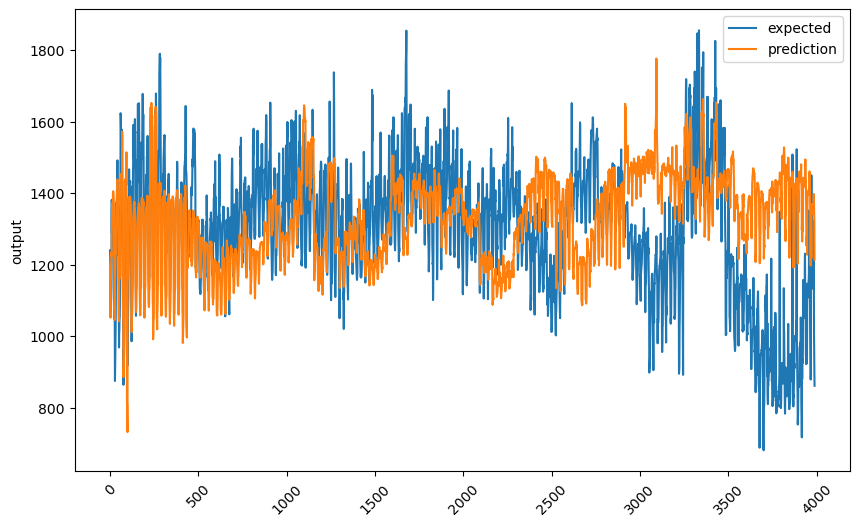

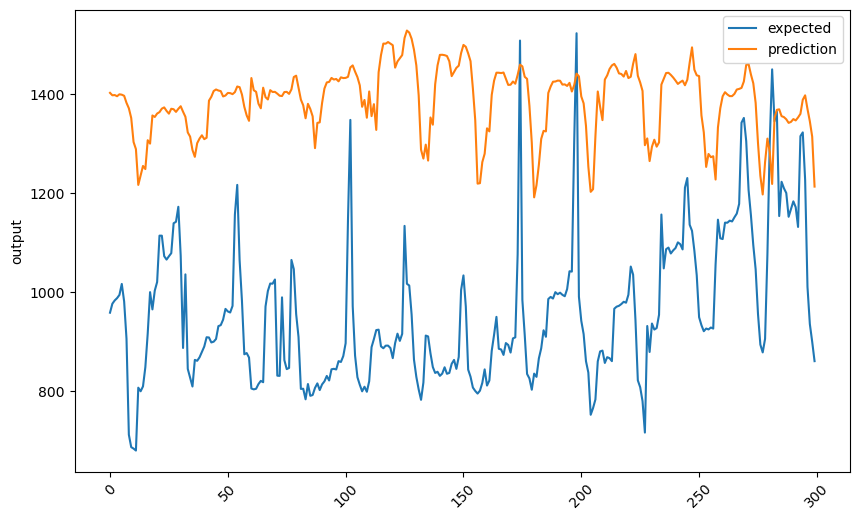

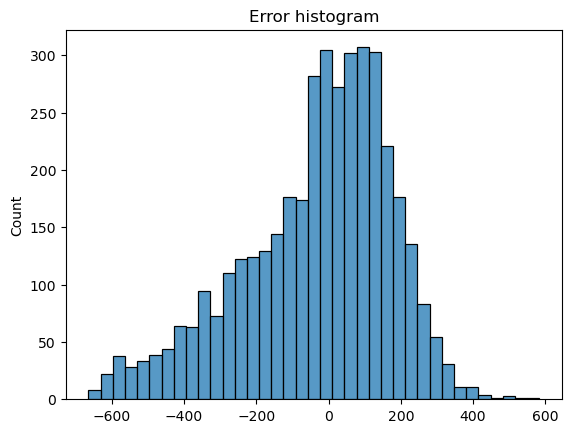

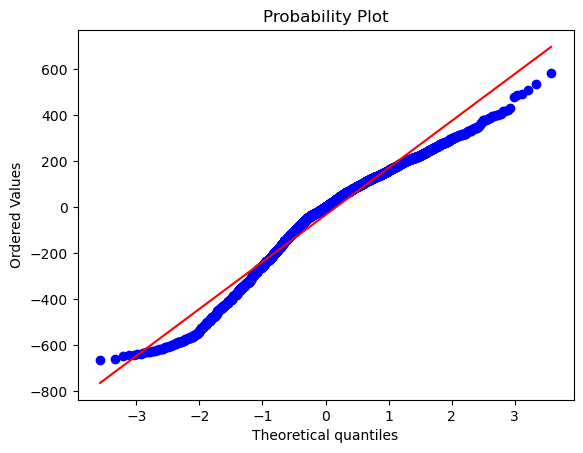

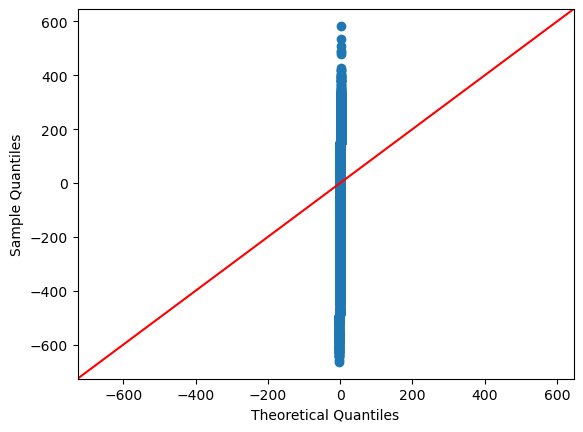

----------
Statistical test for normality of residuals:
----------

D'Agostino & Pearson:  NOT Normal
243.65071720901977

Jarque-Bera:           NOT Normal
289.74542064147613

Kolmogorov-Smirnov:    NOT Normal
0.08737658295239459

Lilliefors:            NOT Normal
0.08737658295239459

Shapiro-Wilk:          NOT Normal
0.9647601842880249

Anderson–Darling:      NOT Normal
46.759624149432966

Done!

----------------
ADA model...
Fold #1...
Fold #2...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Fold #3...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Fold #4...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Fold #5...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Fold #6...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Fold #7...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Fold #8...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Fold #9...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Fold #10...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


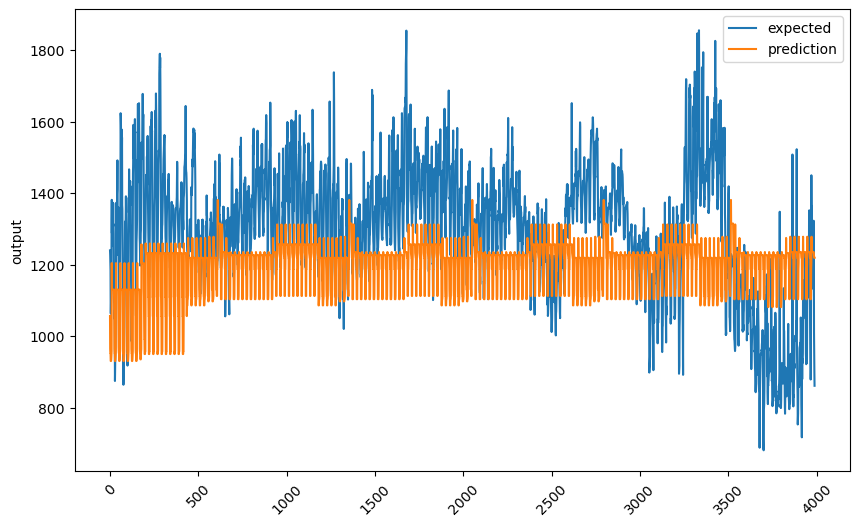

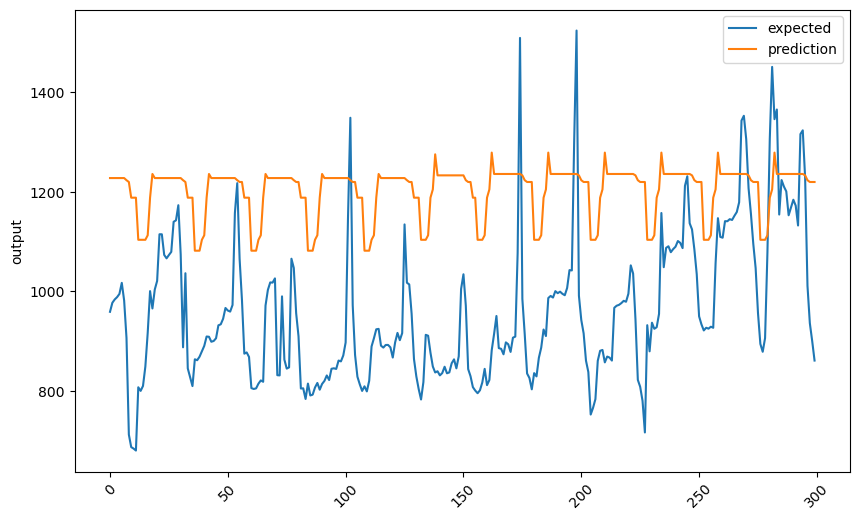

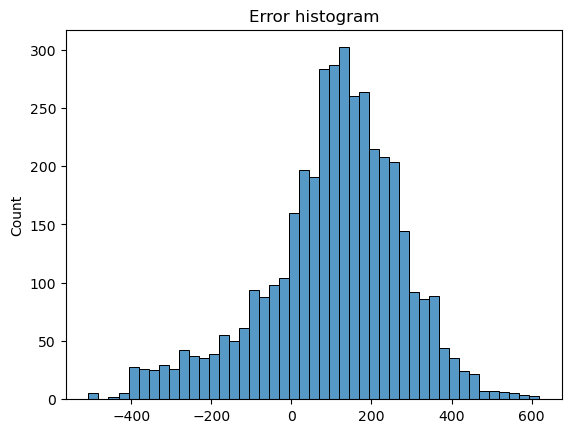

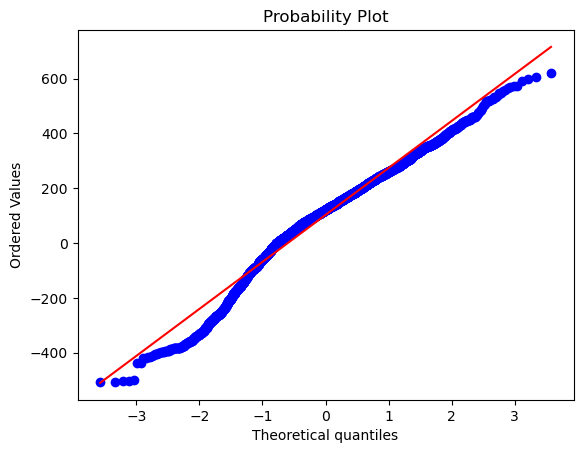

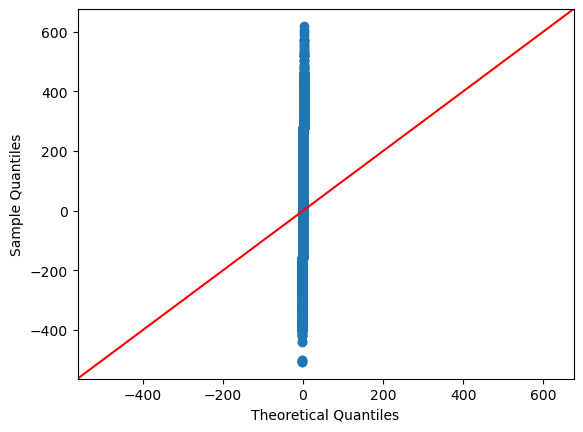

----------
Statistical test for normality of residuals:
----------

D'Agostino & Pearson:  NOT Normal
243.46527649929186

Jarque-Bera:           NOT Normal
299.4632374008431

Kolmogorov-Smirnov:    NOT Normal
0.07320577043615678

Lilliefors:            NOT Normal
0.07320577043615678

Shapiro-Wilk:          NOT Normal
0.9733683466911316

Anderson–Darling:      NOT Normal
33.5725328396984

Done!

----------------
HGBoost model...
Fold #1...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Fold #2...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Fold #3...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Fold #4...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Fold #5...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Fold #6...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Fold #7...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Fold #8...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Fold #9...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Fold #10...


C:\Users\dexp\miniconda3\envs\energy\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


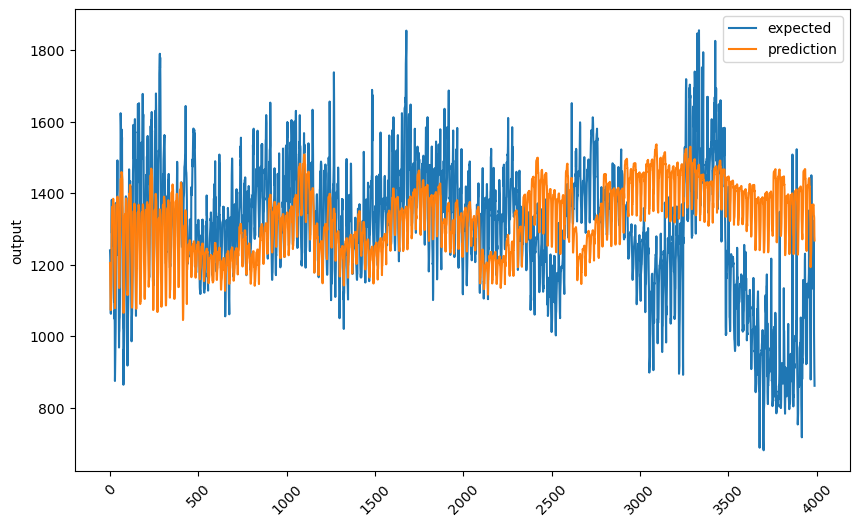

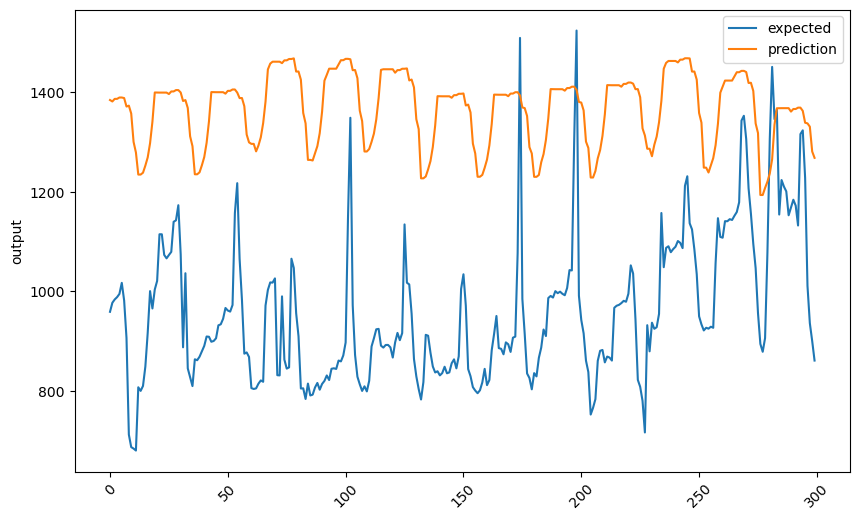

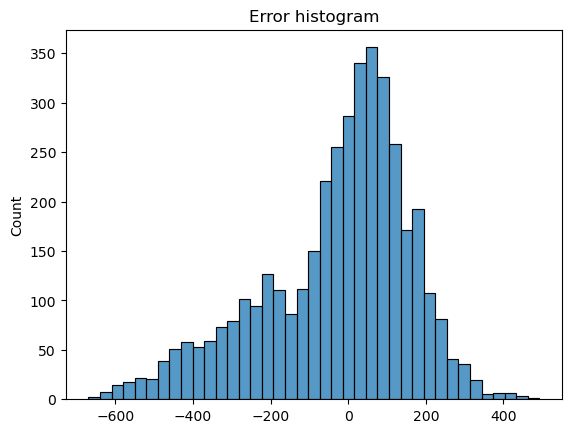

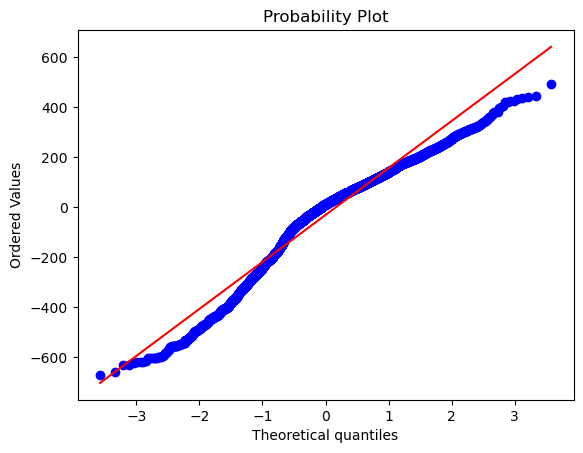

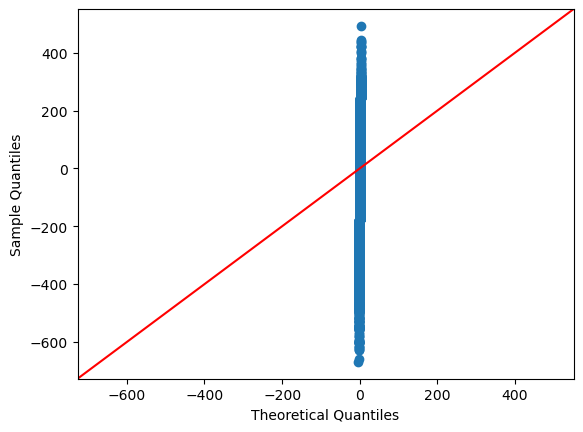

----------
Statistical test for normality of residuals:
----------

D'Agostino & Pearson:  NOT Normal
299.2514646520089

Jarque-Bera:           NOT Normal
368.86713545857685

Kolmogorov-Smirnov:    NOT Normal
0.10107673916254006

Lilliefors:            NOT Normal
0.10107673916254006

Shapiro-Wilk:          NOT Normal
0.9550840258598328

Anderson–Darling:      NOT Normal
66.68110358102422

Done!

----------------
XGBoost model...
Fold #1...
Fold #2...
Fold #3...
Fold #4...
Fold #5...
Fold #6...
Fold #7...
Fold #8...
Fold #9...
Fold #10...


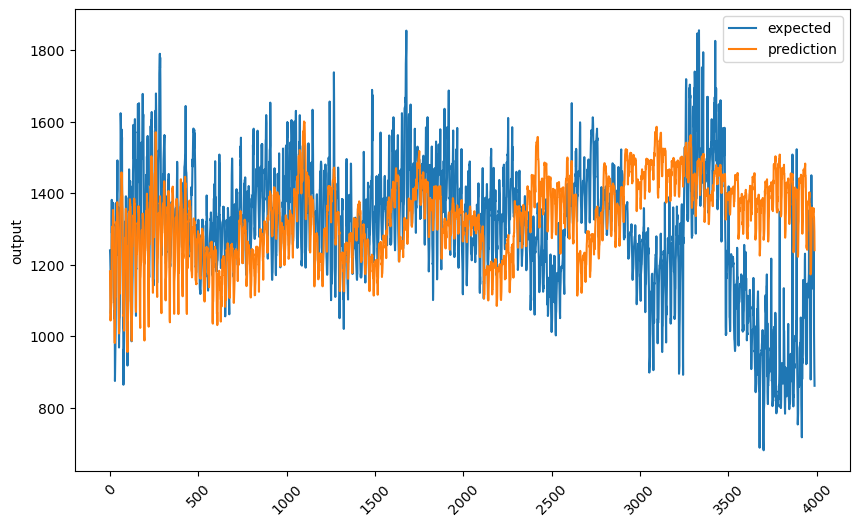

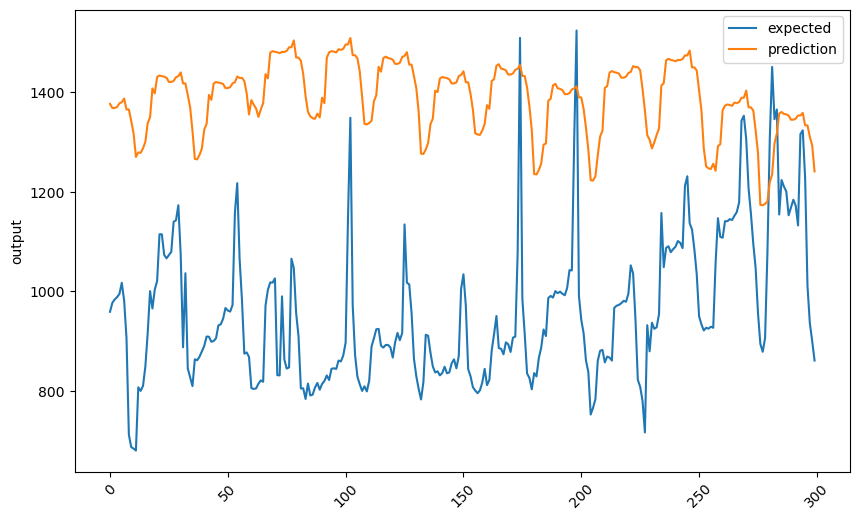

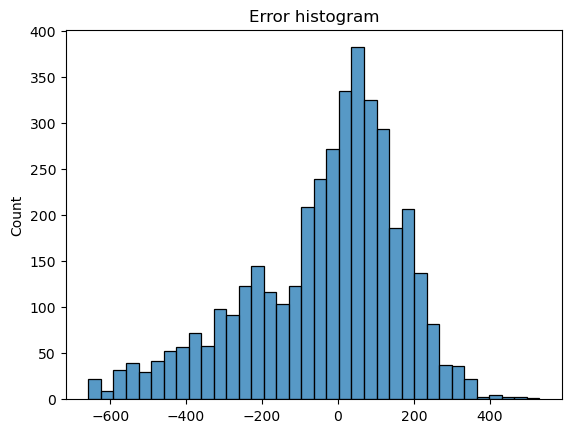

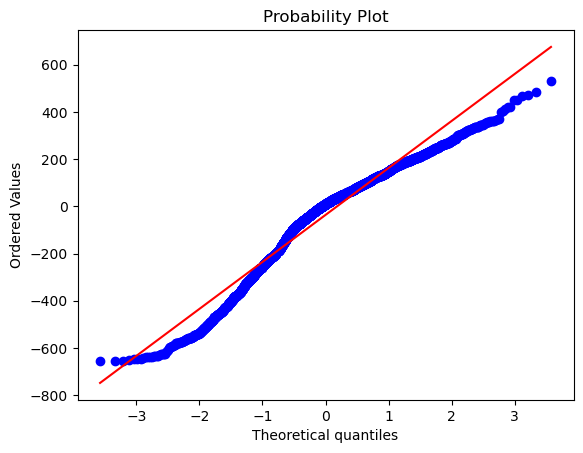

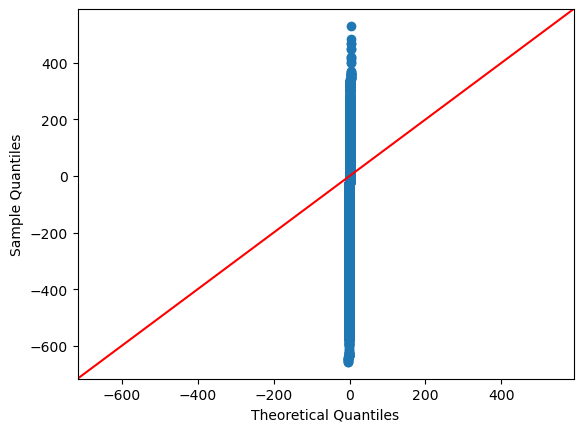

----------
Statistical test for normality of residuals:
----------

D'Agostino & Pearson:  NOT Normal
298.46623725268154

Jarque-Bera:           NOT Normal
368.0806645269418

Kolmogorov-Smirnov:    NOT Normal
0.09811805561992376

Lilliefors:            NOT Normal
0.09811805561992376

Shapiro-Wilk:          NOT Normal
0.9552528262138367

Anderson–Darling:      NOT Normal
63.15408505718551

Done!

----------------
CatBoost model...
Fold #1...


Default metric period is 5 because MAE is/are not implemented for GPU


Fold #2...


Default metric period is 5 because MAE is/are not implemented for GPU


Fold #3...


Default metric period is 5 because MAE is/are not implemented for GPU


Fold #4...


Default metric period is 5 because MAE is/are not implemented for GPU


Fold #5...


Default metric period is 5 because MAE is/are not implemented for GPU


Fold #6...


Default metric period is 5 because MAE is/are not implemented for GPU


Fold #7...


Default metric period is 5 because MAE is/are not implemented for GPU


Fold #8...


Default metric period is 5 because MAE is/are not implemented for GPU


Fold #9...


Default metric period is 5 because MAE is/are not implemented for GPU


Fold #10...


Default metric period is 5 because MAE is/are not implemented for GPU


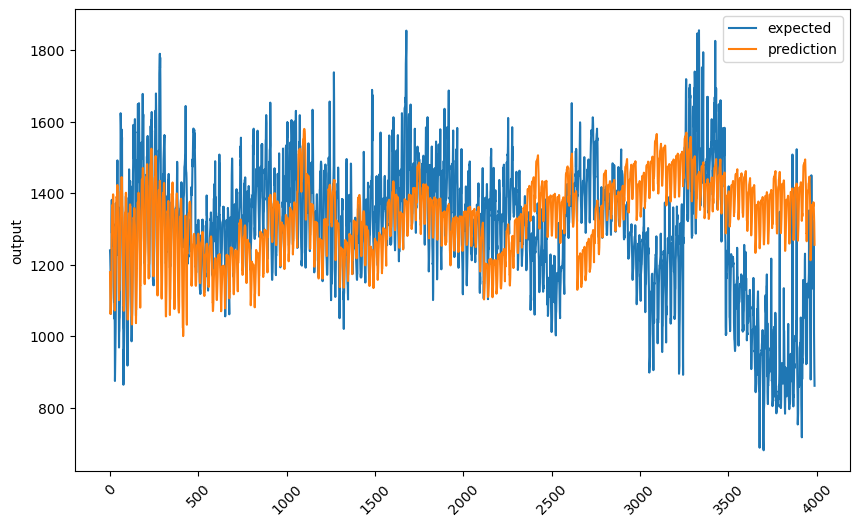

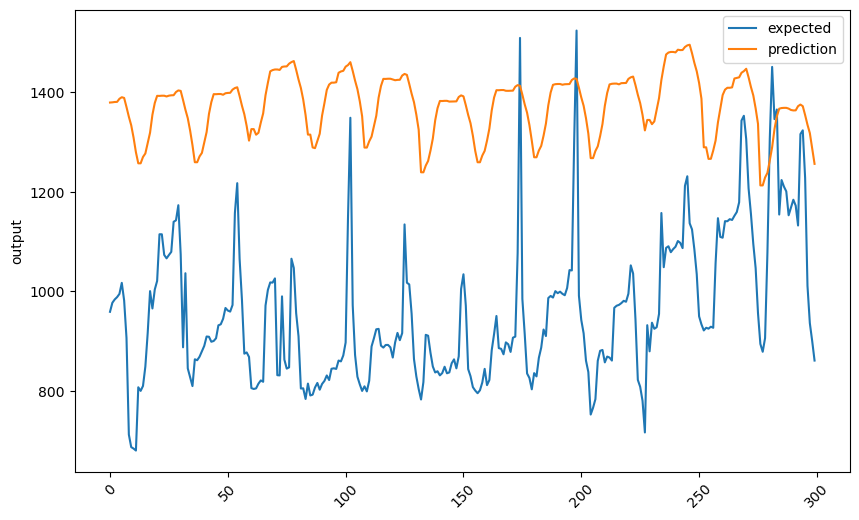

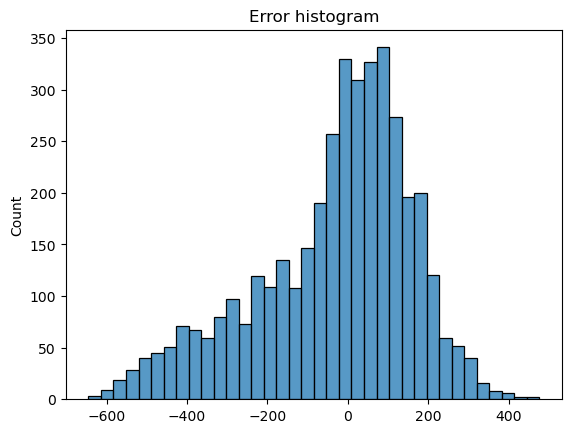

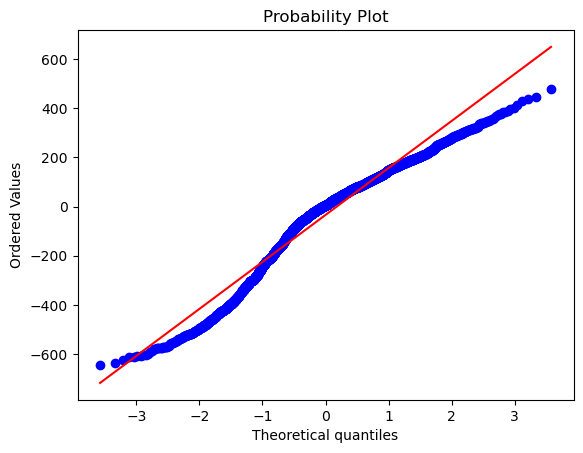

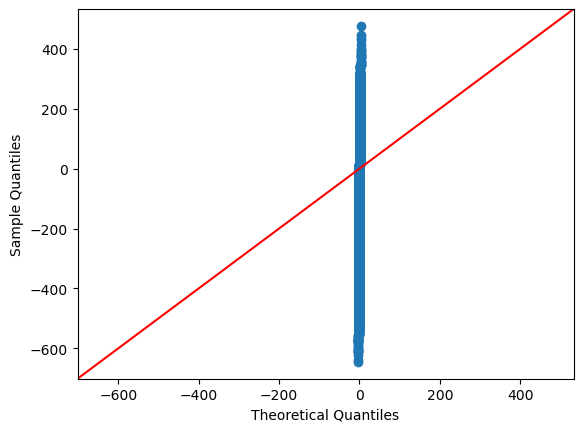

----------
Statistical test for normality of residuals:
----------

D'Agostino & Pearson:  NOT Normal
279.6218265065071

Jarque-Bera:           NOT Normal
341.3151526376105

Kolmogorov-Smirnov:    NOT Normal
0.09842928156030945

Lilliefors:            NOT Normal
0.09842928156030945

Shapiro-Wilk:          NOT Normal
0.9554531574249268

Anderson–Darling:      NOT Normal
64.45514011470596

Done!



In [13]:
names = []
num_of_splits = 10
latest_pred_amount = 300
for name, model in models:
    names.append(name)
    print('----------------')
    print(f'{name} model...')
    model_results = {
        'r2' : [],
        'mse' : [],
        'rmse' : [],
        'mae' : [],
        'mape' : [],
        'smape' : []
    }
    fold_num = 1
    timeFold = TimeSeriesSplit(n_splits = num_of_splits)
    df_train = df_sup.copy()
    for train_range, test_range in timeFold.split(df_train):
        print(f'Fold #{fold_num}...')
        train = df_train.iloc[train_range]
        test = df_train.iloc[test_range]
        columns_to_scale = [
            'supplier_price'
        ]
        target_column = 'supplier_price'
        train_scaled, test_scaled, scaler = scale_train_and_test(train, test, columns_to_scale)
        x_train, y_train = train_scaled.drop(columns = target_column), train_scaled[[target_column]]
        x_test, y_test = test_scaled.drop(columns = target_column), test_scaled[[target_column]]
        if name == 'Dummy':
            model.constant_ = y_train.iloc[-1][0]
            model.n_outputs_ = 1
        else:
            model.fit(x_train, y_train)
        y_pred = model.predict(x_test)
        y_pred_df = pd.DataFrame(y_pred, index = y_test.index, columns = [target_column])
        y_test_inv = scaler.inverse_transform(y_test).flatten()
        y_pred_inv = scaler.inverse_transform(y_pred_df).flatten()
        model_results['r2'].append(r2(y_test_inv, y_pred_inv))
        mse_result = mse(y_test_inv, y_pred_inv)
        model_results['mse'].append(mse_result)
        model_results['rmse'].append(np.sqrt(mse_result))
        model_results['mae'].append(mae(y_test_inv, y_pred_inv))
        model_results['mape'].append(mape(y_test_inv, y_pred_inv))
        model_results['smape'].append(smape(y_test_inv, y_pred_inv))
        if fold_num == num_of_splits:
            show_regression_chart(y_test_inv, y_pred_inv, sort = False)
            show_regression_chart(y_test_inv[-latest_pred_amount:], y_pred_inv[-latest_pred_amount:], sort = False)
            show_error_histogram(y_test_inv, y_pred_inv)
            resudials = y_test_inv - y_pred_inv
            show_probability_plot(resudials)
            show_quantile_quantile_plot(resudials)
            print('-' * 10)
            print('Statistical test for normality of residuals:')
            print('-' * 10)
            print()
            run_tests_for_normality(resudials)
        fold_num += 1
    for model_result_key, model_result_value in model_results.items():
        results[model_result_key].append(model_result_value)
    print('Done!')
    print()

#### Results

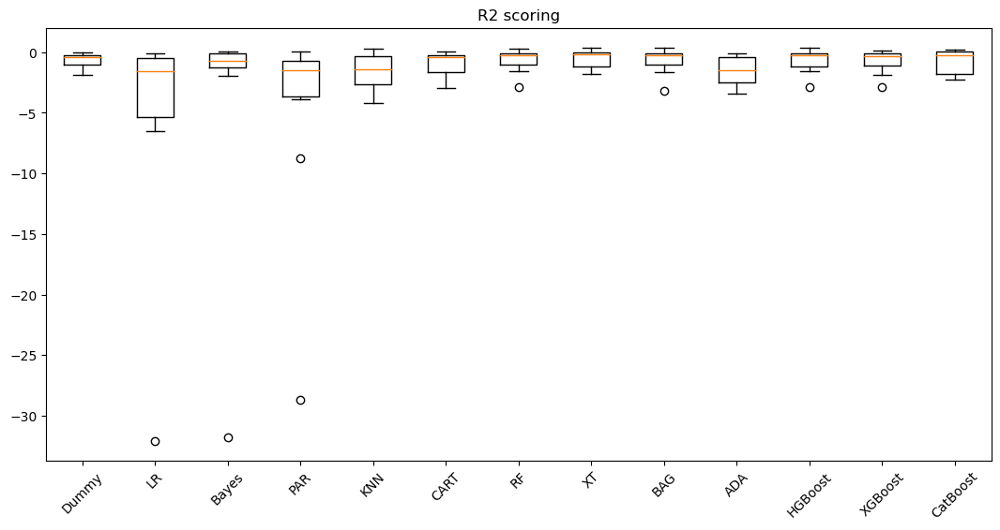

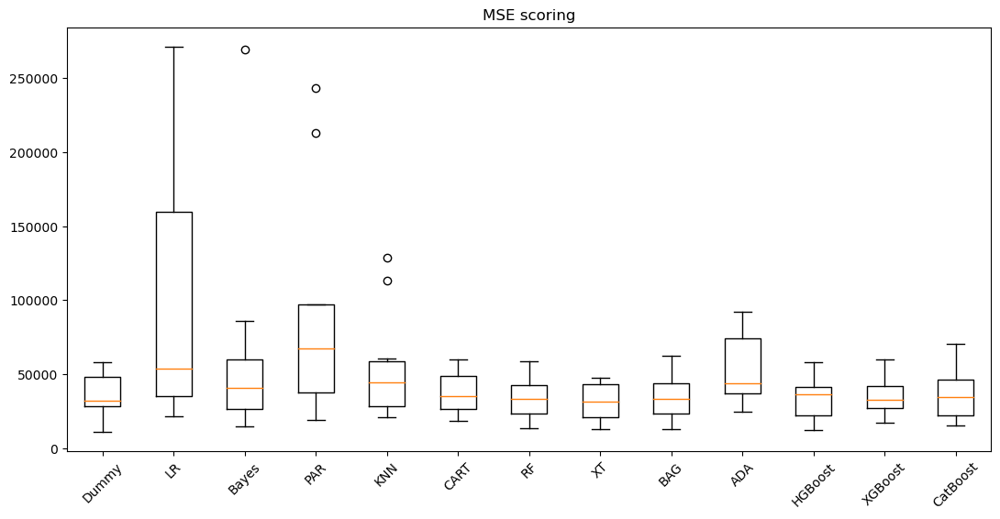

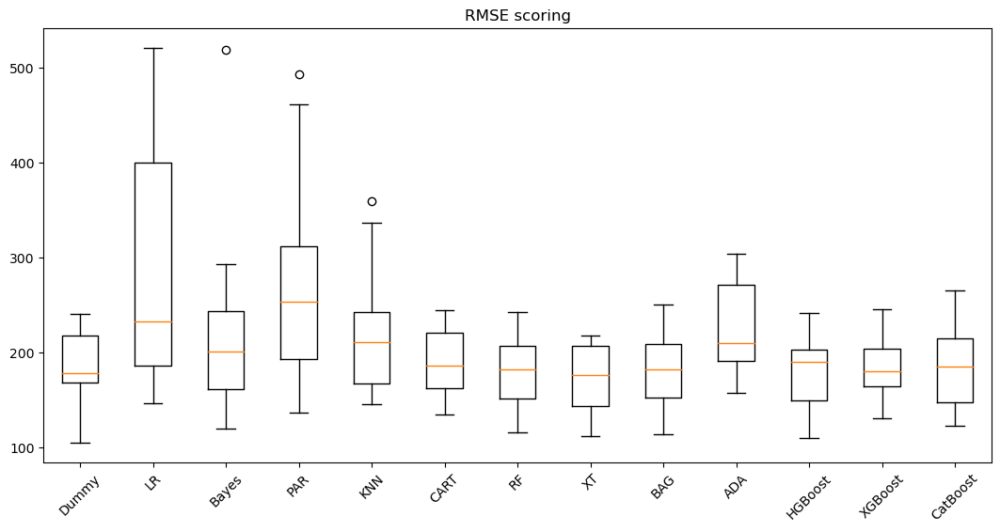

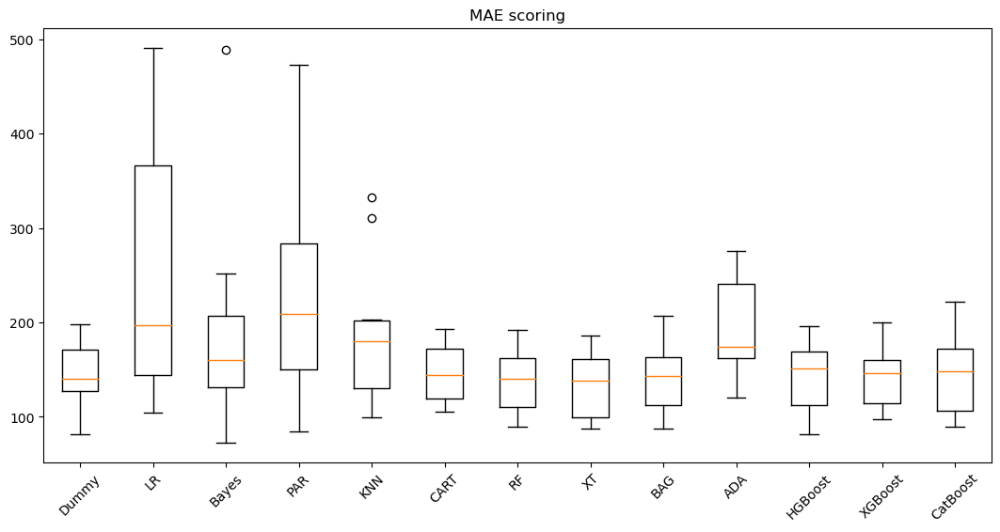

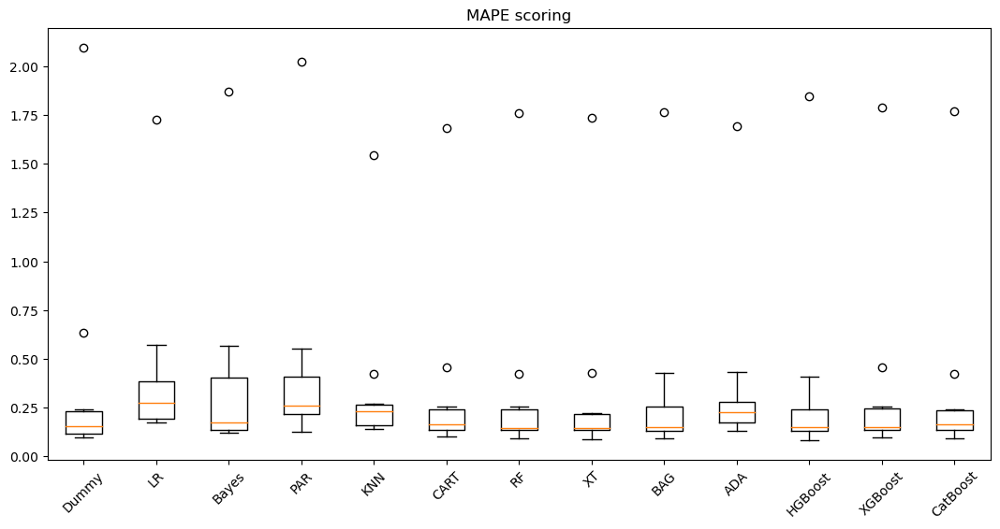

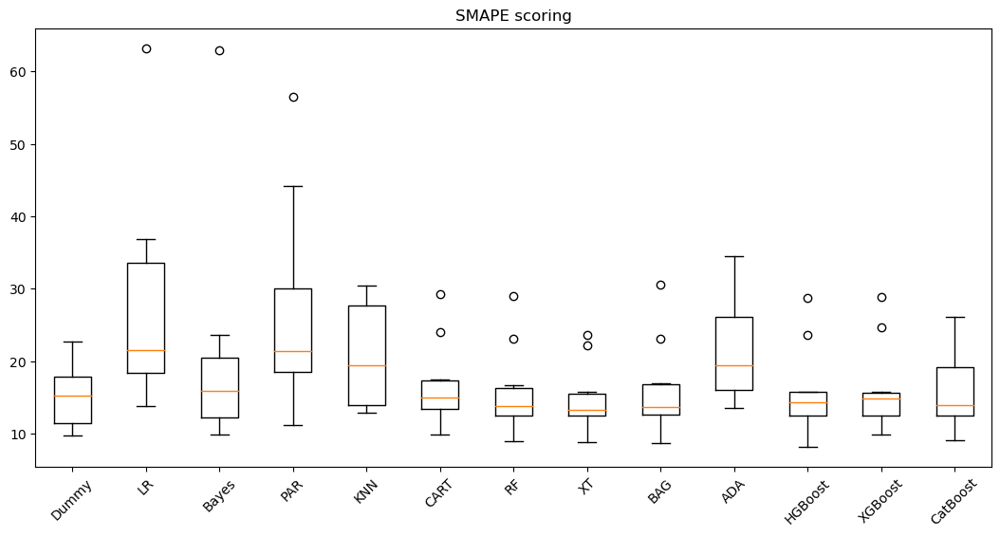

In [14]:
for result_key, result_value in results.items():
    plt.figure(figsize = (13, 6))
    plt.title(f'{result_key.upper()} scoring')
    plt.boxplot(result_value, labels = names)
    plt.xticks(rotation = 45)
    plt.show()

In [16]:
for result_key, result_value in results.items():
    title = f'{result_key.upper()} scoring'
    print('-' * len(title))
    print(title)
    print('-' * len(title))
    for name, values in zip(names, result_value):
        if result_key == 'mape':
            print(f'{name}: {np.median(values) * 100:.4f}')
        else:
            print(f'{name}: {np.median(values):.4f}')
    print()

----------
R2 scoring
----------
Dummy: -0.3999
LR: -1.5708
Bayes: -0.7028
PAR: -1.5239
KNN: -1.4397
CART: -0.4338
RF: -0.2761
XT: -0.1837
BAG: -0.2859
ADA: -1.4508
HGBoost: -0.2541
XGBoost: -0.3458
CatBoost: -0.2831

-----------
MSE scoring
-----------
Dummy: 31739.3993
LR: 53946.9220
Bayes: 40380.0598
PAR: 67252.5667
KNN: 44383.0455
CART: 34982.2867
RF: 33377.2561
XT: 31341.4654
BAG: 33282.4801
ADA: 44057.8267
HGBoost: 36207.4926
XGBoost: 32461.7440
CatBoost: 34242.4980

------------
RMSE scoring
------------
Dummy: 178.1004
LR: 232.2638
Bayes: 200.5958
PAR: 253.7372
KNN: 210.6548
CART: 186.5080
RF: 182.3214
XT: 176.4804
BAG: 182.1811
ADA: 209.7777
HGBoost: 190.2403
XGBoost: 179.9138
CatBoost: 185.0373

-----------
MAE scoring
-----------
Dummy: 140.4401
LR: 197.0638
Bayes: 159.7416
PAR: 208.8558
KNN: 180.2806
CART: 144.5563
RF: 139.8279
XT: 138.7733
BAG: 142.9046
ADA: 173.8986
HGBoost: 151.2188
XGBoost: 145.8415
CatBoost: 148.3669

------------
MAPE scoring
------------
Dummy: 15.28

# Conclusion

Popular ML models can't accurately predict prices of Russian day-ahead electricity market because of high variance. Also regression models can't give accurate prediciton because of high bias. 

Further investigation of the topic is needed.